# Download the dataset and supporting codes and pre-trained models

https://drive.google.com/file/d/1D3m6I2S8xIvdOHBkvwSSFof5OTJZCDSt/view?usp=drivesdk

https://drive.google.com/file/d/1CDRMyBA3Hk_gmbk1xkAm7aRHXBOQQigu/view?usp=drivesdk

https://drive.google.com/file/d/1so6AQ0_Pg255COjAzEOOVPlDzTJFVQro/view?usp=drivesdk

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import auth
auth.authenticate_user()
from googleapiclient.discovery import build
drive_service = build('drive', 'v3')
import io
import os
from googleapiclient.http import MediaIoBaseDownload
def download_file(fn, file_id):
    request = drive_service.files().get_media(fileId=file_id)
    downloaded = io.BytesIO()
    downloader = MediaIoBaseDownload(downloaded, request)
    done = False
    while done is False:
        # _ is a placeholder for a progress object that we ignore.
        # (Our file is small, so we skip reporting progress.)
        _, done = downloader.next_chunk()
    downloaded.seek(0)
    folder = fn.split('/')
    if len(folder) > 1:
        os.makedirs(folder[0], exist_ok=True)
    with open(fn, 'wb') as f:
        f.write(downloaded.read())
id_to_fn = {
# '1D3rH-gSxIECZnoyc5k77PEucKBVzoiBc': 'edges2shoes.zip',
'1D3m6I2S8xIvdOHBkvwSSFof5OTJZCDSt': 'edges2shoes.zip',
'1CDRMyBA3Hk_gmbk1xkAm7aRHXBOQQigu': 'CycleGAN_support.zip',
# '1so6AQ0_Pg255COjAzEOOVPlDzTJFVQro': 'test_case.zip',
'1l7gHikhCz64hYHL4n_Ps7nufQcddcRyR': 'test_case.zip'

}
# download all files into the vm
for fid, fn in id_to_fn.items():
    print("Downloading %s from %s" % (fn, fid))
    download_file(fn, fid)

In [ ]:
! unzip -q -o edges2shoes.zip
! unzip -q -o CycleGAN_support.zip
! unzip -q -o test_case.zip

# CycleGAN training (TODO)

In [ ]:
import torch
import pdb

D_A = torch.load('test_case/D_A.pt')
D_B = torch.load('test_case/D_B.pt')
G_BA = torch.load('test_case/G_BA.pt')
G_AB = torch.load('test_case/G_AB.pt')
valid = torch.load('test_case/valid.pt')
fake = torch.load('test_case/fake.pt')
fake_A = torch.load('test_case/fake_A.pt')
fake_B = torch.load('test_case/fake_B.pt')
real_A = torch.load('test_case/real_A.pt')
real_B = torch.load('test_case/real_B.pt')
criterion_GAN = torch.load('test_case/criterion_GAN.pt')
criterion_cycle = torch.load('test_case/criterion_cycle.pt')



def loss_discriminator(fakefG, D, real2D, valid, fake, criterion_GAN):
    '''
    loss_discriminator function is applied to compute loss for discriminator D_A and D_B,
    For example, we want to compute loss for D_A. The loss is consisted of two parts: 
    D(real_A) and D(G(real_B)). We want to penalize the distance between D(real_A) part and 1 and 
    distance between D(G(real_B)) part and 0. 
    We will want to first compute discriminator loss given real_A and valid, which is all 1.
    Then we want to forward real_A through G_AB network to get fake image batch 
    and compute discriminator loss given fake batch and fake, which is all 0.
    Finall, add up these two loss as the total discriminator loss.
    '''
    fake_out = D(fakefG.detach())
    real_out = D(real2D.detach())

    loss1 = criterion_GAN(fake_out, fake)
    loss2 = criterion_GAN(real_out, valid)
    loss_D = loss1 + loss2

    return loss_D



def loss_generator(G, real2G, D, valid, criterion_GAN):
    '''
    loss_generator function is applied to compute loss for both generator G_AB and G_BA:
    For example, we want to compute the loss for G_AB.
    real2G will be the real image in domain A, then we map real2G into domain B to get fake B,
    then we compute the loss between D_B(fake_B) and valid, which is all 1.
    The fake_B image will also be one of the outputs, since we want to use it in the loss_cycle_consis.
    '''
    
    fake_B = G(real2G)
    out  = D(fake_B)
    loss_G = criterion_GAN(out, valid)

    return loss_G, fake_B



def loss_cycle_consis(G, fakefG, real, criterion_cycle):
    '''
    loss_cycle_consis function is applied to both cycle consistency loss:
    between recovered A and original A,
    between recovered B and original B.
    For example, we want to compute the cycle consistency loss between recovered A and original A.
    fake2G will be the generated image in domain B, then we map fake2G back into domain A to get recovered A,
    then we compute the loss between recovered A and original A
    '''
    recovered  = G(fakefG)
    loss_cycle = criterion_cycle(recovered, real)

    return loss_cycle


# test case

test_loss_GAN_AB = torch.load('test_case/loss_GAN_AB.pt')
test_loss_cycle_A = torch.load('test_case/loss_cycle_A.pt')
test_loss_D_A = torch.load('test_case/loss_D_A.pt')
loss_GAN_AB, fake_B = loss_generator(G_AB, real_A, D_B, valid, criterion_GAN)
loss_cycle_A = loss_cycle_consis(G_BA, fake_B, real_A, criterion_cycle)
loss_D_A = loss_discriminator(fake_A, D_A, real_A, valid, fake, criterion_GAN)


print('test case loss_D_A:', test_loss_D_A.item())
print('computed loss_D_A:', loss_D_A.item())

print('test case test_loss_GAN_AB:', test_loss_GAN_AB.item())
print('computed test_loss_GAN_AB:', loss_GAN_AB.item())

print('test case loss_cycle_A:', test_loss_cycle_A.item())
print('computed loss_cycle_A:', loss_cycle_A.item())

test case loss_D_A: 3.1760239601135254
computed loss_D_A: 3.1760239601135254
test case test_loss_GAN_AB: 3.164881467819214
computed test_loss_GAN_AB: 3.164881467819214
test case loss_cycle_A: 0.6627261638641357
computed loss_cycle_A: 0.6627261638641357


the length of training data: 49825
0


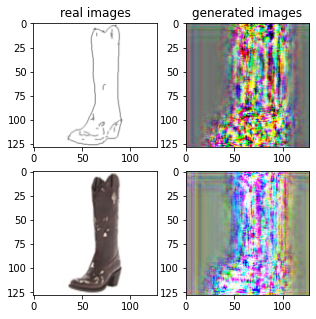

Train Epoch: 1 0% 	Total Loss: 9.778696 	Loss_G_AB: 2.185920	Loss_G_BA: 1.934453	Loss_cycle: 4.215765	Loss_D_A: 1.494380	Loss_D_B: 2.008366
0 9 T:  1.712780237197876
Train Epoch: 1 0% 	Total Loss: 5.592209 	Loss_G_AB: 1.530572	Loss_G_BA: 1.147262	Loss_cycle: 1.776155	Loss_D_A: 1.063183	Loss_D_B: 1.413954
0 19 T:  1.1799960136413574
Train Epoch: 1 0% 	Total Loss: 3.426095 	Loss_G_AB: 0.929430	Loss_G_BA: 0.864415	Loss_cycle: 1.397668	Loss_D_A: 0.504143	Loss_D_B: 0.627362
0 29 T:  1.1889023780822754
Train Epoch: 1 0% 	Total Loss: 3.779229 	Loss_G_AB: 0.833408	Loss_G_BA: 0.917105	Loss_cycle: 1.732825	Loss_D_A: 0.624685	Loss_D_B: 0.546463
0 39 T:  1.1874597072601318
Train Epoch: 1 0% 	Total Loss: 3.256315 	Loss_G_AB: 0.733248	Loss_G_BA: 0.875821	Loss_cycle: 1.383731	Loss_D_A: 0.575236	Loss_D_B: 0.492813
0 49 T:  1.1930131912231445
Train Epoch: 1 0% 	Total Loss: 2.946455 	Loss_G_AB: 0.671154	Loss_G_BA: 0.774696	Loss_cycle: 1.547993	Loss_D_A: 0.371320	Loss_D_B: 0.304217
0 59 T:  1.19143080711

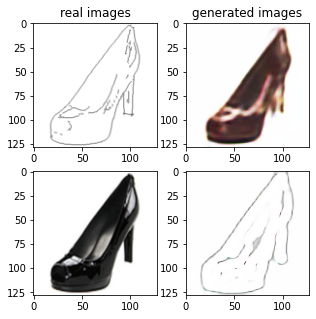

Train Epoch: 1 2% 	Total Loss: 1.478373 	Loss_G_AB: 0.341116	Loss_G_BA: 0.491985	Loss_cycle: 0.635215	Loss_D_A: 0.195060	Loss_D_B: 0.231548
0 1009 T:  1.945249319076538
Train Epoch: 1 2% 	Total Loss: 1.829738 	Loss_G_AB: 0.373004	Loss_G_BA: 0.804674	Loss_cycle: 0.954835	Loss_D_A: 0.060748	Loss_D_B: 0.225317
0 1019 T:  1.1938319206237793
Train Epoch: 1 2% 	Total Loss: 1.629336 	Loss_G_AB: 0.342830	Loss_G_BA: 0.779192	Loss_cycle: 0.760307	Loss_D_A: 0.089271	Loss_D_B: 0.218748
0 1029 T:  1.188704252243042
Train Epoch: 1 2% 	Total Loss: 1.925710 	Loss_G_AB: 0.382314	Loss_G_BA: 0.803242	Loss_cycle: 0.966972	Loss_D_A: 0.112126	Loss_D_B: 0.253834
0 1039 T:  1.185323715209961
Train Epoch: 1 2% 	Total Loss: 2.119207 	Loss_G_AB: 0.359104	Loss_G_BA: 0.873190	Loss_cycle: 1.202996	Loss_D_A: 0.070135	Loss_D_B: 0.229929
0 1049 T:  1.1964125633239746
Train Epoch: 1 2% 	Total Loss: 1.925860 	Loss_G_AB: 0.327068	Loss_G_BA: 0.745976	Loss_cycle: 0.925823	Loss_D_A: 0.165675	Loss_D_B: 0.297841
0 1059 T:  1.

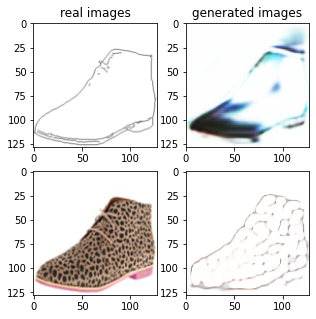

Train Epoch: 1 4% 	Total Loss: 2.018300 	Loss_G_AB: 0.347840	Loss_G_BA: 0.900845	Loss_cycle: 1.077094	Loss_D_A: 0.057104	Loss_D_B: 0.259760
0 2009 T:  1.965064525604248
Train Epoch: 1 4% 	Total Loss: 1.730748 	Loss_G_AB: 0.341285	Loss_G_BA: 0.895656	Loss_cycle: 0.757324	Loss_D_A: 0.092950	Loss_D_B: 0.262003
0 2019 T:  1.1831631660461426
Train Epoch: 1 4% 	Total Loss: 1.766356 	Loss_G_AB: 0.341149	Loss_G_BA: 0.800281	Loss_cycle: 0.858147	Loss_D_A: 0.075667	Loss_D_B: 0.261827
0 2029 T:  1.1859688758850098
Train Epoch: 1 4% 	Total Loss: 1.601994 	Loss_G_AB: 0.298799	Loss_G_BA: 0.814241	Loss_cycle: 0.732346	Loss_D_A: 0.067988	Loss_D_B: 0.245140
0 2039 T:  1.1814520359039307
Train Epoch: 1 4% 	Total Loss: 1.864488 	Loss_G_AB: 0.316113	Loss_G_BA: 0.806132	Loss_cycle: 0.964963	Loss_D_A: 0.103266	Loss_D_B: 0.235137
0 2049 T:  1.1909592151641846
Train Epoch: 1 4% 	Total Loss: 1.759154 	Loss_G_AB: 0.438846	Loss_G_BA: 0.759492	Loss_cycle: 0.820872	Loss_D_A: 0.111800	Loss_D_B: 0.227313
0 2059 T:  

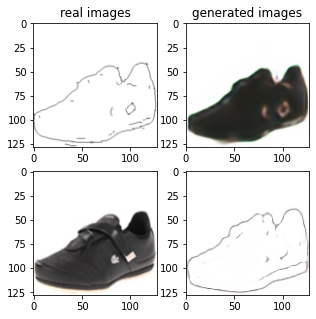

Train Epoch: 1 6% 	Total Loss: 1.449352 	Loss_G_AB: 0.322844	Loss_G_BA: 0.641675	Loss_cycle: 0.567401	Loss_D_A: 0.132558	Loss_D_B: 0.267132
0 3009 T:  2.031214714050293
Train Epoch: 1 6% 	Total Loss: 1.587608 	Loss_G_AB: 0.295330	Loss_G_BA: 0.748653	Loss_cycle: 0.744429	Loss_D_A: 0.060790	Loss_D_B: 0.260397
0 3019 T:  1.1792457103729248
Train Epoch: 1 6% 	Total Loss: 1.569700 	Loss_G_AB: 0.295521	Loss_G_BA: 0.792426	Loss_cycle: 0.649505	Loss_D_A: 0.102224	Loss_D_B: 0.273999
0 3029 T:  1.187577724456787
Train Epoch: 1 6% 	Total Loss: 1.576585 	Loss_G_AB: 0.325159	Loss_G_BA: 0.600630	Loss_cycle: 0.735679	Loss_D_A: 0.133786	Loss_D_B: 0.244226
0 3039 T:  1.1793954372406006
Train Epoch: 1 6% 	Total Loss: 1.785818 	Loss_G_AB: 0.313602	Loss_G_BA: 0.750061	Loss_cycle: 0.864447	Loss_D_A: 0.117106	Loss_D_B: 0.272432
0 3049 T:  1.1800713539123535
Train Epoch: 1 6% 	Total Loss: 1.766042 	Loss_G_AB: 0.377325	Loss_G_BA: 0.818708	Loss_cycle: 0.831612	Loss_D_A: 0.104295	Loss_D_B: 0.232118
0 3059 T:  1

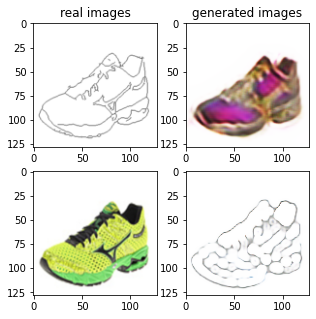

Train Epoch: 1 8% 	Total Loss: 1.771042 	Loss_G_AB: 0.376901	Loss_G_BA: 0.900810	Loss_cycle: 0.811569	Loss_D_A: 0.036680	Loss_D_B: 0.283936
0 4009 T:  1.97314453125
Train Epoch: 1 8% 	Total Loss: 2.044261 	Loss_G_AB: 0.374359	Loss_G_BA: 0.983405	Loss_cycle: 1.020824	Loss_D_A: 0.043083	Loss_D_B: 0.301472
0 4019 T:  1.18247652053833
Train Epoch: 1 8% 	Total Loss: 1.653132 	Loss_G_AB: 0.299748	Loss_G_BA: 0.982942	Loss_cycle: 0.676880	Loss_D_A: 0.056992	Loss_D_B: 0.277915
0 4029 T:  1.178675889968872
Train Epoch: 1 8% 	Total Loss: 1.612197 	Loss_G_AB: 0.316079	Loss_G_BA: 0.794614	Loss_cycle: 0.737772	Loss_D_A: 0.084185	Loss_D_B: 0.234894
0 4039 T:  1.18251633644104
Train Epoch: 1 8% 	Total Loss: 1.681588 	Loss_G_AB: 0.300086	Loss_G_BA: 0.814993	Loss_cycle: 0.819321	Loss_D_A: 0.061489	Loss_D_B: 0.243238
0 4049 T:  1.186372995376587
Train Epoch: 1 8% 	Total Loss: 1.464243 	Loss_G_AB: 0.327945	Loss_G_BA: 0.896824	Loss_cycle: 0.571207	Loss_D_A: 0.033698	Loss_D_B: 0.246953
0 4059 T:  1.19254350

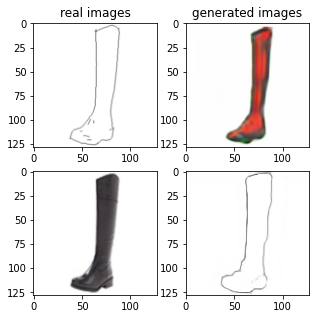

Train Epoch: 1 10% 	Total Loss: 1.617206 	Loss_G_AB: 0.383472	Loss_G_BA: 0.897000	Loss_cycle: 0.635587	Loss_D_A: 0.064144	Loss_D_B: 0.277239
0 5009 T:  1.9284582138061523
Train Epoch: 1 10% 	Total Loss: 1.538823 	Loss_G_AB: 0.357370	Loss_G_BA: 0.866626	Loss_cycle: 0.593623	Loss_D_A: 0.070142	Loss_D_B: 0.263060
0 5019 T:  1.1832377910614014
Train Epoch: 1 10% 	Total Loss: 1.689818 	Loss_G_AB: 0.407068	Loss_G_BA: 0.965198	Loss_cycle: 0.653250	Loss_D_A: 0.048239	Loss_D_B: 0.302196
0 5029 T:  1.1849706172943115
Train Epoch: 1 10% 	Total Loss: 1.759131 	Loss_G_AB: 0.283267	Loss_G_BA: 0.936401	Loss_cycle: 0.851107	Loss_D_A: 0.023106	Loss_D_B: 0.275083
0 5039 T:  1.1866505146026611
Train Epoch: 1 10% 	Total Loss: 1.602292 	Loss_G_AB: 0.339175	Loss_G_BA: 0.965532	Loss_cycle: 0.690872	Loss_D_A: 0.049139	Loss_D_B: 0.209928
0 5049 T:  1.18448805809021
Train Epoch: 1 10% 	Total Loss: 1.760011 	Loss_G_AB: 0.369356	Loss_G_BA: 0.875501	Loss_cycle: 0.756206	Loss_D_A: 0.103694	Loss_D_B: 0.277683
0 5059

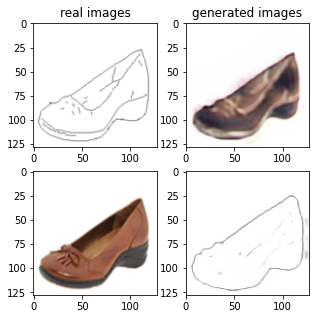

Train Epoch: 1 12% 	Total Loss: 1.660831 	Loss_G_AB: 0.354894	Loss_G_BA: 0.907751	Loss_cycle: 0.719906	Loss_D_A: 0.043943	Loss_D_B: 0.265658
0 6009 T:  1.935300350189209
Train Epoch: 1 12% 	Total Loss: 1.824853 	Loss_G_AB: 0.363137	Loss_G_BA: 0.882825	Loss_cycle: 0.909623	Loss_D_A: 0.067906	Loss_D_B: 0.224344
0 6019 T:  1.1709680557250977
Train Epoch: 1 12% 	Total Loss: 1.612423 	Loss_G_AB: 0.317870	Loss_G_BA: 0.672968	Loss_cycle: 0.684643	Loss_D_A: 0.187813	Loss_D_B: 0.244548
0 6029 T:  1.177149772644043
Train Epoch: 1 12% 	Total Loss: 2.065951 	Loss_G_AB: 0.443975	Loss_G_BA: 0.547275	Loss_cycle: 0.954815	Loss_D_A: 0.217343	Loss_D_B: 0.398168
0 6039 T:  1.1939034461975098
Train Epoch: 1 12% 	Total Loss: 1.557811 	Loss_G_AB: 0.331666	Loss_G_BA: 0.763554	Loss_cycle: 0.675925	Loss_D_A: 0.073028	Loss_D_B: 0.261249
0 6049 T:  1.178457498550415
Train Epoch: 1 12% 	Total Loss: 1.586900 	Loss_G_AB: 0.290876	Loss_G_BA: 0.686577	Loss_cycle: 0.727977	Loss_D_A: 0.119806	Loss_D_B: 0.250390
0 6059 

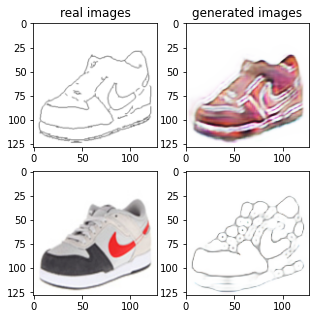

Train Epoch: 1 14% 	Total Loss: 1.835566 	Loss_G_AB: 0.279986	Loss_G_BA: 0.874208	Loss_cycle: 0.947828	Loss_D_A: 0.027671	Loss_D_B: 0.282970
0 7009 T:  1.8768284320831299
Train Epoch: 1 14% 	Total Loss: 1.650936 	Loss_G_AB: 0.349707	Loss_G_BA: 0.943471	Loss_cycle: 0.732314	Loss_D_A: 0.034479	Loss_D_B: 0.237553
0 7019 T:  1.1738688945770264
Train Epoch: 1 14% 	Total Loss: 1.561568 	Loss_G_AB: 0.303926	Loss_G_BA: 0.908916	Loss_cycle: 0.656976	Loss_D_A: 0.042967	Loss_D_B: 0.255204
0 7029 T:  1.176278829574585
Train Epoch: 1 14% 	Total Loss: 1.636917 	Loss_G_AB: 0.378013	Loss_G_BA: 0.880058	Loss_cycle: 0.710467	Loss_D_A: 0.033656	Loss_D_B: 0.263759
0 7039 T:  1.178635597229004
Train Epoch: 1 14% 	Total Loss: 1.816176 	Loss_G_AB: 0.300536	Loss_G_BA: 0.940341	Loss_cycle: 0.853958	Loss_D_A: 0.043597	Loss_D_B: 0.298183
0 7049 T:  1.1827507019042969
Train Epoch: 1 14% 	Total Loss: 1.528335 	Loss_G_AB: 0.319598	Loss_G_BA: 0.830821	Loss_cycle: 0.631427	Loss_D_A: 0.055526	Loss_D_B: 0.266173
0 7059

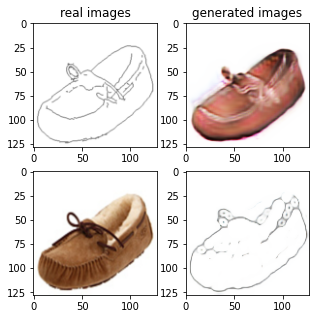

Train Epoch: 1 16% 	Total Loss: 1.738947 	Loss_G_AB: 0.334360	Loss_G_BA: 0.923949	Loss_cycle: 0.769599	Loss_D_A: 0.080172	Loss_D_B: 0.260021
0 8009 T:  1.9073679447174072
Train Epoch: 1 16% 	Total Loss: 1.843033 	Loss_G_AB: 0.342260	Loss_G_BA: 0.847433	Loss_cycle: 0.907947	Loss_D_A: 0.080685	Loss_D_B: 0.259555
0 8019 T:  1.1716563701629639
Train Epoch: 1 16% 	Total Loss: 1.690959 	Loss_G_AB: 0.303164	Loss_G_BA: 0.809431	Loss_cycle: 0.834093	Loss_D_A: 0.056313	Loss_D_B: 0.244256
0 8029 T:  1.1772797107696533
Train Epoch: 1 16% 	Total Loss: 1.542806 	Loss_G_AB: 0.334394	Loss_G_BA: 0.865960	Loss_cycle: 0.630113	Loss_D_A: 0.055127	Loss_D_B: 0.257389
0 8039 T:  1.1745331287384033
Train Epoch: 1 16% 	Total Loss: 1.611536 	Loss_G_AB: 0.362370	Loss_G_BA: 0.872811	Loss_cycle: 0.674242	Loss_D_A: 0.045771	Loss_D_B: 0.273932
0 8049 T:  1.1776156425476074
Train Epoch: 1 16% 	Total Loss: 1.564114 	Loss_G_AB: 0.406589	Loss_G_BA: 0.621596	Loss_cycle: 0.466169	Loss_D_A: 0.197099	Loss_D_B: 0.386753
0 80

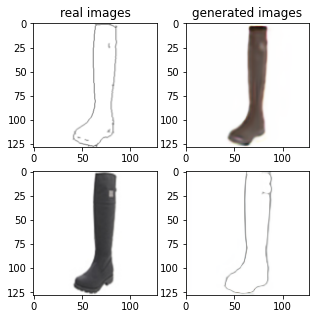

Train Epoch: 1 18% 	Total Loss: 1.581189 	Loss_G_AB: 0.322211	Loss_G_BA: 0.701419	Loss_cycle: 0.661272	Loss_D_A: 0.128205	Loss_D_B: 0.279897
0 9009 T:  1.9617998600006104
Train Epoch: 1 18% 	Total Loss: 1.639853 	Loss_G_AB: 0.298949	Loss_G_BA: 0.882686	Loss_cycle: 0.738436	Loss_D_A: 0.057638	Loss_D_B: 0.252962
0 9019 T:  1.176651954650879
Train Epoch: 1 18% 	Total Loss: 1.560004 	Loss_G_AB: 0.310015	Loss_G_BA: 0.889911	Loss_cycle: 0.640431	Loss_D_A: 0.083841	Loss_D_B: 0.235769
0 9029 T:  1.1734545230865479
Train Epoch: 1 18% 	Total Loss: 1.507036 	Loss_G_AB: 0.311860	Loss_G_BA: 0.928057	Loss_cycle: 0.584410	Loss_D_A: 0.040632	Loss_D_B: 0.262035
0 9039 T:  1.1741633415222168
Train Epoch: 1 18% 	Total Loss: 1.670247 	Loss_G_AB: 0.276617	Loss_G_BA: 0.979974	Loss_cycle: 0.774446	Loss_D_A: 0.019050	Loss_D_B: 0.248456
0 9049 T:  1.175715446472168
Train Epoch: 1 18% 	Total Loss: 1.427699 	Loss_G_AB: 0.326204	Loss_G_BA: 0.806303	Loss_cycle: 0.570716	Loss_D_A: 0.042958	Loss_D_B: 0.247771
0 9059

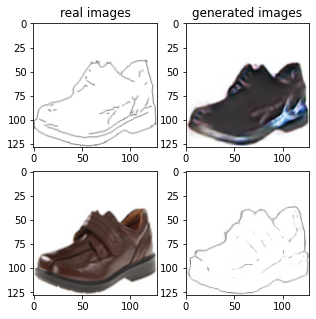

Train Epoch: 1 20% 	Total Loss: 1.492597 	Loss_G_AB: 0.293690	Loss_G_BA: 0.842602	Loss_cycle: 0.599212	Loss_D_A: 0.071766	Loss_D_B: 0.253472
0 10009 T:  1.9107286930084229
Train Epoch: 1 20% 	Total Loss: 1.537807 	Loss_G_AB: 0.322330	Loss_G_BA: 0.873137	Loss_cycle: 0.628816	Loss_D_A: 0.062449	Loss_D_B: 0.248808
0 10019 T:  1.1675143241882324
Train Epoch: 1 20% 	Total Loss: 1.594590 	Loss_G_AB: 0.285831	Loss_G_BA: 0.679247	Loss_cycle: 0.679694	Loss_D_A: 0.164541	Loss_D_B: 0.267817
0 10029 T:  1.1772899627685547
Train Epoch: 1 20% 	Total Loss: 1.621934 	Loss_G_AB: 0.330527	Loss_G_BA: 0.631417	Loss_cycle: 0.698379	Loss_D_A: 0.162316	Loss_D_B: 0.280268
0 10039 T:  1.1722967624664307
Train Epoch: 1 20% 	Total Loss: 1.467114 	Loss_G_AB: 0.295841	Loss_G_BA: 0.825986	Loss_cycle: 0.595156	Loss_D_A: 0.046704	Loss_D_B: 0.264341
0 10049 T:  1.1700999736785889
Train Epoch: 1 20% 	Total Loss: 1.619999 	Loss_G_AB: 0.286339	Loss_G_BA: 0.844409	Loss_cycle: 0.732260	Loss_D_A: 0.066343	Loss_D_B: 0.256022

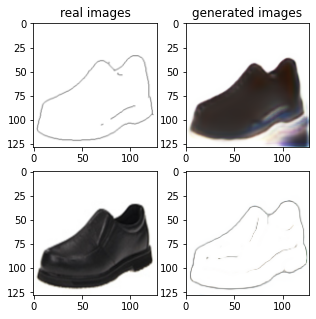

Train Epoch: 1 22% 	Total Loss: 1.381219 	Loss_G_AB: 0.272618	Loss_G_BA: 0.969172	Loss_cycle: 0.491446	Loss_D_A: 0.015852	Loss_D_B: 0.253025
0 11009 T:  1.902334451675415
Train Epoch: 1 22% 	Total Loss: 1.475743 	Loss_G_AB: 0.300863	Loss_G_BA: 1.007596	Loss_cycle: 0.556657	Loss_D_A: 0.011335	Loss_D_B: 0.253522
0 11019 T:  1.177473783493042
Train Epoch: 1 22% 	Total Loss: 1.557866 	Loss_G_AB: 0.308491	Loss_G_BA: 1.013770	Loss_cycle: 0.632033	Loss_D_A: 0.006991	Loss_D_B: 0.257711
0 11029 T:  1.1764225959777832
Train Epoch: 1 22% 	Total Loss: 1.591347 	Loss_G_AB: 0.325889	Loss_G_BA: 0.975199	Loss_cycle: 0.680954	Loss_D_A: 0.017163	Loss_D_B: 0.242686
0 11039 T:  1.1730256080627441
Train Epoch: 1 22% 	Total Loss: 1.485761 	Loss_G_AB: 0.282604	Loss_G_BA: 0.881827	Loss_cycle: 0.578829	Loss_D_A: 0.071709	Loss_D_B: 0.253008
0 11049 T:  1.1736719608306885
Train Epoch: 1 22% 	Total Loss: 1.412855 	Loss_G_AB: 0.283509	Loss_G_BA: 0.827420	Loss_cycle: 0.532673	Loss_D_A: 0.079395	Loss_D_B: 0.245322
0

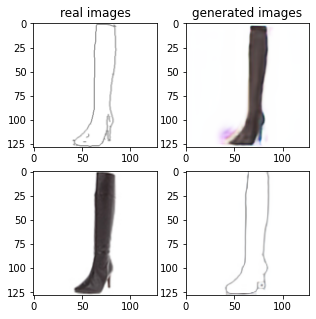

Train Epoch: 1 24% 	Total Loss: 1.582963 	Loss_G_AB: 0.297478	Loss_G_BA: 1.028264	Loss_cycle: 0.663004	Loss_D_A: 0.006187	Loss_D_B: 0.250902
0 12009 T:  1.9149932861328125
Train Epoch: 1 24% 	Total Loss: 1.436548 	Loss_G_AB: 0.313389	Loss_G_BA: 1.005242	Loss_cycle: 0.538815	Loss_D_A: 0.009506	Loss_D_B: 0.228911
0 12019 T:  1.1711719036102295
Train Epoch: 1 24% 	Total Loss: 1.456299 	Loss_G_AB: 0.281495	Loss_G_BA: 0.940627	Loss_cycle: 0.565813	Loss_D_A: 0.009106	Loss_D_B: 0.270318
0 12029 T:  1.1764965057373047
Train Epoch: 1 24% 	Total Loss: 1.390228 	Loss_G_AB: 0.293327	Loss_G_BA: 0.966738	Loss_cycle: 0.501378	Loss_D_A: 0.007373	Loss_D_B: 0.251444
0 12039 T:  1.184213638305664
Train Epoch: 1 24% 	Total Loss: 1.497611 	Loss_G_AB: 0.307632	Loss_G_BA: 1.070850	Loss_cycle: 0.524289	Loss_D_A: 0.011620	Loss_D_B: 0.272461
0 12049 T:  1.1672518253326416
Train Epoch: 1 24% 	Total Loss: 1.528310 	Loss_G_AB: 0.294278	Loss_G_BA: 0.980494	Loss_cycle: 0.628482	Loss_D_A: 0.010055	Loss_D_B: 0.252386


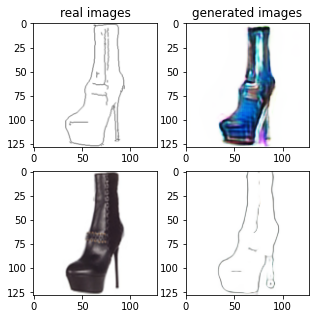

Train Epoch: 1 26% 	Total Loss: 1.396948 	Loss_G_AB: 0.304422	Loss_G_BA: 0.954989	Loss_cycle: 0.468966	Loss_D_A: 0.028347	Loss_D_B: 0.269929
0 13009 T:  1.9187347888946533
Train Epoch: 1 26% 	Total Loss: 1.534147 	Loss_G_AB: 0.298358	Loss_G_BA: 0.971031	Loss_cycle: 0.624211	Loss_D_A: 0.015368	Loss_D_B: 0.259874
0 13019 T:  1.189584493637085
Train Epoch: 1 26% 	Total Loss: 1.330018 	Loss_G_AB: 0.278441	Loss_G_BA: 0.907085	Loss_cycle: 0.469671	Loss_D_A: 0.020799	Loss_D_B: 0.246785
0 13029 T:  1.1826303005218506
Train Epoch: 1 26% 	Total Loss: 1.527758 	Loss_G_AB: 0.271269	Loss_G_BA: 0.980221	Loss_cycle: 0.624034	Loss_D_A: 0.013677	Loss_D_B: 0.264302
0 13039 T:  1.1952497959136963
Train Epoch: 1 26% 	Total Loss: 1.397902 	Loss_G_AB: 0.284912	Loss_G_BA: 0.987101	Loss_cycle: 0.487658	Loss_D_A: 0.009073	Loss_D_B: 0.265164
0 13049 T:  1.2587003707885742
Train Epoch: 1 26% 	Total Loss: 1.506439 	Loss_G_AB: 0.291510	Loss_G_BA: 1.003123	Loss_cycle: 0.582092	Loss_D_A: 0.014154	Loss_D_B: 0.262876


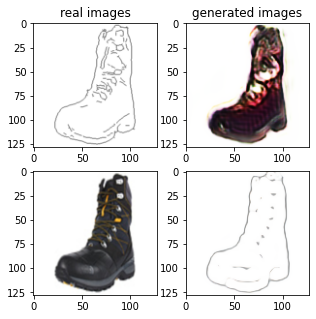

Train Epoch: 1 28% 	Total Loss: 1.521891 	Loss_G_AB: 0.295493	Loss_G_BA: 0.984435	Loss_cycle: 0.625531	Loss_D_A: 0.010674	Loss_D_B: 0.245722
0 14009 T:  2.017571210861206
Train Epoch: 1 28% 	Total Loss: 1.545722 	Loss_G_AB: 0.272002	Loss_G_BA: 0.985861	Loss_cycle: 0.670174	Loss_D_A: 0.005826	Loss_D_B: 0.240792
0 14019 T:  1.1843421459197998
Train Epoch: 1 28% 	Total Loss: 1.480992 	Loss_G_AB: 0.341682	Loss_G_BA: 0.949778	Loss_cycle: 0.583434	Loss_D_A: 0.020587	Loss_D_B: 0.231242
0 14029 T:  1.1877927780151367
Train Epoch: 1 28% 	Total Loss: 1.387559 	Loss_G_AB: 0.317724	Loss_G_BA: 1.030177	Loss_cycle: 0.470598	Loss_D_A: 0.007863	Loss_D_B: 0.235148
0 14039 T:  1.1875765323638916
Train Epoch: 1 28% 	Total Loss: 1.501443 	Loss_G_AB: 0.318924	Loss_G_BA: 0.992205	Loss_cycle: 0.569345	Loss_D_A: 0.007500	Loss_D_B: 0.269034
0 14049 T:  1.1974565982818604
Train Epoch: 1 28% 	Total Loss: 1.478658 	Loss_G_AB: 0.274750	Loss_G_BA: 0.989139	Loss_cycle: 0.570385	Loss_D_A: 0.004707	Loss_D_B: 0.271621


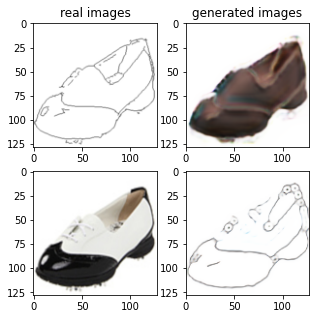

Train Epoch: 1 30% 	Total Loss: 1.420577 	Loss_G_AB: 0.314627	Loss_G_BA: 0.928059	Loss_cycle: 0.534833	Loss_D_A: 0.030499	Loss_D_B: 0.233902
0 15009 T:  1.9301140308380127
Train Epoch: 1 30% 	Total Loss: 1.504589 	Loss_G_AB: 0.281710	Loss_G_BA: 0.985195	Loss_cycle: 0.597704	Loss_D_A: 0.010063	Loss_D_B: 0.263370
0 15019 T:  1.1891684532165527
Train Epoch: 1 30% 	Total Loss: 1.403121 	Loss_G_AB: 0.313347	Loss_G_BA: 0.962442	Loss_cycle: 0.501613	Loss_D_A: 0.019861	Loss_D_B: 0.243753
0 15029 T:  1.187079668045044
Train Epoch: 1 30% 	Total Loss: 1.602361 	Loss_G_AB: 0.317666	Loss_G_BA: 1.010762	Loss_cycle: 0.688371	Loss_D_A: 0.005954	Loss_D_B: 0.243823
0 15039 T:  1.1847736835479736
Train Epoch: 1 30% 	Total Loss: 1.492734 	Loss_G_AB: 0.361966	Loss_G_BA: 1.003206	Loss_cycle: 0.589741	Loss_D_A: 0.005584	Loss_D_B: 0.214823
0 15049 T:  1.193450927734375
Train Epoch: 1 30% 	Total Loss: 1.394782 	Loss_G_AB: 0.320654	Loss_G_BA: 0.980045	Loss_cycle: 0.488050	Loss_D_A: 0.012560	Loss_D_B: 0.243823
0

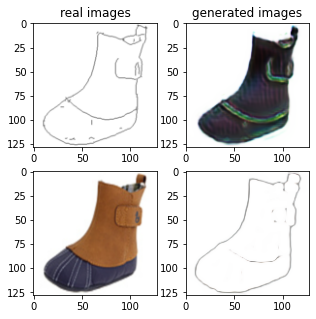

Train Epoch: 1 32% 	Total Loss: 1.586323 	Loss_G_AB: 0.294479	Loss_G_BA: 0.871386	Loss_cycle: 0.698598	Loss_D_A: 0.061098	Loss_D_B: 0.243696
0 16009 T:  1.9328088760375977
Train Epoch: 1 32% 	Total Loss: 1.406878 	Loss_G_AB: 0.321131	Loss_G_BA: 0.714859	Loss_cycle: 0.424027	Loss_D_A: 0.203754	Loss_D_B: 0.261102
0 16019 T:  1.1898133754730225
Train Epoch: 1 32% 	Total Loss: 1.487302 	Loss_G_AB: 0.286966	Loss_G_BA: 0.775479	Loss_cycle: 0.551572	Loss_D_A: 0.157142	Loss_D_B: 0.247366
0 16029 T:  1.1939218044281006
Train Epoch: 1 32% 	Total Loss: 1.436669 	Loss_G_AB: 0.336067	Loss_G_BA: 0.665615	Loss_cycle: 0.540480	Loss_D_A: 0.137797	Loss_D_B: 0.257551
0 16039 T:  1.2007379531860352
Train Epoch: 1 32% 	Total Loss: 1.488007 	Loss_G_AB: 0.307821	Loss_G_BA: 0.756021	Loss_cycle: 0.612384	Loss_D_A: 0.102642	Loss_D_B: 0.241060
0 16049 T:  1.2011678218841553
Train Epoch: 1 32% 	Total Loss: 1.551142 	Loss_G_AB: 0.263649	Loss_G_BA: 0.599540	Loss_cycle: 0.607793	Loss_D_A: 0.258818	Loss_D_B: 0.252936

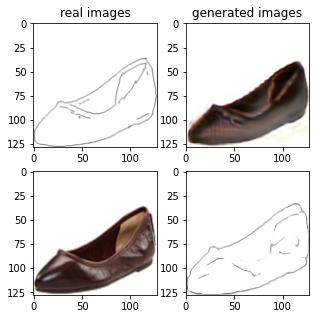

Train Epoch: 1 34% 	Total Loss: 1.515592 	Loss_G_AB: 0.284984	Loss_G_BA: 0.692208	Loss_cycle: 0.678082	Loss_D_A: 0.097531	Loss_D_B: 0.251383
0 17009 T:  1.9744844436645508
Train Epoch: 1 34% 	Total Loss: 1.310954 	Loss_G_AB: 0.304583	Loss_G_BA: 0.967762	Loss_cycle: 0.399993	Loss_D_A: 0.037558	Loss_D_B: 0.237231
0 17019 T:  1.1995575428009033
Train Epoch: 1 34% 	Total Loss: 1.537600 	Loss_G_AB: 0.298383	Loss_G_BA: 1.005579	Loss_cycle: 0.620757	Loss_D_A: 0.011529	Loss_D_B: 0.253333
0 17029 T:  1.1954138278961182
Train Epoch: 1 34% 	Total Loss: 1.475977 	Loss_G_AB: 0.298736	Loss_G_BA: 0.963136	Loss_cycle: 0.552874	Loss_D_A: 0.037479	Loss_D_B: 0.254688
0 17039 T:  1.1976473331451416
Train Epoch: 1 34% 	Total Loss: 1.435111 	Loss_G_AB: 0.305872	Loss_G_BA: 0.768640	Loss_cycle: 0.454688	Loss_D_A: 0.160691	Loss_D_B: 0.282477
0 17049 T:  1.19417405128479
Train Epoch: 1 34% 	Total Loss: 1.338658 	Loss_G_AB: 0.312252	Loss_G_BA: 0.665390	Loss_cycle: 0.481519	Loss_D_A: 0.097379	Loss_D_B: 0.270939
0

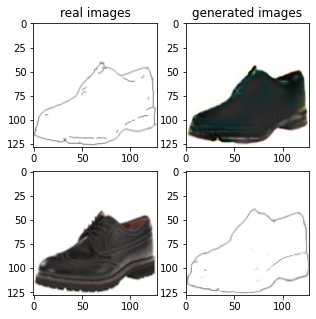

Train Epoch: 1 36% 	Total Loss: 1.276435 	Loss_G_AB: 0.297596	Loss_G_BA: 0.980348	Loss_cycle: 0.384176	Loss_D_A: 0.006505	Loss_D_B: 0.246781
0 18009 T:  1.9664967060089111
Train Epoch: 1 36% 	Total Loss: 1.476728 	Loss_G_AB: 0.272881	Loss_G_BA: 1.009928	Loss_cycle: 0.566534	Loss_D_A: 0.005184	Loss_D_B: 0.263606
0 18019 T:  1.1889243125915527
Train Epoch: 1 36% 	Total Loss: 1.514612 	Loss_G_AB: 0.301615	Loss_G_BA: 1.004356	Loss_cycle: 0.608339	Loss_D_A: 0.008195	Loss_D_B: 0.245093
0 18029 T:  1.1826183795928955
Train Epoch: 1 36% 	Total Loss: 1.331308 	Loss_G_AB: 0.297413	Loss_G_BA: 0.992848	Loss_cycle: 0.438666	Loss_D_A: 0.006307	Loss_D_B: 0.241204
0 18039 T:  1.188577651977539
Train Epoch: 1 36% 	Total Loss: 1.567655 	Loss_G_AB: 0.291112	Loss_G_BA: 0.996588	Loss_cycle: 0.673764	Loss_D_A: 0.008139	Loss_D_B: 0.241902
0 18049 T:  1.1906569004058838
Train Epoch: 1 36% 	Total Loss: 1.408374 	Loss_G_AB: 0.300348	Loss_G_BA: 0.980082	Loss_cycle: 0.496174	Loss_D_A: 0.008534	Loss_D_B: 0.263451


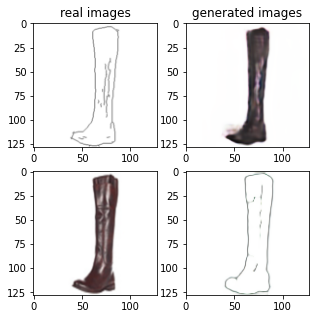

Train Epoch: 1 38% 	Total Loss: 1.373464 	Loss_G_AB: 0.295584	Loss_G_BA: 1.025179	Loss_cycle: 0.467339	Loss_D_A: 0.004066	Loss_D_B: 0.241677
0 19009 T:  1.9433963298797607
Train Epoch: 1 38% 	Total Loss: 1.336381 	Loss_G_AB: 0.278036	Loss_G_BA: 0.958567	Loss_cycle: 0.457624	Loss_D_A: 0.012176	Loss_D_B: 0.248279
0 19019 T:  1.1926031112670898
Train Epoch: 1 38% 	Total Loss: 1.431357 	Loss_G_AB: 0.272358	Loss_G_BA: 0.996906	Loss_cycle: 0.541262	Loss_D_A: 0.005506	Loss_D_B: 0.249957
0 19029 T:  1.1833748817443848
Train Epoch: 1 38% 	Total Loss: 1.499566 	Loss_G_AB: 0.286891	Loss_G_BA: 1.017712	Loss_cycle: 0.586063	Loss_D_A: 0.006283	Loss_D_B: 0.254918
0 19039 T:  1.1779954433441162
Train Epoch: 1 38% 	Total Loss: 1.196835 	Loss_G_AB: 0.286343	Loss_G_BA: 0.995766	Loss_cycle: 0.317139	Loss_D_A: 0.008230	Loss_D_B: 0.230412
0 19049 T:  1.187744140625
Train Epoch: 1 38% 	Total Loss: 1.406562 	Loss_G_AB: 0.302542	Loss_G_BA: 0.996221	Loss_cycle: 0.510613	Loss_D_A: 0.004275	Loss_D_B: 0.242292
0 1

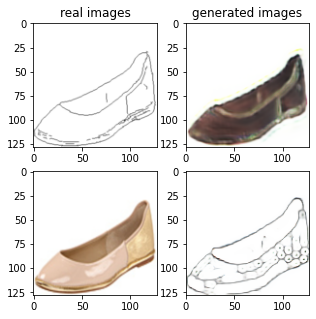

Train Epoch: 1 40% 	Total Loss: 1.460015 	Loss_G_AB: 0.298816	Loss_G_BA: 0.978545	Loss_cycle: 0.571902	Loss_D_A: 0.006370	Loss_D_B: 0.243063
0 20009 T:  2.0477147102355957
Train Epoch: 1 40% 	Total Loss: 1.457658 	Loss_G_AB: 0.310269	Loss_G_BA: 1.017528	Loss_cycle: 0.542615	Loss_D_A: 0.013783	Loss_D_B: 0.237362
0 20019 T:  1.1954419612884521
Train Epoch: 1 40% 	Total Loss: 1.441793 	Loss_G_AB: 0.333741	Loss_G_BA: 1.013248	Loss_cycle: 0.470200	Loss_D_A: 0.014339	Loss_D_B: 0.283758
0 20029 T:  1.2444491386413574
Train Epoch: 1 40% 	Total Loss: 1.510566 	Loss_G_AB: 0.272034	Loss_G_BA: 0.992548	Loss_cycle: 0.615968	Loss_D_A: 0.006525	Loss_D_B: 0.255782
0 20039 T:  1.2006025314331055
Train Epoch: 1 40% 	Total Loss: 1.424062 	Loss_G_AB: 0.282261	Loss_G_BA: 0.972964	Loss_cycle: 0.536366	Loss_D_A: 0.007539	Loss_D_B: 0.252544
0 20049 T:  1.1874725818634033
Train Epoch: 1 40% 	Total Loss: 1.337928 	Loss_G_AB: 0.283294	Loss_G_BA: 0.967149	Loss_cycle: 0.450048	Loss_D_A: 0.006948	Loss_D_B: 0.255710

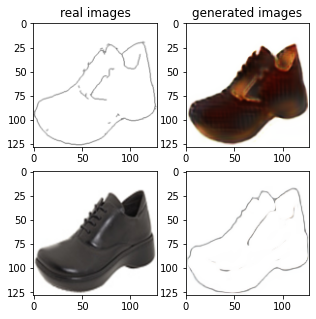

Train Epoch: 1 42% 	Total Loss: 1.287019 	Loss_G_AB: 0.280517	Loss_G_BA: 0.896087	Loss_cycle: 0.385316	Loss_D_A: 0.074943	Loss_D_B: 0.238457
0 21009 T:  1.9361026287078857
Train Epoch: 1 42% 	Total Loss: 1.468925 	Loss_G_AB: 0.279467	Loss_G_BA: 0.975387	Loss_cycle: 0.562961	Loss_D_A: 0.017070	Loss_D_B: 0.261466
0 21019 T:  1.1915926933288574
Train Epoch: 1 42% 	Total Loss: 1.452118 	Loss_G_AB: 0.267756	Loss_G_BA: 0.880455	Loss_cycle: 0.552690	Loss_D_A: 0.057684	Loss_D_B: 0.267638
0 21029 T:  1.1916155815124512
Train Epoch: 1 42% 	Total Loss: 1.424736 	Loss_G_AB: 0.285659	Loss_G_BA: 0.879745	Loss_cycle: 0.436726	Loss_D_A: 0.152477	Loss_D_B: 0.252830
0 21039 T:  1.20021653175354
Train Epoch: 1 42% 	Total Loss: 1.363094 	Loss_G_AB: 0.309824	Loss_G_BA: 0.754827	Loss_cycle: 0.497204	Loss_D_A: 0.100712	Loss_D_B: 0.232852
0 21049 T:  1.1932361125946045
Train Epoch: 1 42% 	Total Loss: 1.446892 	Loss_G_AB: 0.289579	Loss_G_BA: 0.871592	Loss_cycle: 0.531171	Loss_D_A: 0.077274	Loss_D_B: 0.257861
0

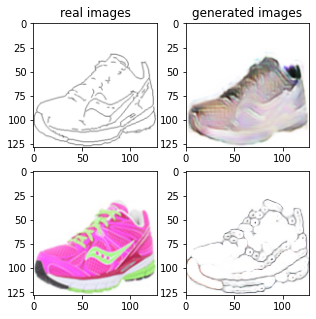

Train Epoch: 1 44% 	Total Loss: 1.588372 	Loss_G_AB: 0.296122	Loss_G_BA: 0.633870	Loss_cycle: 0.687715	Loss_D_A: 0.193571	Loss_D_B: 0.242089
0 22009 T:  1.945310354232788
Train Epoch: 1 44% 	Total Loss: 1.370942 	Loss_G_AB: 0.273904	Loss_G_BA: 0.723971	Loss_cycle: 0.509673	Loss_D_A: 0.096855	Loss_D_B: 0.265476
0 22019 T:  1.1806955337524414
Train Epoch: 1 44% 	Total Loss: 1.329054 	Loss_G_AB: 0.291578	Loss_G_BA: 0.750165	Loss_cycle: 0.495544	Loss_D_A: 0.077612	Loss_D_B: 0.235026
0 22029 T:  1.1831655502319336
Train Epoch: 1 44% 	Total Loss: 1.395268 	Loss_G_AB: 0.301030	Loss_G_BA: 0.673579	Loss_cycle: 0.566466	Loss_D_A: 0.091934	Loss_D_B: 0.249563
0 22039 T:  1.182002067565918
Train Epoch: 1 44% 	Total Loss: 1.408510 	Loss_G_AB: 0.275541	Loss_G_BA: 0.793992	Loss_cycle: 0.509181	Loss_D_A: 0.102707	Loss_D_B: 0.261854
0 22049 T:  1.1881160736083984
Train Epoch: 1 44% 	Total Loss: 1.411816 	Loss_G_AB: 0.312250	Loss_G_BA: 0.726964	Loss_cycle: 0.514072	Loss_D_A: 0.120871	Loss_D_B: 0.257266
0

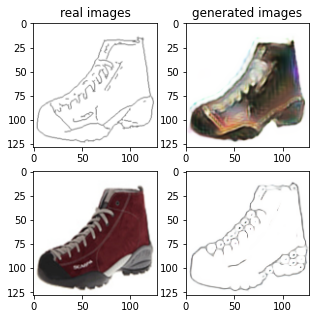

Train Epoch: 1 46% 	Total Loss: 1.519501 	Loss_G_AB: 0.276615	Loss_G_BA: 1.004067	Loss_cycle: 0.604811	Loss_D_A: 0.014130	Loss_D_B: 0.260219
0 23009 T:  1.9506165981292725
Train Epoch: 1 46% 	Total Loss: 1.618000 	Loss_G_AB: 0.315917	Loss_G_BA: 0.973671	Loss_cycle: 0.696557	Loss_D_A: 0.011064	Loss_D_B: 0.265586
0 23019 T:  1.1847155094146729
Train Epoch: 1 46% 	Total Loss: 1.523465 	Loss_G_AB: 0.339675	Loss_G_BA: 0.993622	Loss_cycle: 0.602437	Loss_D_A: 0.006414	Loss_D_B: 0.247966
0 23029 T:  1.182389497756958
Train Epoch: 1 46% 	Total Loss: 1.447739 	Loss_G_AB: 0.301578	Loss_G_BA: 0.989989	Loss_cycle: 0.518804	Loss_D_A: 0.006876	Loss_D_B: 0.276276
0 23039 T:  1.182765245437622
Train Epoch: 1 46% 	Total Loss: 1.459328 	Loss_G_AB: 0.323713	Loss_G_BA: 1.043179	Loss_cycle: 0.520005	Loss_D_A: 0.004875	Loss_D_B: 0.251001
0 23049 T:  1.1806676387786865
Train Epoch: 1 46% 	Total Loss: 1.388945 	Loss_G_AB: 0.280791	Loss_G_BA: 0.983208	Loss_cycle: 0.480539	Loss_D_A: 0.007592	Loss_D_B: 0.268815
0

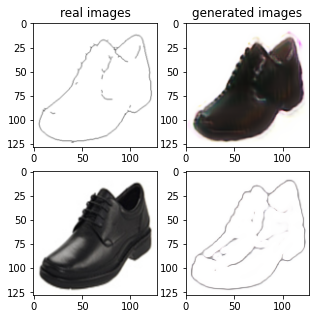

Train Epoch: 1 48% 	Total Loss: 1.536077 	Loss_G_AB: 0.308667	Loss_G_BA: 0.982129	Loss_cycle: 0.624846	Loss_D_A: 0.007328	Loss_D_B: 0.258504
0 24009 T:  1.9896578788757324
Train Epoch: 1 48% 	Total Loss: 1.382004 	Loss_G_AB: 0.281667	Loss_G_BA: 0.983667	Loss_cycle: 0.500566	Loss_D_A: 0.006464	Loss_D_B: 0.242306
0 24019 T:  1.1938402652740479
Train Epoch: 1 48% 	Total Loss: 1.459679 	Loss_G_AB: 0.302105	Loss_G_BA: 0.966984	Loss_cycle: 0.560146	Loss_D_A: 0.007080	Loss_D_B: 0.257909
0 24029 T:  1.204930067062378
Train Epoch: 1 48% 	Total Loss: 1.420141 	Loss_G_AB: 0.286055	Loss_G_BA: 0.949210	Loss_cycle: 0.550727	Loss_D_A: 0.007925	Loss_D_B: 0.243856
0 24039 T:  1.1976203918457031
Train Epoch: 1 48% 	Total Loss: 1.573163 	Loss_G_AB: 0.283155	Loss_G_BA: 1.067083	Loss_cycle: 0.622757	Loss_D_A: 0.013556	Loss_D_B: 0.261732
0 24049 T:  1.1980552673339844
Train Epoch: 1 48% 	Total Loss: 1.369500 	Loss_G_AB: 0.282857	Loss_G_BA: 0.997484	Loss_cycle: 0.461117	Loss_D_A: 0.004479	Loss_D_B: 0.263734


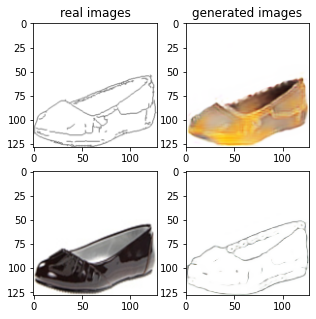

Train Epoch: 1 50% 	Total Loss: 1.331017 	Loss_G_AB: 0.264498	Loss_G_BA: 0.900784	Loss_cycle: 0.443352	Loss_D_A: 0.022072	Loss_D_B: 0.282952
0 25009 T:  1.96323823928833
Train Epoch: 1 50% 	Total Loss: 1.424601 	Loss_G_AB: 0.289762	Loss_G_BA: 0.918197	Loss_cycle: 0.498880	Loss_D_A: 0.071324	Loss_D_B: 0.250418
0 25019 T:  1.1904630661010742
Train Epoch: 1 50% 	Total Loss: 1.400437 	Loss_G_AB: 0.281857	Loss_G_BA: 0.863310	Loss_cycle: 0.449980	Loss_D_A: 0.134392	Loss_D_B: 0.243481
0 25029 T:  1.1790273189544678
Train Epoch: 1 50% 	Total Loss: 1.341628 	Loss_G_AB: 0.326530	Loss_G_BA: 0.906204	Loss_cycle: 0.458636	Loss_D_A: 0.037271	Loss_D_B: 0.229354
0 25039 T:  1.1765263080596924
Train Epoch: 1 50% 	Total Loss: 1.393354 	Loss_G_AB: 0.317721	Loss_G_BA: 0.985368	Loss_cycle: 0.496438	Loss_D_A: 0.005224	Loss_D_B: 0.240149
0 25049 T:  1.178434133529663
Train Epoch: 1 50% 	Total Loss: 1.306228 	Loss_G_AB: 0.283556	Loss_G_BA: 0.959311	Loss_cycle: 0.422257	Loss_D_A: 0.015045	Loss_D_B: 0.247493
0 

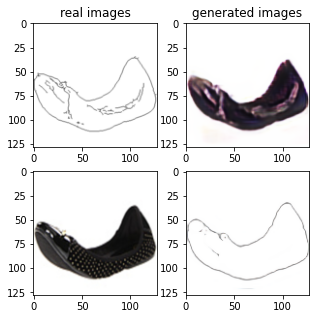

Train Epoch: 1 52% 	Total Loss: 1.315226 	Loss_G_AB: 0.304744	Loss_G_BA: 0.685851	Loss_cycle: 0.462598	Loss_D_A: 0.100590	Loss_D_B: 0.256740
0 26009 T:  2.062303066253662
Train Epoch: 1 52% 	Total Loss: 1.431133 	Loss_G_AB: 0.266402	Loss_G_BA: 0.905376	Loss_cycle: 0.516025	Loss_D_A: 0.073332	Loss_D_B: 0.255887
0 26019 T:  1.1935200691223145
Train Epoch: 1 52% 	Total Loss: 1.431260 	Loss_G_AB: 0.293908	Loss_G_BA: 0.968713	Loss_cycle: 0.510924	Loss_D_A: 0.050460	Loss_D_B: 0.238565
0 26029 T:  1.1799046993255615
Train Epoch: 1 52% 	Total Loss: 1.428379 	Loss_G_AB: 0.276676	Loss_G_BA: 0.972555	Loss_cycle: 0.530163	Loss_D_A: 0.010811	Loss_D_B: 0.262789
0 26039 T:  1.188598394393921
Train Epoch: 1 52% 	Total Loss: 1.352238 	Loss_G_AB: 0.294767	Loss_G_BA: 0.986211	Loss_cycle: 0.456606	Loss_D_A: 0.006012	Loss_D_B: 0.249131
0 26049 T:  1.180060863494873
Train Epoch: 1 52% 	Total Loss: 1.389698 	Loss_G_AB: 0.284715	Loss_G_BA: 1.001996	Loss_cycle: 0.490679	Loss_D_A: 0.005121	Loss_D_B: 0.250544
0 

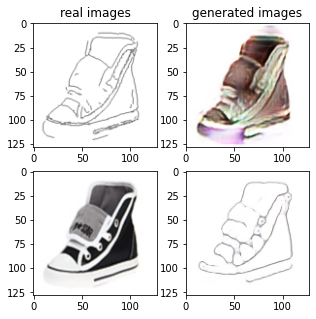

Train Epoch: 1 54% 	Total Loss: 1.419158 	Loss_G_AB: 0.300489	Loss_G_BA: 0.957126	Loss_cycle: 0.493341	Loss_D_A: 0.007670	Loss_D_B: 0.289339
0 27009 T:  1.9187235832214355
Train Epoch: 1 54% 	Total Loss: 1.481454 	Loss_G_AB: 0.277747	Loss_G_BA: 1.009170	Loss_cycle: 0.572869	Loss_D_A: 0.005513	Loss_D_B: 0.259614
0 27019 T:  1.1961913108825684
Train Epoch: 1 54% 	Total Loss: 1.375632 	Loss_G_AB: 0.300791	Loss_G_BA: 1.012790	Loss_cycle: 0.481097	Loss_D_A: 0.004321	Loss_D_B: 0.233424
0 27029 T:  1.1813015937805176
Train Epoch: 1 54% 	Total Loss: 1.548802 	Loss_G_AB: 0.263289	Loss_G_BA: 0.952113	Loss_cycle: 0.663900	Loss_D_A: 0.007321	Loss_D_B: 0.269880
0 27039 T:  1.1826367378234863
Train Epoch: 1 54% 	Total Loss: 1.441666 	Loss_G_AB: 0.313248	Loss_G_BA: 1.035170	Loss_cycle: 0.514924	Loss_D_A: 0.003877	Loss_D_B: 0.248656
0 27049 T:  1.1837663650512695
Train Epoch: 1 54% 	Total Loss: 1.276769 	Loss_G_AB: 0.255395	Loss_G_BA: 0.946980	Loss_cycle: 0.399139	Loss_D_A: 0.011194	Loss_D_B: 0.265249

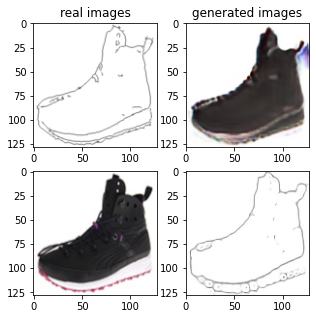

Train Epoch: 1 56% 	Total Loss: 1.332457 	Loss_G_AB: 0.323642	Loss_G_BA: 0.843838	Loss_cycle: 0.452481	Loss_D_A: 0.057925	Loss_D_B: 0.238310
0 28009 T:  1.9679861068725586
Train Epoch: 1 56% 	Total Loss: 1.334797 	Loss_G_AB: 0.301882	Loss_G_BA: 0.912096	Loss_cycle: 0.457095	Loss_D_A: 0.026887	Loss_D_B: 0.243826
0 28019 T:  1.1794662475585938
Train Epoch: 1 56% 	Total Loss: 1.390487 	Loss_G_AB: 0.277202	Loss_G_BA: 0.945253	Loss_cycle: 0.503556	Loss_D_A: 0.024141	Loss_D_B: 0.251563
0 28029 T:  1.1811697483062744
Train Epoch: 1 56% 	Total Loss: 1.466518 	Loss_G_AB: 0.284133	Loss_G_BA: 0.988763	Loss_cycle: 0.523526	Loss_D_A: 0.049596	Loss_D_B: 0.256948
0 28039 T:  1.1817772388458252
Train Epoch: 1 56% 	Total Loss: 1.521270 	Loss_G_AB: 0.306263	Loss_G_BA: 0.805662	Loss_cycle: 0.615446	Loss_D_A: 0.084147	Loss_D_B: 0.265714
0 28049 T:  1.188901662826538
Train Epoch: 1 56% 	Total Loss: 1.316503 	Loss_G_AB: 0.279866	Loss_G_BA: 0.874071	Loss_cycle: 0.457444	Loss_D_A: 0.039600	Loss_D_B: 0.242491


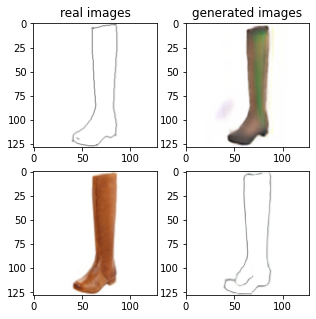

Train Epoch: 1 58% 	Total Loss: 1.370595 	Loss_G_AB: 0.297056	Loss_G_BA: 1.024925	Loss_cycle: 0.432430	Loss_D_A: 0.007488	Loss_D_B: 0.269686
0 29009 T:  1.9387800693511963
Train Epoch: 1 58% 	Total Loss: 1.411904 	Loss_G_AB: 0.288351	Loss_G_BA: 0.968534	Loss_cycle: 0.499477	Loss_D_A: 0.018308	Loss_D_B: 0.265677
0 29019 T:  1.1808645725250244
Train Epoch: 1 58% 	Total Loss: 1.471259 	Loss_G_AB: 0.290334	Loss_G_BA: 0.998917	Loss_cycle: 0.569670	Loss_D_A: 0.010933	Loss_D_B: 0.246030
0 29029 T:  1.1842684745788574
Train Epoch: 1 58% 	Total Loss: 1.508570 	Loss_G_AB: 0.314492	Loss_G_BA: 0.988982	Loss_cycle: 0.603806	Loss_D_A: 0.004944	Loss_D_B: 0.248083
0 29039 T:  1.1862890720367432
Train Epoch: 1 58% 	Total Loss: 1.419543 	Loss_G_AB: 0.314955	Loss_G_BA: 0.992315	Loss_cycle: 0.509733	Loss_D_A: 0.004349	Loss_D_B: 0.251825
0 29049 T:  1.1887381076812744
Train Epoch: 1 58% 	Total Loss: 1.409086 	Loss_G_AB: 0.341436	Loss_G_BA: 0.985511	Loss_cycle: 0.468724	Loss_D_A: 0.004910	Loss_D_B: 0.271978

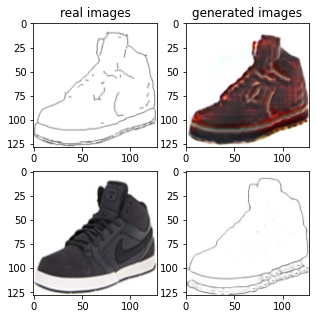

Train Epoch: 1 60% 	Total Loss: 1.343882 	Loss_G_AB: 0.336107	Loss_G_BA: 0.936053	Loss_cycle: 0.446552	Loss_D_A: 0.043300	Loss_D_B: 0.217950
0 30009 T:  1.9234364032745361
Train Epoch: 1 60% 	Total Loss: 1.384846 	Loss_G_AB: 0.306594	Loss_G_BA: 0.871940	Loss_cycle: 0.484456	Loss_D_A: 0.064000	Loss_D_B: 0.247124
0 30019 T:  1.1865520477294922
Train Epoch: 1 60% 	Total Loss: 1.485179 	Loss_G_AB: 0.319919	Loss_G_BA: 0.982931	Loss_cycle: 0.538583	Loss_D_A: 0.022085	Loss_D_B: 0.273087
0 30029 T:  1.1788246631622314
Train Epoch: 1 60% 	Total Loss: 1.327351 	Loss_G_AB: 0.381146	Loss_G_BA: 0.810340	Loss_cycle: 0.458384	Loss_D_A: 0.030193	Loss_D_B: 0.243031
0 30039 T:  1.1685960292816162
Train Epoch: 1 60% 	Total Loss: 1.522150 	Loss_G_AB: 0.330935	Loss_G_BA: 1.016547	Loss_cycle: 0.546680	Loss_D_A: 0.053519	Loss_D_B: 0.248210
0 30049 T:  1.1810200214385986
Train Epoch: 1 60% 	Total Loss: 1.397170 	Loss_G_AB: 0.277401	Loss_G_BA: 0.907672	Loss_cycle: 0.524729	Loss_D_A: 0.023251	Loss_D_B: 0.256654

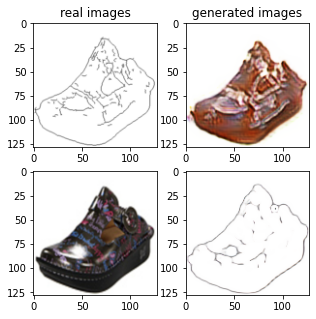

Train Epoch: 1 62% 	Total Loss: 1.332479 	Loss_G_AB: 0.265973	Loss_G_BA: 0.989668	Loss_cycle: 0.450053	Loss_D_A: 0.003490	Loss_D_B: 0.251116
0 31009 T:  1.95607590675354
Train Epoch: 1 62% 	Total Loss: 1.248848 	Loss_G_AB: 0.305061	Loss_G_BA: 0.972643	Loss_cycle: 0.360122	Loss_D_A: 0.005966	Loss_D_B: 0.243907
0 31019 T:  1.1718029975891113
Train Epoch: 1 62% 	Total Loss: 1.375040 	Loss_G_AB: 0.280760	Loss_G_BA: 1.010322	Loss_cycle: 0.480656	Loss_D_A: 0.005896	Loss_D_B: 0.242948
0 31029 T:  1.1782186031341553
Train Epoch: 1 62% 	Total Loss: 1.272887 	Loss_G_AB: 0.300230	Loss_G_BA: 0.996612	Loss_cycle: 0.383741	Loss_D_A: 0.006227	Loss_D_B: 0.234498
0 31039 T:  1.1800973415374756
Train Epoch: 1 62% 	Total Loss: 1.488415 	Loss_G_AB: 0.293706	Loss_G_BA: 1.005870	Loss_cycle: 0.565436	Loss_D_A: 0.003020	Loss_D_B: 0.270171
0 31049 T:  1.1859841346740723
Train Epoch: 1 62% 	Total Loss: 1.457356 	Loss_G_AB: 0.301515	Loss_G_BA: 0.990632	Loss_cycle: 0.548720	Loss_D_A: 0.004463	Loss_D_B: 0.258100
0

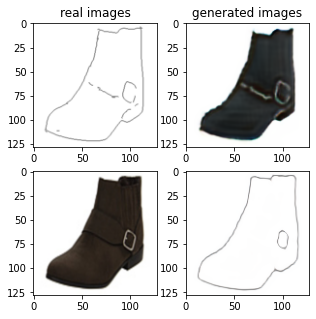

Train Epoch: 1 64% 	Total Loss: 1.372670 	Loss_G_AB: 0.323116	Loss_G_BA: 0.924923	Loss_cycle: 0.434501	Loss_D_A: 0.073240	Loss_D_B: 0.240909
0 32009 T:  2.0527563095092773
Train Epoch: 1 64% 	Total Loss: 1.388063 	Loss_G_AB: 0.261130	Loss_G_BA: 0.730316	Loss_cycle: 0.523547	Loss_D_A: 0.104703	Loss_D_B: 0.264090
0 32019 T:  1.1759443283081055
Train Epoch: 1 64% 	Total Loss: 1.301722 	Loss_G_AB: 0.285278	Loss_G_BA: 0.764669	Loss_cycle: 0.445834	Loss_D_A: 0.089418	Loss_D_B: 0.241497
0 32029 T:  1.176063060760498
Train Epoch: 1 64% 	Total Loss: 1.464024 	Loss_G_AB: 0.290659	Loss_G_BA: 0.900195	Loss_cycle: 0.545604	Loss_D_A: 0.058735	Loss_D_B: 0.264257
0 32039 T:  1.1740658283233643
Train Epoch: 1 64% 	Total Loss: 1.499075 	Loss_G_AB: 0.301394	Loss_G_BA: 1.011025	Loss_cycle: 0.543305	Loss_D_A: 0.063879	Loss_D_B: 0.235682
0 32049 T:  1.1768639087677002
Train Epoch: 1 64% 	Total Loss: 1.459472 	Loss_G_AB: 0.301918	Loss_G_BA: 0.932315	Loss_cycle: 0.583938	Loss_D_A: 0.017588	Loss_D_B: 0.240830


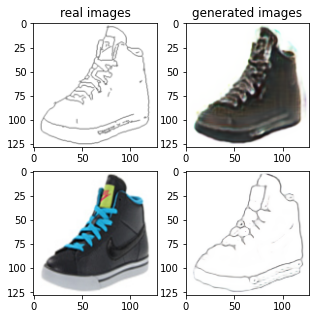

Train Epoch: 1 66% 	Total Loss: 1.356304 	Loss_G_AB: 0.281860	Loss_G_BA: 0.973946	Loss_cycle: 0.473705	Loss_D_A: 0.007838	Loss_D_B: 0.246858
0 33009 T:  1.9165749549865723
Train Epoch: 1 66% 	Total Loss: 1.420286 	Loss_G_AB: 0.299420	Loss_G_BA: 1.019889	Loss_cycle: 0.508274	Loss_D_A: 0.004786	Loss_D_B: 0.247572
0 33019 T:  1.1796131134033203
Train Epoch: 1 66% 	Total Loss: 1.439918 	Loss_G_AB: 0.276623	Loss_G_BA: 1.034046	Loss_cycle: 0.482041	Loss_D_A: 0.036262	Loss_D_B: 0.266281
0 33029 T:  1.1768555641174316
Train Epoch: 1 66% 	Total Loss: 1.362894 	Loss_G_AB: 0.284586	Loss_G_BA: 0.935709	Loss_cycle: 0.487843	Loss_D_A: 0.019464	Loss_D_B: 0.245440
0 33039 T:  1.1750223636627197
Train Epoch: 1 66% 	Total Loss: 1.326887 	Loss_G_AB: 0.291279	Loss_G_BA: 0.934952	Loss_cycle: 0.433107	Loss_D_A: 0.022991	Loss_D_B: 0.257673
0 33049 T:  1.1774356365203857
Train Epoch: 1 66% 	Total Loss: 1.485788 	Loss_G_AB: 0.280203	Loss_G_BA: 1.010903	Loss_cycle: 0.580085	Loss_D_A: 0.013585	Loss_D_B: 0.246565

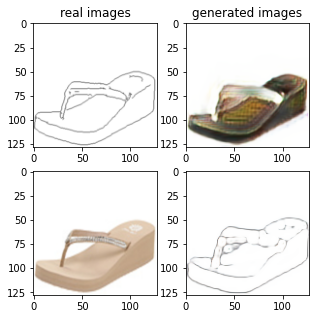

Train Epoch: 1 68% 	Total Loss: 1.486286 	Loss_G_AB: 0.305277	Loss_G_BA: 0.971618	Loss_cycle: 0.568989	Loss_D_A: 0.029290	Loss_D_B: 0.249559
0 34009 T:  1.8929274082183838
Train Epoch: 1 68% 	Total Loss: 1.350923 	Loss_G_AB: 0.291018	Loss_G_BA: 0.986003	Loss_cycle: 0.390495	Loss_D_A: 0.060519	Loss_D_B: 0.261398
0 34019 T:  1.1773672103881836
Train Epoch: 1 68% 	Total Loss: 1.336954 	Loss_G_AB: 0.259478	Loss_G_BA: 0.864645	Loss_cycle: 0.448180	Loss_D_A: 0.061151	Loss_D_B: 0.265562
0 34029 T:  1.180452823638916
Train Epoch: 1 68% 	Total Loss: 1.406568 	Loss_G_AB: 0.270134	Loss_G_BA: 0.973344	Loss_cycle: 0.481655	Loss_D_A: 0.051767	Loss_D_B: 0.251407
0 34039 T:  1.1826601028442383
Train Epoch: 1 68% 	Total Loss: 1.455169 	Loss_G_AB: 0.319393	Loss_G_BA: 1.011650	Loss_cycle: 0.506385	Loss_D_A: 0.009782	Loss_D_B: 0.273481
0 34049 T:  1.1651160717010498
Train Epoch: 1 68% 	Total Loss: 1.367154 	Loss_G_AB: 0.328271	Loss_G_BA: 0.993104	Loss_cycle: 0.461088	Loss_D_A: 0.004309	Loss_D_B: 0.241069


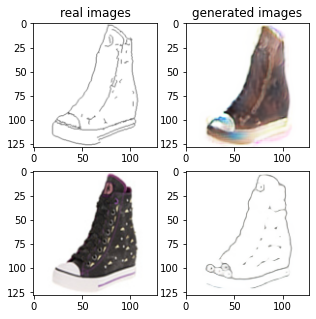

Train Epoch: 1 70% 	Total Loss: 1.379085 	Loss_G_AB: 0.295212	Loss_G_BA: 1.005230	Loss_cycle: 0.469542	Loss_D_A: 0.005508	Loss_D_B: 0.253814
0 35009 T:  1.9250872135162354
Train Epoch: 1 70% 	Total Loss: 1.310658 	Loss_G_AB: 0.284883	Loss_G_BA: 0.978683	Loss_cycle: 0.428641	Loss_D_A: 0.014863	Loss_D_B: 0.235373
0 35019 T:  1.1760377883911133
Train Epoch: 1 70% 	Total Loss: 1.449956 	Loss_G_AB: 0.296128	Loss_G_BA: 0.981346	Loss_cycle: 0.548415	Loss_D_A: 0.007363	Loss_D_B: 0.255442
0 35029 T:  1.178056001663208
Train Epoch: 1 70% 	Total Loss: 1.615820 	Loss_G_AB: 0.342817	Loss_G_BA: 0.930062	Loss_cycle: 0.703378	Loss_D_A: 0.030654	Loss_D_B: 0.245349
0 35039 T:  1.1734542846679688
Train Epoch: 1 70% 	Total Loss: 1.380478 	Loss_G_AB: 0.259200	Loss_G_BA: 0.981843	Loss_cycle: 0.497184	Loss_D_A: 0.012372	Loss_D_B: 0.250400
0 35049 T:  1.1782498359680176
Train Epoch: 1 70% 	Total Loss: 1.326572 	Loss_G_AB: 0.308167	Loss_G_BA: 0.965450	Loss_cycle: 0.458521	Loss_D_A: 0.009358	Loss_D_B: 0.221885


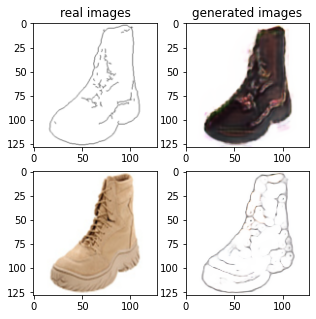

Train Epoch: 1 72% 	Total Loss: 1.466142 	Loss_G_AB: 0.271899	Loss_G_BA: 0.985723	Loss_cycle: 0.576441	Loss_D_A: 0.005197	Loss_D_B: 0.255693
0 36009 T:  1.9187805652618408
Train Epoch: 1 72% 	Total Loss: 1.345952 	Loss_G_AB: 0.279489	Loss_G_BA: 1.011400	Loss_cycle: 0.445033	Loss_D_A: 0.005081	Loss_D_B: 0.250393
0 36019 T:  1.1768748760223389
Train Epoch: 1 72% 	Total Loss: 1.204121 	Loss_G_AB: 0.305971	Loss_G_BA: 0.961664	Loss_cycle: 0.323816	Loss_D_A: 0.006234	Loss_D_B: 0.240253
0 36029 T:  1.1727266311645508
Train Epoch: 1 72% 	Total Loss: 1.404163 	Loss_G_AB: 0.279154	Loss_G_BA: 1.008504	Loss_cycle: 0.497322	Loss_D_A: 0.004458	Loss_D_B: 0.258554
0 36039 T:  1.1772758960723877
Train Epoch: 1 72% 	Total Loss: 1.449769 	Loss_G_AB: 0.299671	Loss_G_BA: 1.008155	Loss_cycle: 0.527946	Loss_D_A: 0.005957	Loss_D_B: 0.261953
0 36049 T:  1.1818256378173828
Train Epoch: 1 72% 	Total Loss: 1.406132 	Loss_G_AB: 0.290056	Loss_G_BA: 0.991914	Loss_cycle: 0.507138	Loss_D_A: 0.005765	Loss_D_B: 0.252244

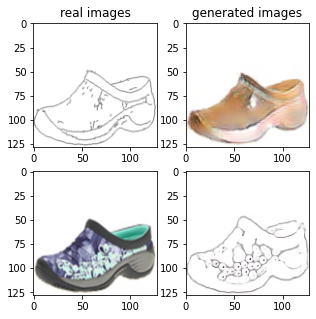

Train Epoch: 1 74% 	Total Loss: 1.341173 	Loss_G_AB: 0.293557	Loss_G_BA: 0.570372	Loss_cycle: 0.499477	Loss_D_A: 0.154982	Loss_D_B: 0.254750
0 37009 T:  2.0673511028289795
Train Epoch: 1 74% 	Total Loss: 1.376496 	Loss_G_AB: 0.287000	Loss_G_BA: 0.722951	Loss_cycle: 0.429041	Loss_D_A: 0.180695	Loss_D_B: 0.261784
0 37019 T:  1.181220293045044
Train Epoch: 1 74% 	Total Loss: 1.244257 	Loss_G_AB: 0.325677	Loss_G_BA: 0.641865	Loss_cycle: 0.416590	Loss_D_A: 0.126631	Loss_D_B: 0.217266
0 37029 T:  1.1880369186401367
Train Epoch: 1 74% 	Total Loss: 1.421708 	Loss_G_AB: 0.349327	Loss_G_BA: 0.598428	Loss_cycle: 0.565779	Loss_D_A: 0.136641	Loss_D_B: 0.245411
0 37039 T:  1.2121422290802002
Train Epoch: 1 74% 	Total Loss: 1.470112 	Loss_G_AB: 0.304264	Loss_G_BA: 0.675545	Loss_cycle: 0.513813	Loss_D_A: 0.205988	Loss_D_B: 0.260407
0 37049 T:  1.1796255111694336
Train Epoch: 1 74% 	Total Loss: 1.418721 	Loss_G_AB: 0.260106	Loss_G_BA: 0.574374	Loss_cycle: 0.537690	Loss_D_A: 0.186347	Loss_D_B: 0.277444


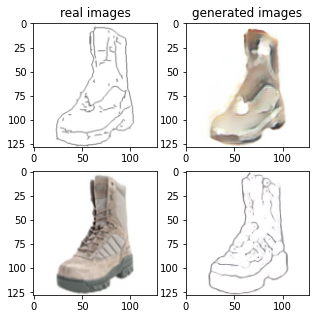

Train Epoch: 1 76% 	Total Loss: 1.331794 	Loss_G_AB: 0.292060	Loss_G_BA: 1.021429	Loss_cycle: 0.416194	Loss_D_A: 0.010742	Loss_D_B: 0.248113
0 38009 T:  1.9198548793792725
Train Epoch: 1 76% 	Total Loss: 1.328396 	Loss_G_AB: 0.290975	Loss_G_BA: 0.996046	Loss_cycle: 0.428685	Loss_D_A: 0.003218	Loss_D_B: 0.252982
0 38019 T:  1.1895275115966797
Train Epoch: 1 76% 	Total Loss: 1.310188 	Loss_G_AB: 0.271583	Loss_G_BA: 0.999878	Loss_cycle: 0.427687	Loss_D_A: 0.004299	Loss_D_B: 0.242472
0 38029 T:  1.1791272163391113
Train Epoch: 1 76% 	Total Loss: 1.304590 	Loss_G_AB: 0.291473	Loss_G_BA: 1.001988	Loss_cycle: 0.414244	Loss_D_A: 0.004574	Loss_D_B: 0.239041
0 38039 T:  1.1758513450622559
Train Epoch: 1 76% 	Total Loss: 1.410131 	Loss_G_AB: 0.302469	Loss_G_BA: 0.985614	Loss_cycle: 0.511579	Loss_D_A: 0.005465	Loss_D_B: 0.249046
0 38049 T:  1.1795573234558105
Train Epoch: 1 76% 	Total Loss: 1.322400 	Loss_G_AB: 0.280587	Loss_G_BA: 1.018187	Loss_cycle: 0.409835	Loss_D_A: 0.003603	Loss_D_B: 0.259576

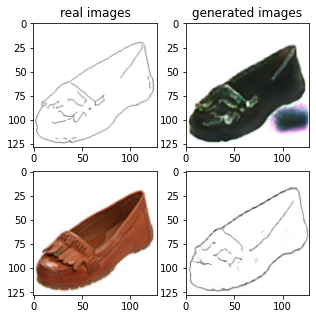

Train Epoch: 1 78% 	Total Loss: 1.330759 	Loss_G_AB: 0.312615	Loss_G_BA: 0.988762	Loss_cycle: 0.408073	Loss_D_A: 0.007472	Loss_D_B: 0.264525
0 39009 T:  1.9462721347808838
Train Epoch: 1 78% 	Total Loss: 1.324846 	Loss_G_AB: 0.293294	Loss_G_BA: 0.997460	Loss_cycle: 0.417041	Loss_D_A: 0.008118	Loss_D_B: 0.254310
0 39019 T:  1.1847949028015137
Train Epoch: 1 78% 	Total Loss: 1.433727 	Loss_G_AB: 0.279020	Loss_G_BA: 1.020164	Loss_cycle: 0.529595	Loss_D_A: 0.003980	Loss_D_B: 0.250560
0 39029 T:  1.1805918216705322
Train Epoch: 1 78% 	Total Loss: 1.245497 	Loss_G_AB: 0.275819	Loss_G_BA: 0.982946	Loss_cycle: 0.372922	Loss_D_A: 0.004472	Loss_D_B: 0.238721
0 39039 T:  1.1877422332763672
Train Epoch: 1 78% 	Total Loss: 1.320086 	Loss_G_AB: 0.300225	Loss_G_BA: 0.991863	Loss_cycle: 0.401577	Loss_D_A: 0.006241	Loss_D_B: 0.266224
0 39049 T:  1.1794893741607666
Train Epoch: 1 78% 	Total Loss: 1.335500 	Loss_G_AB: 0.290507	Loss_G_BA: 0.976133	Loss_cycle: 0.443620	Loss_D_A: 0.007074	Loss_D_B: 0.251486

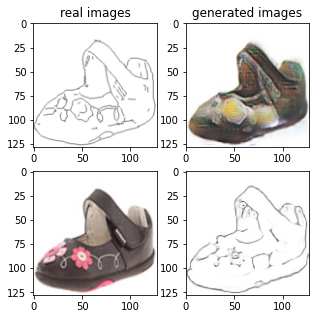

Train Epoch: 1 80% 	Total Loss: 1.363992 	Loss_G_AB: 0.280518	Loss_G_BA: 0.990877	Loss_cycle: 0.457312	Loss_D_A: 0.002893	Loss_D_B: 0.268090
0 40009 T:  1.9061424732208252
Train Epoch: 1 80% 	Total Loss: 1.314646 	Loss_G_AB: 0.288933	Loss_G_BA: 1.001644	Loss_cycle: 0.417630	Loss_D_A: 0.002098	Loss_D_B: 0.249630
0 40019 T:  1.1788122653961182
Train Epoch: 1 80% 	Total Loss: 1.305614 	Loss_G_AB: 0.283040	Loss_G_BA: 0.994028	Loss_cycle: 0.399462	Loss_D_A: 0.003790	Loss_D_B: 0.263828
0 40029 T:  1.1760914325714111
Train Epoch: 1 80% 	Total Loss: 1.394667 	Loss_G_AB: 0.276923	Loss_G_BA: 0.982850	Loss_cycle: 0.510783	Loss_D_A: 0.005407	Loss_D_B: 0.248590
0 40039 T:  1.181248426437378
Train Epoch: 1 80% 	Total Loss: 1.286469 	Loss_G_AB: 0.307063	Loss_G_BA: 1.004170	Loss_cycle: 0.374246	Loss_D_A: 0.004008	Loss_D_B: 0.252599
0 40049 T:  1.1764466762542725
Train Epoch: 1 80% 	Total Loss: 1.409810 	Loss_G_AB: 0.273900	Loss_G_BA: 0.980538	Loss_cycle: 0.516939	Loss_D_A: 0.002818	Loss_D_B: 0.262833


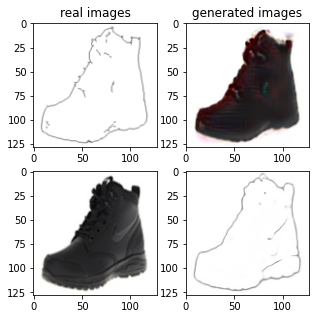

Train Epoch: 1 82% 	Total Loss: 1.304943 	Loss_G_AB: 0.279048	Loss_G_BA: 0.993344	Loss_cycle: 0.407995	Loss_D_A: 0.003104	Loss_D_B: 0.257648
0 41009 T:  1.903501033782959
Train Epoch: 1 82% 	Total Loss: 1.296055 	Loss_G_AB: 0.329214	Loss_G_BA: 1.019057	Loss_cycle: 0.403271	Loss_D_A: 0.004475	Loss_D_B: 0.214173
0 41019 T:  1.1742360591888428
Train Epoch: 1 82% 	Total Loss: 1.378004 	Loss_G_AB: 0.341333	Loss_G_BA: 0.999137	Loss_cycle: 0.415323	Loss_D_A: 0.003290	Loss_D_B: 0.289155
0 41029 T:  1.1707403659820557
Train Epoch: 1 82% 	Total Loss: 1.330691 	Loss_G_AB: 0.273649	Loss_G_BA: 0.983540	Loss_cycle: 0.420796	Loss_D_A: 0.002116	Loss_D_B: 0.279185
0 41039 T:  1.177232265472412
Train Epoch: 1 82% 	Total Loss: 1.267282 	Loss_G_AB: 0.295766	Loss_G_BA: 1.012247	Loss_cycle: 0.354683	Loss_D_A: 0.004005	Loss_D_B: 0.254588
0 41049 T:  1.1805057525634766
Train Epoch: 1 82% 	Total Loss: 1.232571 	Loss_G_AB: 0.277161	Loss_G_BA: 0.998110	Loss_cycle: 0.347729	Loss_D_A: 0.001972	Loss_D_B: 0.245235
0

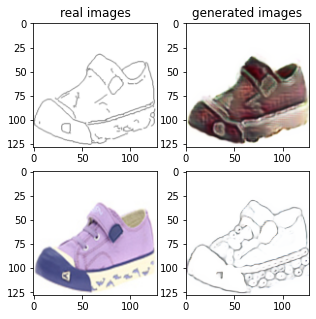

Train Epoch: 1 84% 	Total Loss: 1.439838 	Loss_G_AB: 0.290726	Loss_G_BA: 1.014278	Loss_cycle: 0.517361	Loss_D_A: 0.031616	Loss_D_B: 0.238359
0 42009 T:  1.9065194129943848
Train Epoch: 1 84% 	Total Loss: 1.229109 	Loss_G_AB: 0.300067	Loss_G_BA: 0.822002	Loss_cycle: 0.353252	Loss_D_A: 0.075776	Loss_D_B: 0.239047
0 42019 T:  1.1745595932006836
Train Epoch: 1 84% 	Total Loss: 1.276513 	Loss_G_AB: 0.297817	Loss_G_BA: 0.983236	Loss_cycle: 0.318355	Loss_D_A: 0.065033	Loss_D_B: 0.252599
0 42029 T:  1.1737926006317139
Train Epoch: 1 84% 	Total Loss: 1.333815 	Loss_G_AB: 0.297668	Loss_G_BA: 0.979149	Loss_cycle: 0.439372	Loss_D_A: 0.011374	Loss_D_B: 0.244661
0 42039 T:  1.1766810417175293
Train Epoch: 1 84% 	Total Loss: 1.352285 	Loss_G_AB: 0.285165	Loss_G_BA: 1.024355	Loss_cycle: 0.415771	Loss_D_A: 0.007632	Loss_D_B: 0.274121
0 42049 T:  1.1760926246643066
Train Epoch: 1 84% 	Total Loss: 1.295996 	Loss_G_AB: 0.302515	Loss_G_BA: 0.958953	Loss_cycle: 0.388001	Loss_D_A: 0.038791	Loss_D_B: 0.238469

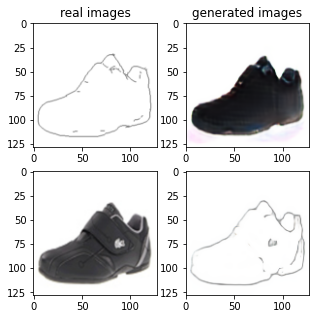

Train Epoch: 1 86% 	Total Loss: 1.370366 	Loss_G_AB: 0.283029	Loss_G_BA: 1.005930	Loss_cycle: 0.454207	Loss_D_A: 0.007114	Loss_D_B: 0.264565
0 43009 T:  1.9850881099700928
Train Epoch: 1 86% 	Total Loss: 1.335191 	Loss_G_AB: 0.286397	Loss_G_BA: 0.994378	Loss_cycle: 0.427176	Loss_D_A: 0.002040	Loss_D_B: 0.265586
0 43019 T:  1.1801040172576904
Train Epoch: 1 86% 	Total Loss: 1.398376 	Loss_G_AB: 0.326167	Loss_G_BA: 0.986101	Loss_cycle: 0.512804	Loss_D_A: 0.004006	Loss_D_B: 0.225432
0 43029 T:  1.1783955097198486
Train Epoch: 1 86% 	Total Loss: 1.339999 	Loss_G_AB: 0.289898	Loss_G_BA: 0.929423	Loss_cycle: 0.419386	Loss_D_A: 0.060084	Loss_D_B: 0.250869
0 43039 T:  1.1819977760314941
Train Epoch: 1 86% 	Total Loss: 1.378659 	Loss_G_AB: 0.326923	Loss_G_BA: 0.933655	Loss_cycle: 0.512437	Loss_D_A: 0.028978	Loss_D_B: 0.206955
0 43049 T:  1.1775941848754883
Train Epoch: 1 86% 	Total Loss: 1.363349 	Loss_G_AB: 0.292189	Loss_G_BA: 0.838972	Loss_cycle: 0.467320	Loss_D_A: 0.082126	Loss_D_B: 0.248323

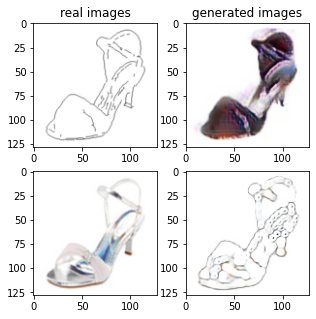

Train Epoch: 1 88% 	Total Loss: 1.254324 	Loss_G_AB: 0.282081	Loss_G_BA: 0.947109	Loss_cycle: 0.338872	Loss_D_A: 0.045660	Loss_D_B: 0.255196
0 44009 T:  1.9147984981536865
Train Epoch: 1 88% 	Total Loss: 1.463199 	Loss_G_AB: 0.332974	Loss_G_BA: 0.963042	Loss_cycle: 0.567449	Loss_D_A: 0.025357	Loss_D_B: 0.222385
0 44019 T:  1.177356481552124
Train Epoch: 1 88% 	Total Loss: 1.469607 	Loss_G_AB: 0.351089	Loss_G_BA: 0.866809	Loss_cycle: 0.524351	Loss_D_A: 0.083866	Loss_D_B: 0.252440
0 44029 T:  1.1760351657867432
Train Epoch: 1 88% 	Total Loss: 1.283878 	Loss_G_AB: 0.324773	Loss_G_BA: 0.638821	Loss_cycle: 0.349002	Loss_D_A: 0.230020	Loss_D_B: 0.223058
0 44039 T:  1.245793342590332
Train Epoch: 1 88% 	Total Loss: 1.318980 	Loss_G_AB: 0.295530	Loss_G_BA: 0.607916	Loss_cycle: 0.436324	Loss_D_A: 0.185922	Loss_D_B: 0.245011
0 44049 T:  1.19132661819458
Train Epoch: 1 88% 	Total Loss: 1.412986 	Loss_G_AB: 0.315343	Loss_G_BA: 0.812669	Loss_cycle: 0.409026	Loss_D_A: 0.210041	Loss_D_B: 0.229912
0 4

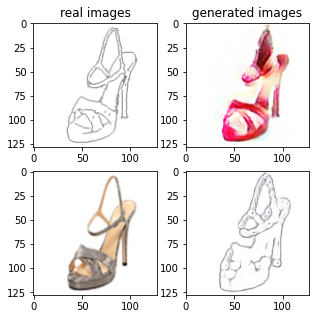

Train Epoch: 1 90% 	Total Loss: 1.321109 	Loss_G_AB: 0.305294	Loss_G_BA: 0.994711	Loss_cycle: 0.434777	Loss_D_A: 0.002293	Loss_D_B: 0.234037
0 45009 T:  1.906003713607788
Train Epoch: 1 90% 	Total Loss: 1.257067 	Loss_G_AB: 0.270632	Loss_G_BA: 0.994840	Loss_cycle: 0.365691	Loss_D_A: 0.003968	Loss_D_B: 0.254673
0 45019 T:  1.1778817176818848
Train Epoch: 1 90% 	Total Loss: 1.278947 	Loss_G_AB: 0.274961	Loss_G_BA: 1.003049	Loss_cycle: 0.373080	Loss_D_A: 0.002950	Loss_D_B: 0.263912
0 45029 T:  1.188736915588379
Train Epoch: 1 90% 	Total Loss: 1.259523 	Loss_G_AB: 0.267743	Loss_G_BA: 0.992231	Loss_cycle: 0.378995	Loss_D_A: 0.002821	Loss_D_B: 0.247720
0 45039 T:  1.180145263671875
Train Epoch: 1 90% 	Total Loss: 1.337192 	Loss_G_AB: 0.309672	Loss_G_BA: 1.007926	Loss_cycle: 0.429200	Loss_D_A: 0.002969	Loss_D_B: 0.246224
0 45049 T:  1.176863431930542
Train Epoch: 1 90% 	Total Loss: 1.207075 	Loss_G_AB: 0.288181	Loss_G_BA: 1.001003	Loss_cycle: 0.310275	Loss_D_A: 0.002644	Loss_D_B: 0.249564
0 4

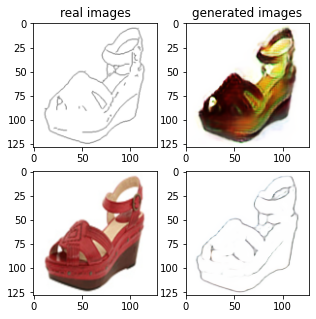

Train Epoch: 1 92% 	Total Loss: 1.403316 	Loss_G_AB: 0.322004	Loss_G_BA: 0.914641	Loss_cycle: 0.463043	Loss_D_A: 0.089830	Loss_D_B: 0.232120
0 46009 T:  1.931058406829834
Train Epoch: 1 92% 	Total Loss: 1.284855 	Loss_G_AB: 0.301996	Loss_G_BA: 0.976723	Loss_cycle: 0.391446	Loss_D_A: 0.022410	Loss_D_B: 0.231640
0 46019 T:  1.1818695068359375
Train Epoch: 1 92% 	Total Loss: 1.358226 	Loss_G_AB: 0.284744	Loss_G_BA: 1.002529	Loss_cycle: 0.460335	Loss_D_A: 0.003554	Loss_D_B: 0.250702
0 46029 T:  1.1800127029418945
Train Epoch: 1 92% 	Total Loss: 1.263075 	Loss_G_AB: 0.302386	Loss_G_BA: 0.953505	Loss_cycle: 0.347522	Loss_D_A: 0.034909	Loss_D_B: 0.252699
0 46039 T:  1.1810553073883057
Train Epoch: 1 92% 	Total Loss: 1.335108 	Loss_G_AB: 0.281471	Loss_G_BA: 0.956338	Loss_cycle: 0.434203	Loss_D_A: 0.043239	Loss_D_B: 0.238761
0 46049 T:  1.1796379089355469
Train Epoch: 1 92% 	Total Loss: 1.351290 	Loss_G_AB: 0.341469	Loss_G_BA: 1.016622	Loss_cycle: 0.435101	Loss_D_A: 0.017819	Loss_D_B: 0.219324


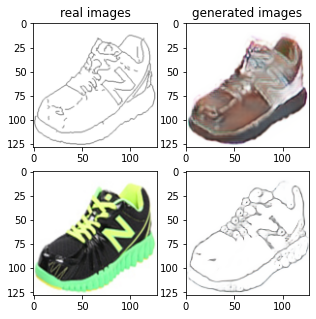

Train Epoch: 1 94% 	Total Loss: 1.382900 	Loss_G_AB: 0.306944	Loss_G_BA: 0.936234	Loss_cycle: 0.495163	Loss_D_A: 0.020333	Loss_D_B: 0.245816
0 47009 T:  1.9404025077819824
Train Epoch: 1 94% 	Total Loss: 1.345347 	Loss_G_AB: 0.342720	Loss_G_BA: 0.888493	Loss_cycle: 0.439669	Loss_D_A: 0.048963	Loss_D_B: 0.241108
0 47019 T:  1.1764934062957764
Train Epoch: 1 94% 	Total Loss: 1.268739 	Loss_G_AB: 0.328021	Loss_G_BA: 0.953303	Loss_cycle: 0.371978	Loss_D_A: 0.029501	Loss_D_B: 0.226598
0 47029 T:  1.17844820022583
Train Epoch: 1 94% 	Total Loss: 1.456679 	Loss_G_AB: 0.289224	Loss_G_BA: 0.949908	Loss_cycle: 0.564150	Loss_D_A: 0.017185	Loss_D_B: 0.255778
0 47039 T:  1.187375783920288
Train Epoch: 1 94% 	Total Loss: 1.405891 	Loss_G_AB: 0.326582	Loss_G_BA: 1.032777	Loss_cycle: 0.495155	Loss_D_A: 0.012729	Loss_D_B: 0.218327
0 47049 T:  1.2029690742492676
Train Epoch: 1 94% 	Total Loss: 1.411001 	Loss_G_AB: 0.288054	Loss_G_BA: 1.016080	Loss_cycle: 0.502181	Loss_D_A: 0.005108	Loss_D_B: 0.251646
0 

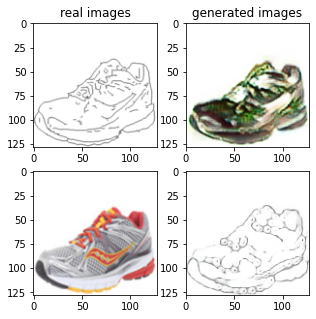

Train Epoch: 1 96% 	Total Loss: 1.316521 	Loss_G_AB: 0.291992	Loss_G_BA: 0.865601	Loss_cycle: 0.444996	Loss_D_A: 0.050003	Loss_D_B: 0.242725
0 48009 T:  1.9272453784942627
Train Epoch: 1 96% 	Total Loss: 1.331660 	Loss_G_AB: 0.279347	Loss_G_BA: 0.914668	Loss_cycle: 0.446155	Loss_D_A: 0.057094	Loss_D_B: 0.231403
0 48019 T:  1.187058925628662
Train Epoch: 1 96% 	Total Loss: 1.275055 	Loss_G_AB: 0.274785	Loss_G_BA: 1.053526	Loss_cycle: 0.327498	Loss_D_A: 0.029947	Loss_D_B: 0.253455
0 48029 T:  1.1775403022766113
Train Epoch: 1 96% 	Total Loss: 1.236067 	Loss_G_AB: 0.297233	Loss_G_BA: 0.875922	Loss_cycle: 0.378439	Loss_D_A: 0.011774	Loss_D_B: 0.259276
0 48039 T:  1.1785953044891357
Train Epoch: 1 96% 	Total Loss: 1.420325 	Loss_G_AB: 0.284043	Loss_G_BA: 1.062358	Loss_cycle: 0.487862	Loss_D_A: 0.013848	Loss_D_B: 0.245414
0 48049 T:  1.1719188690185547
Train Epoch: 1 96% 	Total Loss: 1.309800 	Loss_G_AB: 0.308845	Loss_G_BA: 1.001984	Loss_cycle: 0.415834	Loss_D_A: 0.003020	Loss_D_B: 0.235531


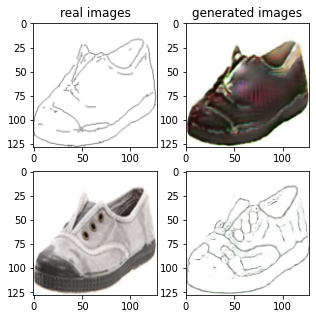

Train Epoch: 1 98% 	Total Loss: 1.299106 	Loss_G_AB: 0.291020	Loss_G_BA: 0.992032	Loss_cycle: 0.398331	Loss_D_A: 0.003946	Loss_D_B: 0.255303
0 49009 T:  2.0648391246795654
Train Epoch: 1 98% 	Total Loss: 1.302937 	Loss_G_AB: 0.321787	Loss_G_BA: 0.976598	Loss_cycle: 0.420615	Loss_D_A: 0.002003	Loss_D_B: 0.231125
0 49019 T:  1.1739904880523682
Train Epoch: 1 98% 	Total Loss: 1.352881 	Loss_G_AB: 0.371517	Loss_G_BA: 1.008781	Loss_cycle: 0.433348	Loss_D_A: 0.001665	Loss_D_B: 0.227719
0 49029 T:  1.1881544589996338
Train Epoch: 1 98% 	Total Loss: 1.247350 	Loss_G_AB: 0.260623	Loss_G_BA: 0.988469	Loss_cycle: 0.347568	Loss_D_A: 0.002610	Loss_D_B: 0.272625
0 49039 T:  1.1780297756195068
Train Epoch: 1 98% 	Total Loss: 1.288407 	Loss_G_AB: 0.294299	Loss_G_BA: 0.995836	Loss_cycle: 0.389484	Loss_D_A: 0.004374	Loss_D_B: 0.249482
0 49049 T:  1.1820018291473389
Train Epoch: 1 98% 	Total Loss: 1.354172 	Loss_G_AB: 0.295495	Loss_G_BA: 1.005723	Loss_cycle: 0.456268	Loss_D_A: 0.004718	Loss_D_B: 0.242577

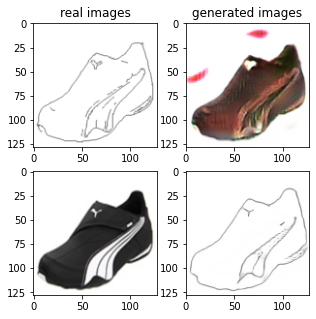

Train Epoch: 2 0% 	Total Loss: 1.428941 	Loss_G_AB: 0.282060	Loss_G_BA: 1.035282	Loss_cycle: 0.472321	Loss_D_A: 0.018758	Loss_D_B: 0.279191
1 50009 T:  1.9070565700531006
Train Epoch: 2 0% 	Total Loss: 1.399164 	Loss_G_AB: 0.306792	Loss_G_BA: 0.988759	Loss_cycle: 0.471316	Loss_D_A: 0.012374	Loss_D_B: 0.267700
1 50019 T:  1.171037197113037
Train Epoch: 2 0% 	Total Loss: 1.275730 	Loss_G_AB: 0.287978	Loss_G_BA: 0.960743	Loss_cycle: 0.405836	Loss_D_A: 0.015822	Loss_D_B: 0.229711
1 50029 T:  1.1717603206634521
Train Epoch: 2 0% 	Total Loss: 1.371625 	Loss_G_AB: 0.279721	Loss_G_BA: 0.859626	Loss_cycle: 0.411811	Loss_D_A: 0.145840	Loss_D_B: 0.244300
1 50039 T:  1.171238660812378
Train Epoch: 2 0% 	Total Loss: 1.288752 	Loss_G_AB: 0.307376	Loss_G_BA: 0.983807	Loss_cycle: 0.388574	Loss_D_A: 0.019853	Loss_D_B: 0.234733
1 50049 T:  1.1728794574737549
Train Epoch: 2 0% 	Total Loss: 1.453232 	Loss_G_AB: 0.272848	Loss_G_BA: 1.009791	Loss_cycle: 0.551574	Loss_D_A: 0.006102	Loss_D_B: 0.254237
1 50059

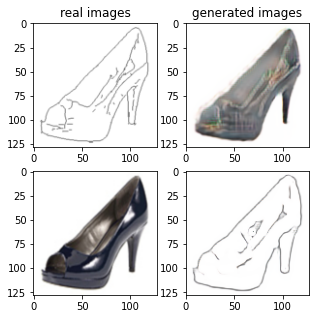

Train Epoch: 2 2% 	Total Loss: 1.265264 	Loss_G_AB: 0.241159	Loss_G_BA: 0.920222	Loss_cycle: 0.395822	Loss_D_A: 0.016507	Loss_D_B: 0.272245
1 51009 T:  1.913703441619873
Train Epoch: 2 2% 	Total Loss: 1.373032 	Loss_G_AB: 0.330690	Loss_G_BA: 0.997863	Loss_cycle: 0.454573	Loss_D_A: 0.034139	Loss_D_B: 0.220043
1 51019 T:  1.1785542964935303
Train Epoch: 2 2% 	Total Loss: 1.238163 	Loss_G_AB: 0.300133	Loss_G_BA: 0.962069	Loss_cycle: 0.369461	Loss_D_A: 0.010611	Loss_D_B: 0.226990
1 51029 T:  1.1736488342285156
Train Epoch: 2 2% 	Total Loss: 1.356950 	Loss_G_AB: 0.348797	Loss_G_BA: 0.985081	Loss_cycle: 0.423119	Loss_D_A: 0.031442	Loss_D_B: 0.235450
1 51039 T:  1.1648638248443604
Train Epoch: 2 2% 	Total Loss: 1.347891 	Loss_G_AB: 0.268098	Loss_G_BA: 0.936189	Loss_cycle: 0.445944	Loss_D_A: 0.046505	Loss_D_B: 0.253299
1 51049 T:  1.1670351028442383
Train Epoch: 2 2% 	Total Loss: 1.404171 	Loss_G_AB: 0.306970	Loss_G_BA: 0.971143	Loss_cycle: 0.471285	Loss_D_A: 0.039346	Loss_D_B: 0.254484
1 5105

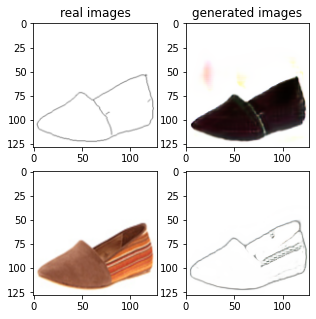

Train Epoch: 2 4% 	Total Loss: 1.359891 	Loss_G_AB: 0.320221	Loss_G_BA: 1.005892	Loss_cycle: 0.465683	Loss_D_A: 0.004705	Loss_D_B: 0.226446
1 52009 T:  1.9727983474731445
Train Epoch: 2 4% 	Total Loss: 1.410947 	Loss_G_AB: 0.313609	Loss_G_BA: 0.997981	Loss_cycle: 0.509546	Loss_D_A: 0.002061	Loss_D_B: 0.243545
1 52019 T:  1.1776111125946045
Train Epoch: 2 4% 	Total Loss: 1.343705 	Loss_G_AB: 0.284231	Loss_G_BA: 0.988909	Loss_cycle: 0.468008	Loss_D_A: 0.003790	Loss_D_B: 0.235337
1 52029 T:  1.173731803894043
Train Epoch: 2 4% 	Total Loss: 1.360159 	Loss_G_AB: 0.293238	Loss_G_BA: 0.994569	Loss_cycle: 0.471527	Loss_D_A: 0.005295	Loss_D_B: 0.239434
1 52039 T:  1.1849720478057861
Train Epoch: 2 4% 	Total Loss: 1.274286 	Loss_G_AB: 0.284956	Loss_G_BA: 0.998281	Loss_cycle: 0.365433	Loss_D_A: 0.004564	Loss_D_B: 0.262671
1 52049 T:  1.2211337089538574
Train Epoch: 2 4% 	Total Loss: 1.278775 	Loss_G_AB: 0.288450	Loss_G_BA: 1.009830	Loss_cycle: 0.364473	Loss_D_A: 0.002429	Loss_D_B: 0.262732
1 5205

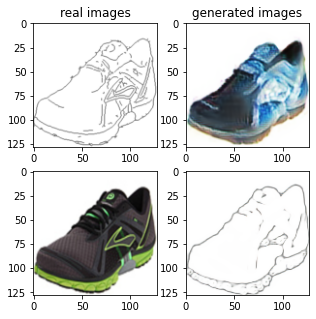

Train Epoch: 2 6% 	Total Loss: 1.330239 	Loss_G_AB: 0.313417	Loss_G_BA: 1.014693	Loss_cycle: 0.436403	Loss_D_A: 0.006740	Loss_D_B: 0.223041
1 53009 T:  1.9555256366729736
Train Epoch: 2 6% 	Total Loss: 1.271114 	Loss_G_AB: 0.306481	Loss_G_BA: 1.015706	Loss_cycle: 0.355319	Loss_D_A: 0.004992	Loss_D_B: 0.249709
1 53019 T:  1.1952075958251953
Train Epoch: 2 6% 	Total Loss: 1.363815 	Loss_G_AB: 0.296206	Loss_G_BA: 0.996689	Loss_cycle: 0.462165	Loss_D_A: 0.003941	Loss_D_B: 0.251262
1 53029 T:  1.1948332786560059
Train Epoch: 2 6% 	Total Loss: 1.350751 	Loss_G_AB: 0.297660	Loss_G_BA: 1.003972	Loss_cycle: 0.433649	Loss_D_A: 0.003363	Loss_D_B: 0.262923
1 53039 T:  1.1962306499481201
Train Epoch: 2 6% 	Total Loss: 1.268366 	Loss_G_AB: 0.304942	Loss_G_BA: 0.992118	Loss_cycle: 0.384587	Loss_D_A: 0.003813	Loss_D_B: 0.231436
1 53049 T:  1.2163169384002686
Train Epoch: 2 6% 	Total Loss: 1.340104 	Loss_G_AB: 0.293667	Loss_G_BA: 0.994270	Loss_cycle: 0.448144	Loss_D_A: 0.004344	Loss_D_B: 0.243648
1 530

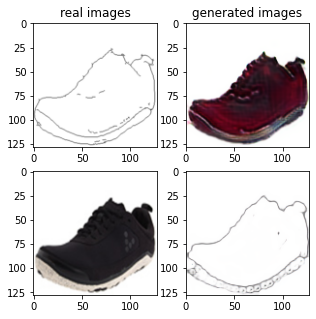

Train Epoch: 2 8% 	Total Loss: 1.286235 	Loss_G_AB: 0.290128	Loss_G_BA: 0.999789	Loss_cycle: 0.392154	Loss_D_A: 0.005529	Loss_D_B: 0.243593
1 54009 T:  1.9565579891204834
Train Epoch: 2 8% 	Total Loss: 1.338646 	Loss_G_AB: 0.281332	Loss_G_BA: 0.986702	Loss_cycle: 0.433050	Loss_D_A: 0.003933	Loss_D_B: 0.267645
1 54019 T:  1.1882898807525635
Train Epoch: 2 8% 	Total Loss: 1.367626 	Loss_G_AB: 0.279785	Loss_G_BA: 0.989829	Loss_cycle: 0.468287	Loss_D_A: 0.003826	Loss_D_B: 0.260707
1 54029 T:  1.1823859214782715
Train Epoch: 2 8% 	Total Loss: 1.395921 	Loss_G_AB: 0.305277	Loss_G_BA: 1.003312	Loss_cycle: 0.513497	Loss_D_A: 0.002652	Loss_D_B: 0.225478
1 54039 T:  1.1782822608947754
Train Epoch: 2 8% 	Total Loss: 1.205255 	Loss_G_AB: 0.310757	Loss_G_BA: 0.983665	Loss_cycle: 0.312721	Loss_D_A: 0.002613	Loss_D_B: 0.242709
1 54049 T:  1.2466862201690674
Train Epoch: 2 8% 	Total Loss: 1.243539 	Loss_G_AB: 0.324663	Loss_G_BA: 1.017481	Loss_cycle: 0.345229	Loss_D_A: 0.003353	Loss_D_B: 0.223885
1 540

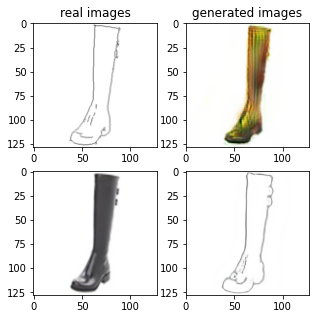

Train Epoch: 2 10% 	Total Loss: 1.322259 	Loss_G_AB: 0.283314	Loss_G_BA: 0.991642	Loss_cycle: 0.431706	Loss_D_A: 0.002094	Loss_D_B: 0.250981
1 55009 T:  1.9629170894622803
Train Epoch: 2 10% 	Total Loss: 1.193618 	Loss_G_AB: 0.279221	Loss_G_BA: 1.003650	Loss_cycle: 0.306660	Loss_D_A: 0.001410	Loss_D_B: 0.244112
1 55019 T:  1.1733427047729492
Train Epoch: 2 10% 	Total Loss: 1.242875 	Loss_G_AB: 0.272834	Loss_G_BA: 0.988090	Loss_cycle: 0.354294	Loss_D_A: 0.003638	Loss_D_B: 0.254481
1 55029 T:  1.1851520538330078
Train Epoch: 2 10% 	Total Loss: 1.287309 	Loss_G_AB: 0.321287	Loss_G_BA: 0.990718	Loss_cycle: 0.383225	Loss_D_A: 0.004736	Loss_D_B: 0.243345
1 55039 T:  1.170771837234497
Train Epoch: 2 10% 	Total Loss: 1.312183 	Loss_G_AB: 0.280572	Loss_G_BA: 1.012791	Loss_cycle: 0.419039	Loss_D_A: 0.003019	Loss_D_B: 0.243443
1 55049 T:  1.187248706817627
Train Epoch: 2 11% 	Total Loss: 1.446218 	Loss_G_AB: 0.302154	Loss_G_BA: 1.000998	Loss_cycle: 0.547633	Loss_D_A: 0.001865	Loss_D_B: 0.245144
1

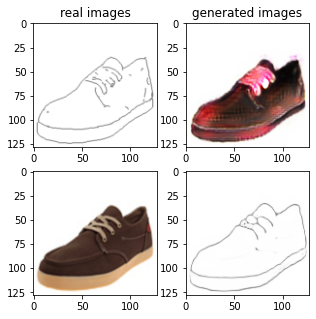

Train Epoch: 2 12% 	Total Loss: 1.449588 	Loss_G_AB: 0.302085	Loss_G_BA: 0.768473	Loss_cycle: 0.430245	Loss_D_A: 0.243656	Loss_D_B: 0.240408
1 56009 T:  1.9473652839660645
Train Epoch: 2 12% 	Total Loss: 1.357422 	Loss_G_AB: 0.309035	Loss_G_BA: 0.636308	Loss_cycle: 0.412967	Loss_D_A: 0.196995	Loss_D_B: 0.274789
1 56019 T:  1.1794238090515137
Train Epoch: 2 12% 	Total Loss: 1.295536 	Loss_G_AB: 0.281451	Loss_G_BA: 0.819177	Loss_cycle: 0.412831	Loss_D_A: 0.078020	Loss_D_B: 0.254372
1 56029 T:  1.172821044921875
Train Epoch: 2 12% 	Total Loss: 1.333536 	Loss_G_AB: 0.283818	Loss_G_BA: 0.806022	Loss_cycle: 0.367903	Loss_D_A: 0.159294	Loss_D_B: 0.261419
1 56039 T:  1.174361228942871
Train Epoch: 2 12% 	Total Loss: 1.372429 	Loss_G_AB: 0.311166	Loss_G_BA: 0.875793	Loss_cycle: 0.413179	Loss_D_A: 0.110178	Loss_D_B: 0.255592
1 56049 T:  1.1771039962768555
Train Epoch: 2 13% 	Total Loss: 1.392556 	Loss_G_AB: 0.258012	Loss_G_BA: 0.928730	Loss_cycle: 0.493755	Loss_D_A: 0.039344	Loss_D_B: 0.266086
1

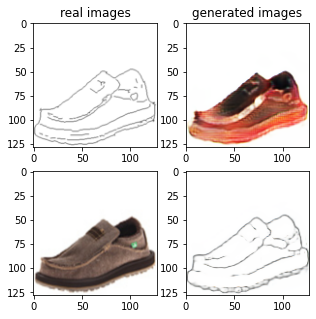

Train Epoch: 2 14% 	Total Loss: 1.261158 	Loss_G_AB: 0.274343	Loss_G_BA: 1.002124	Loss_cycle: 0.339954	Loss_D_A: 0.003234	Loss_D_B: 0.279736
1 57009 T:  1.9052777290344238
Train Epoch: 2 14% 	Total Loss: 1.372434 	Loss_G_AB: 0.282519	Loss_G_BA: 0.991107	Loss_cycle: 0.462668	Loss_D_A: 0.002104	Loss_D_B: 0.270849
1 57019 T:  1.1812961101531982
Train Epoch: 2 14% 	Total Loss: 1.233859 	Loss_G_AB: 0.316807	Loss_G_BA: 0.997912	Loss_cycle: 0.329348	Loss_D_A: 0.008328	Loss_D_B: 0.238824
1 57029 T:  1.1758861541748047
Train Epoch: 2 14% 	Total Loss: 1.256705 	Loss_G_AB: 0.303080	Loss_G_BA: 0.965503	Loss_cycle: 0.385138	Loss_D_A: 0.003803	Loss_D_B: 0.233472
1 57039 T:  1.1826999187469482
Train Epoch: 2 14% 	Total Loss: 1.372952 	Loss_G_AB: 0.349410	Loss_G_BA: 1.025490	Loss_cycle: 0.439800	Loss_D_A: 0.002566	Loss_D_B: 0.243136
1 57049 T:  1.1964106559753418
Train Epoch: 2 15% 	Total Loss: 1.279331 	Loss_G_AB: 0.316051	Loss_G_BA: 0.989310	Loss_cycle: 0.364602	Loss_D_A: 0.002738	Loss_D_B: 0.259311

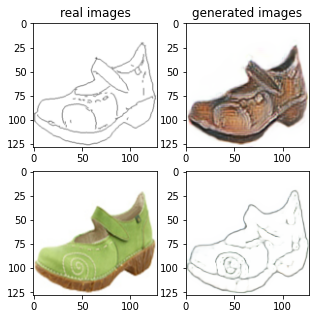

Train Epoch: 2 16% 	Total Loss: 1.329296 	Loss_G_AB: 0.300413	Loss_G_BA: 0.999035	Loss_cycle: 0.417679	Loss_D_A: 0.002681	Loss_D_B: 0.259213
1 58009 T:  1.9101603031158447
Train Epoch: 2 16% 	Total Loss: 1.310794 	Loss_G_AB: 0.319695	Loss_G_BA: 0.996712	Loss_cycle: 0.392081	Loss_D_A: 0.001407	Loss_D_B: 0.259103
1 58019 T:  1.1737828254699707
Train Epoch: 2 16% 	Total Loss: 1.192891 	Loss_G_AB: 0.267305	Loss_G_BA: 0.994727	Loss_cycle: 0.283861	Loss_D_A: 0.001682	Loss_D_B: 0.276332
1 58029 T:  1.171550989151001
Train Epoch: 2 16% 	Total Loss: 1.251722 	Loss_G_AB: 0.279046	Loss_G_BA: 1.004647	Loss_cycle: 0.365290	Loss_D_A: 0.001408	Loss_D_B: 0.243177
1 58039 T:  1.1758697032928467
Train Epoch: 2 17% 	Total Loss: 1.308977 	Loss_G_AB: 0.283228	Loss_G_BA: 0.989104	Loss_cycle: 0.423440	Loss_D_A: 0.001577	Loss_D_B: 0.247793
1 58049 T:  1.1779446601867676
Train Epoch: 2 17% 	Total Loss: 1.224879 	Loss_G_AB: 0.291150	Loss_G_BA: 1.005796	Loss_cycle: 0.331599	Loss_D_A: 0.002640	Loss_D_B: 0.242168


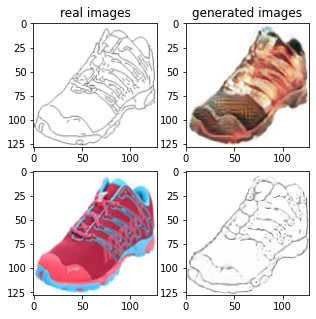

Train Epoch: 2 18% 	Total Loss: 1.353465 	Loss_G_AB: 0.306863	Loss_G_BA: 1.016786	Loss_cycle: 0.463480	Loss_D_A: 0.004130	Loss_D_B: 0.224031
1 59009 T:  1.9086637496948242
Train Epoch: 2 18% 	Total Loss: 1.226640 	Loss_G_AB: 0.294723	Loss_G_BA: 0.998249	Loss_cycle: 0.336570	Loss_D_A: 0.002415	Loss_D_B: 0.241169
1 59019 T:  1.1806814670562744
Train Epoch: 2 18% 	Total Loss: 1.326501 	Loss_G_AB: 0.300203	Loss_G_BA: 1.001328	Loss_cycle: 0.440973	Loss_D_A: 0.003973	Loss_D_B: 0.230790
1 59029 T:  1.1692261695861816
Train Epoch: 2 18% 	Total Loss: 1.292879 	Loss_G_AB: 0.274060	Loss_G_BA: 0.990300	Loss_cycle: 0.394572	Loss_D_A: 0.007382	Loss_D_B: 0.258745
1 59039 T:  1.1738955974578857
Train Epoch: 2 19% 	Total Loss: 1.357536 	Loss_G_AB: 0.320086	Loss_G_BA: 1.017511	Loss_cycle: 0.444688	Loss_D_A: 0.003218	Loss_D_B: 0.240831
1 59049 T:  1.1783084869384766
Train Epoch: 2 19% 	Total Loss: 1.332238 	Loss_G_AB: 0.319825	Loss_G_BA: 0.997166	Loss_cycle: 0.394350	Loss_D_A: 0.002881	Loss_D_B: 0.276513

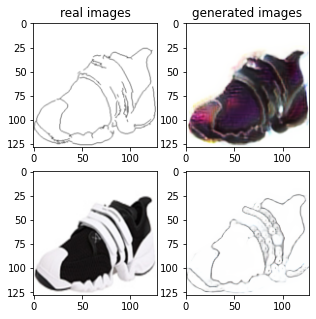

Train Epoch: 2 20% 	Total Loss: 1.291865 	Loss_G_AB: 0.335418	Loss_G_BA: 1.007099	Loss_cycle: 0.395291	Loss_D_A: 0.001692	Loss_D_B: 0.223624
1 60009 T:  2.0956289768218994
Train Epoch: 2 20% 	Total Loss: 1.176225 	Loss_G_AB: 0.295348	Loss_G_BA: 0.993563	Loss_cycle: 0.301081	Loss_D_A: 0.001515	Loss_D_B: 0.229173
1 60019 T:  1.1826205253601074
Train Epoch: 2 20% 	Total Loss: 1.320875 	Loss_G_AB: 0.300121	Loss_G_BA: 0.999889	Loss_cycle: 0.436379	Loss_D_A: 0.001994	Loss_D_B: 0.232497
1 60029 T:  1.1795597076416016
Train Epoch: 2 20% 	Total Loss: 1.314847 	Loss_G_AB: 0.260485	Loss_G_BA: 0.997107	Loss_cycle: 0.410586	Loss_D_A: 0.002431	Loss_D_B: 0.273034
1 60039 T:  1.186410665512085
Train Epoch: 2 21% 	Total Loss: 1.249323 	Loss_G_AB: 0.324322	Loss_G_BA: 1.006615	Loss_cycle: 0.319498	Loss_D_A: 0.002788	Loss_D_B: 0.261569
1 60049 T:  1.180598258972168
Train Epoch: 2 21% 	Total Loss: 1.293165 	Loss_G_AB: 0.313408	Loss_G_BA: 0.996798	Loss_cycle: 0.393579	Loss_D_A: 0.001757	Loss_D_B: 0.242726
1

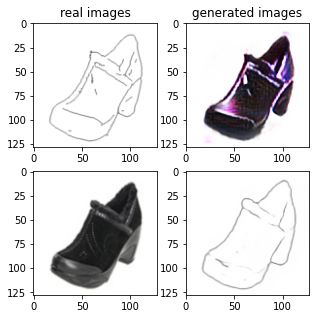

Train Epoch: 2 22% 	Total Loss: 1.327369 	Loss_G_AB: 0.324928	Loss_G_BA: 1.010573	Loss_cycle: 0.404620	Loss_D_A: 0.010348	Loss_D_B: 0.244650
1 61009 T:  1.9382221698760986
Train Epoch: 2 22% 	Total Loss: 1.215815 	Loss_G_AB: 0.299112	Loss_G_BA: 1.015144	Loss_cycle: 0.333585	Loss_D_A: 0.003079	Loss_D_B: 0.222022
1 61019 T:  1.182117223739624
Train Epoch: 2 22% 	Total Loss: 1.254970 	Loss_G_AB: 0.280419	Loss_G_BA: 0.990246	Loss_cycle: 0.356219	Loss_D_A: 0.006942	Loss_D_B: 0.256476
1 61029 T:  1.1806519031524658
Train Epoch: 2 23% 	Total Loss: 1.312531 	Loss_G_AB: 0.300864	Loss_G_BA: 1.001476	Loss_cycle: 0.405166	Loss_D_A: 0.002996	Loss_D_B: 0.253199
1 61039 T:  1.187781810760498
Train Epoch: 2 23% 	Total Loss: 1.209682 	Loss_G_AB: 0.313111	Loss_G_BA: 1.004146	Loss_cycle: 0.311595	Loss_D_A: 0.006223	Loss_D_B: 0.233235
1 61049 T:  1.1830003261566162
Train Epoch: 2 23% 	Total Loss: 1.260632 	Loss_G_AB: 0.292843	Loss_G_BA: 1.002585	Loss_cycle: 0.366482	Loss_D_A: 0.005076	Loss_D_B: 0.241360
1

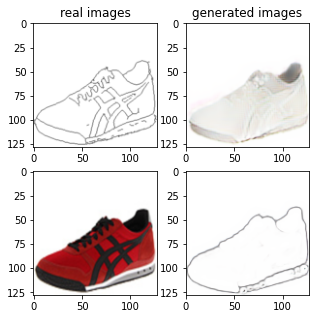

Train Epoch: 2 24% 	Total Loss: 1.345116 	Loss_G_AB: 0.280196	Loss_G_BA: 0.994456	Loss_cycle: 0.458838	Loss_D_A: 0.003512	Loss_D_B: 0.245441
1 62009 T:  1.9842560291290283
Train Epoch: 2 24% 	Total Loss: 1.189562 	Loss_G_AB: 0.271921	Loss_G_BA: 0.987223	Loss_cycle: 0.309225	Loss_D_A: 0.002719	Loss_D_B: 0.248047
1 62019 T:  1.1798925399780273
Train Epoch: 2 24% 	Total Loss: 1.266104 	Loss_G_AB: 0.301510	Loss_G_BA: 0.996344	Loss_cycle: 0.387626	Loss_D_A: 0.002209	Loss_D_B: 0.227342
1 62029 T:  1.1827855110168457
Train Epoch: 2 25% 	Total Loss: 1.284726 	Loss_G_AB: 0.297593	Loss_G_BA: 0.988283	Loss_cycle: 0.399723	Loss_D_A: 0.003861	Loss_D_B: 0.238203
1 62039 T:  1.1861519813537598
Train Epoch: 2 25% 	Total Loss: 1.213612 	Loss_G_AB: 0.308947	Loss_G_BA: 1.007047	Loss_cycle: 0.332781	Loss_D_A: 0.002509	Loss_D_B: 0.220324
1 62049 T:  1.1822748184204102
Train Epoch: 2 25% 	Total Loss: 1.225674 	Loss_G_AB: 0.307926	Loss_G_BA: 0.993012	Loss_cycle: 0.301162	Loss_D_A: 0.007300	Loss_D_B: 0.266743

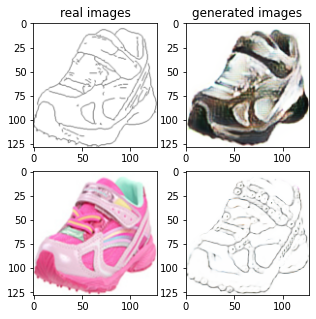

Train Epoch: 2 26% 	Total Loss: 1.326587 	Loss_G_AB: 0.309325	Loss_G_BA: 0.875469	Loss_cycle: 0.425337	Loss_D_A: 0.074249	Loss_D_B: 0.234603
1 63009 T:  1.9208714962005615
Train Epoch: 2 26% 	Total Loss: 1.156321 	Loss_G_AB: 0.339981	Loss_G_BA: 0.783715	Loss_cycle: 0.294054	Loss_D_A: 0.095336	Loss_D_B: 0.205083
1 63019 T:  1.1890792846679688
Train Epoch: 2 27% 	Total Loss: 1.413479 	Loss_G_AB: 0.301279	Loss_G_BA: 1.029792	Loss_cycle: 0.478205	Loss_D_A: 0.011017	Loss_D_B: 0.258722
1 63029 T:  1.1809847354888916
Train Epoch: 2 27% 	Total Loss: 1.325214 	Loss_G_AB: 0.359989	Loss_G_BA: 0.974653	Loss_cycle: 0.410815	Loss_D_A: 0.014245	Loss_D_B: 0.232834
1 63039 T:  1.18906831741333
Train Epoch: 2 27% 	Total Loss: 1.286168 	Loss_G_AB: 0.337037	Loss_G_BA: 0.993851	Loss_cycle: 0.375515	Loss_D_A: 0.015824	Loss_D_B: 0.229385
1 63049 T:  1.1785318851470947
Train Epoch: 2 27% 	Total Loss: 1.301937 	Loss_G_AB: 0.316560	Loss_G_BA: 0.955226	Loss_cycle: 0.390624	Loss_D_A: 0.016983	Loss_D_B: 0.258437
1

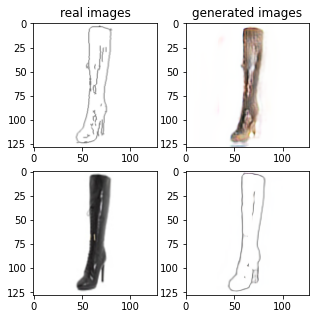

Train Epoch: 2 28% 	Total Loss: 1.248580 	Loss_G_AB: 0.298664	Loss_G_BA: 0.994088	Loss_cycle: 0.340558	Loss_D_A: 0.002787	Loss_D_B: 0.258859
1 64009 T:  1.9209227561950684
Train Epoch: 2 28% 	Total Loss: 1.293933 	Loss_G_AB: 0.334909	Loss_G_BA: 0.988084	Loss_cycle: 0.410353	Loss_D_A: 0.006247	Loss_D_B: 0.215836
1 64019 T:  1.183265209197998
Train Epoch: 2 29% 	Total Loss: 1.266125 	Loss_G_AB: 0.267513	Loss_G_BA: 1.032670	Loss_cycle: 0.360931	Loss_D_A: 0.004184	Loss_D_B: 0.250919
1 64029 T:  1.1741838455200195
Train Epoch: 2 29% 	Total Loss: 1.263015 	Loss_G_AB: 0.345931	Loss_G_BA: 0.964466	Loss_cycle: 0.333772	Loss_D_A: 0.013292	Loss_D_B: 0.260753
1 64039 T:  1.1884424686431885
Train Epoch: 2 29% 	Total Loss: 1.307374 	Loss_G_AB: 0.302911	Loss_G_BA: 1.008753	Loss_cycle: 0.417329	Loss_D_A: 0.009227	Loss_D_B: 0.224986
1 64049 T:  1.1902682781219482
Train Epoch: 2 29% 	Total Loss: 1.304608 	Loss_G_AB: 0.310931	Loss_G_BA: 0.980207	Loss_cycle: 0.404280	Loss_D_A: 0.002556	Loss_D_B: 0.252203


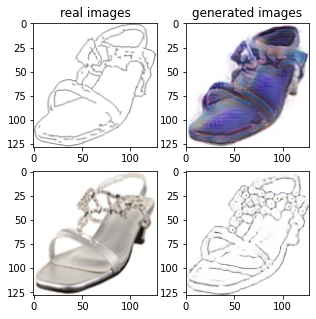

Train Epoch: 2 30% 	Total Loss: 1.301451 	Loss_G_AB: 0.301898	Loss_G_BA: 0.998718	Loss_cycle: 0.383030	Loss_D_A: 0.005303	Loss_D_B: 0.262811
1 65009 T:  1.955493450164795
Train Epoch: 2 30% 	Total Loss: 1.195743 	Loss_G_AB: 0.298814	Loss_G_BA: 1.006013	Loss_cycle: 0.312823	Loss_D_A: 0.006320	Loss_D_B: 0.224187
1 65019 T:  1.1726996898651123
Train Epoch: 2 31% 	Total Loss: 1.237482 	Loss_G_AB: 0.425547	Loss_G_BA: 0.970111	Loss_cycle: 0.320904	Loss_D_A: 0.020078	Loss_D_B: 0.198671
1 65029 T:  1.1684763431549072
Train Epoch: 2 31% 	Total Loss: 1.218560 	Loss_G_AB: 0.287460	Loss_G_BA: 0.986482	Loss_cycle: 0.315981	Loss_D_A: 0.006556	Loss_D_B: 0.259052
1 65039 T:  1.1871910095214844
Train Epoch: 2 31% 	Total Loss: 1.203354 	Loss_G_AB: 0.281002	Loss_G_BA: 0.905546	Loss_cycle: 0.305537	Loss_D_A: 0.039882	Loss_D_B: 0.264661
1 65049 T:  1.1783866882324219
Train Epoch: 2 31% 	Total Loss: 1.227998 	Loss_G_AB: 0.284013	Loss_G_BA: 1.018540	Loss_cycle: 0.314104	Loss_D_A: 0.005908	Loss_D_B: 0.256709


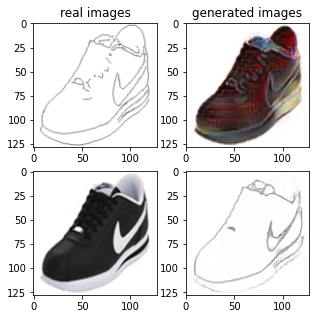

Train Epoch: 2 32% 	Total Loss: 1.264717 	Loss_G_AB: 0.343149	Loss_G_BA: 0.982582	Loss_cycle: 0.337162	Loss_D_A: 0.004426	Loss_D_B: 0.260264
1 66009 T:  2.000807762145996
Train Epoch: 2 33% 	Total Loss: 1.444386 	Loss_G_AB: 0.334246	Loss_G_BA: 0.990664	Loss_cycle: 0.512532	Loss_D_A: 0.005298	Loss_D_B: 0.264101
1 66019 T:  1.1800956726074219
Train Epoch: 2 33% 	Total Loss: 1.277381 	Loss_G_AB: 0.303925	Loss_G_BA: 1.010099	Loss_cycle: 0.347659	Loss_D_A: 0.005288	Loss_D_B: 0.267422
1 66029 T:  1.1733083724975586
Train Epoch: 2 33% 	Total Loss: 1.268303 	Loss_G_AB: 0.307920	Loss_G_BA: 0.990449	Loss_cycle: 0.382919	Loss_D_A: 0.004920	Loss_D_B: 0.231280
1 66039 T:  1.178844690322876
Train Epoch: 2 33% 	Total Loss: 1.223010 	Loss_G_AB: 0.295321	Loss_G_BA: 0.998593	Loss_cycle: 0.329010	Loss_D_A: 0.003687	Loss_D_B: 0.243356
1 66049 T:  1.1711046695709229
Train Epoch: 2 33% 	Total Loss: 1.292440 	Loss_G_AB: 0.282280	Loss_G_BA: 1.004529	Loss_cycle: 0.412101	Loss_D_A: 0.002975	Loss_D_B: 0.233960
1

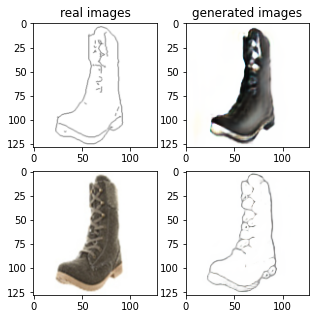

Train Epoch: 2 34% 	Total Loss: 1.207550 	Loss_G_AB: 0.291604	Loss_G_BA: 1.033419	Loss_cycle: 0.274689	Loss_D_A: 0.008644	Loss_D_B: 0.261706
1 67009 T:  1.8977553844451904
Train Epoch: 2 35% 	Total Loss: 1.268163 	Loss_G_AB: 0.292497	Loss_G_BA: 1.013330	Loss_cycle: 0.361238	Loss_D_A: 0.005274	Loss_D_B: 0.248737
1 67019 T:  1.171647548675537
Train Epoch: 2 35% 	Total Loss: 1.279389 	Loss_G_AB: 0.276622	Loss_G_BA: 0.995662	Loss_cycle: 0.378833	Loss_D_A: 0.001756	Loss_D_B: 0.262658
1 67029 T:  1.178480863571167
Train Epoch: 2 35% 	Total Loss: 1.258837 	Loss_G_AB: 0.278570	Loss_G_BA: 0.997669	Loss_cycle: 0.365019	Loss_D_A: 0.005423	Loss_D_B: 0.250275
1 67039 T:  1.1707656383514404
Train Epoch: 2 35% 	Total Loss: 1.276835 	Loss_G_AB: 0.332546	Loss_G_BA: 1.002030	Loss_cycle: 0.389814	Loss_D_A: 0.001938	Loss_D_B: 0.217795
1 67049 T:  1.1841495037078857
Train Epoch: 2 35% 	Total Loss: 1.245646 	Loss_G_AB: 0.325129	Loss_G_BA: 0.987234	Loss_cycle: 0.356711	Loss_D_A: 0.002784	Loss_D_B: 0.229969
1

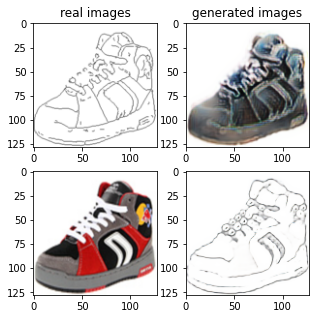

Train Epoch: 2 36% 	Total Loss: 1.306202 	Loss_G_AB: 0.275334	Loss_G_BA: 0.997061	Loss_cycle: 0.395609	Loss_D_A: 0.010763	Loss_D_B: 0.263633
1 68009 T:  1.9853489398956299
Train Epoch: 2 37% 	Total Loss: 1.366579 	Loss_G_AB: 0.319695	Loss_G_BA: 0.977541	Loss_cycle: 0.488381	Loss_D_A: 0.020370	Loss_D_B: 0.209210
1 68019 T:  1.1811518669128418
Train Epoch: 2 37% 	Total Loss: 1.277159 	Loss_G_AB: 0.313833	Loss_G_BA: 0.998014	Loss_cycle: 0.404247	Loss_D_A: 0.001971	Loss_D_B: 0.215018
1 68029 T:  1.178093671798706
Train Epoch: 2 37% 	Total Loss: 1.216248 	Loss_G_AB: 0.317149	Loss_G_BA: 1.000641	Loss_cycle: 0.312707	Loss_D_A: 0.002109	Loss_D_B: 0.242537
1 68039 T:  1.1850385665893555
Train Epoch: 2 37% 	Total Loss: 1.291521 	Loss_G_AB: 0.323636	Loss_G_BA: 0.990256	Loss_cycle: 0.408650	Loss_D_A: 0.002397	Loss_D_B: 0.223527
1 68049 T:  1.1785399913787842
Train Epoch: 2 37% 	Total Loss: 1.319276 	Loss_G_AB: 0.305251	Loss_G_BA: 0.982562	Loss_cycle: 0.420100	Loss_D_A: 0.002601	Loss_D_B: 0.252668


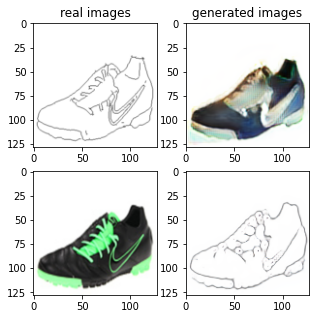

Train Epoch: 2 39% 	Total Loss: 1.267939 	Loss_G_AB: 0.281273	Loss_G_BA: 0.891622	Loss_cycle: 0.385231	Loss_D_A: 0.025462	Loss_D_B: 0.270799
1 69009 T:  1.953547477722168
Train Epoch: 2 39% 	Total Loss: 1.273241 	Loss_G_AB: 0.285235	Loss_G_BA: 0.905061	Loss_cycle: 0.295114	Loss_D_A: 0.132664	Loss_D_B: 0.250315
1 69019 T:  1.1843695640563965
Train Epoch: 2 39% 	Total Loss: 1.301937 	Loss_G_AB: 0.288454	Loss_G_BA: 0.934795	Loss_cycle: 0.400181	Loss_D_A: 0.047148	Loss_D_B: 0.242984
1 69029 T:  1.1743683815002441
Train Epoch: 2 39% 	Total Loss: 1.253970 	Loss_G_AB: 0.267705	Loss_G_BA: 0.977808	Loss_cycle: 0.350045	Loss_D_A: 0.020292	Loss_D_B: 0.260877
1 69039 T:  1.1778476238250732
Train Epoch: 2 39% 	Total Loss: 1.301854 	Loss_G_AB: 0.266397	Loss_G_BA: 1.006767	Loss_cycle: 0.404311	Loss_D_A: 0.003700	Loss_D_B: 0.257261
1 69049 T:  1.1748998165130615
Train Epoch: 2 39% 	Total Loss: 1.260034 	Loss_G_AB: 0.314244	Loss_G_BA: 0.974795	Loss_cycle: 0.384379	Loss_D_A: 0.007300	Loss_D_B: 0.223835


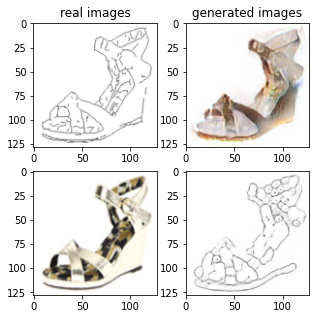

Train Epoch: 2 41% 	Total Loss: 1.229719 	Loss_G_AB: 0.287111	Loss_G_BA: 1.004496	Loss_cycle: 0.340907	Loss_D_A: 0.001920	Loss_D_B: 0.241088
1 70009 T:  1.9532756805419922
Train Epoch: 2 41% 	Total Loss: 1.217071 	Loss_G_AB: 0.326836	Loss_G_BA: 1.007997	Loss_cycle: 0.347021	Loss_D_A: 0.001291	Loss_D_B: 0.201342
1 70019 T:  1.1809115409851074
Train Epoch: 2 41% 	Total Loss: 1.418452 	Loss_G_AB: 0.400116	Loss_G_BA: 0.995569	Loss_cycle: 0.480815	Loss_D_A: 0.001378	Loss_D_B: 0.238416
1 70029 T:  1.1921851634979248
Train Epoch: 2 41% 	Total Loss: 1.262422 	Loss_G_AB: 0.241078	Loss_G_BA: 1.001178	Loss_cycle: 0.346220	Loss_D_A: 0.001812	Loss_D_B: 0.293261
1 70039 T:  1.184861183166504
Train Epoch: 2 41% 	Total Loss: 1.300100 	Loss_G_AB: 0.290262	Loss_G_BA: 1.002792	Loss_cycle: 0.395420	Loss_D_A: 0.001562	Loss_D_B: 0.256590
1 70049 T:  1.1946592330932617
Train Epoch: 2 41% 	Total Loss: 1.254460 	Loss_G_AB: 0.270330	Loss_G_BA: 0.993742	Loss_cycle: 0.356409	Loss_D_A: 0.001399	Loss_D_B: 0.264616


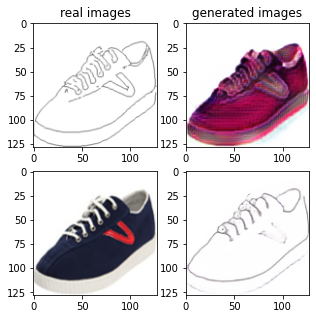

Train Epoch: 2 43% 	Total Loss: 1.232189 	Loss_G_AB: 0.373811	Loss_G_BA: 0.999433	Loss_cycle: 0.310295	Loss_D_A: 0.003622	Loss_D_B: 0.231650
1 71009 T:  2.0173087120056152
Train Epoch: 2 43% 	Total Loss: 1.391195 	Loss_G_AB: 0.344134	Loss_G_BA: 0.999732	Loss_cycle: 0.459961	Loss_D_A: 0.002263	Loss_D_B: 0.257038
1 71019 T:  1.1811959743499756
Train Epoch: 2 43% 	Total Loss: 1.221796 	Loss_G_AB: 0.292906	Loss_G_BA: 1.003393	Loss_cycle: 0.329447	Loss_D_A: 0.003018	Loss_D_B: 0.241181
1 71029 T:  1.1802656650543213
Train Epoch: 2 43% 	Total Loss: 1.325659 	Loss_G_AB: 0.304144	Loss_G_BA: 1.001332	Loss_cycle: 0.415342	Loss_D_A: 0.002860	Loss_D_B: 0.254719
1 71039 T:  1.181546688079834
Train Epoch: 2 43% 	Total Loss: 1.286049 	Loss_G_AB: 0.286808	Loss_G_BA: 0.994373	Loss_cycle: 0.394290	Loss_D_A: 0.002687	Loss_D_B: 0.248482
1 71049 T:  1.1778771877288818
Train Epoch: 2 43% 	Total Loss: 1.185792 	Loss_G_AB: 0.277995	Loss_G_BA: 1.004668	Loss_cycle: 0.293240	Loss_D_A: 0.004161	Loss_D_B: 0.247059


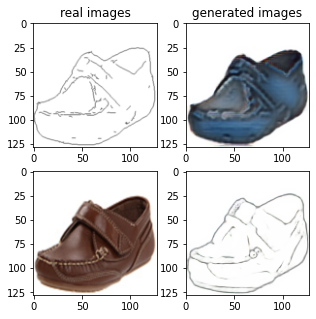

Train Epoch: 2 45% 	Total Loss: 1.189978 	Loss_G_AB: 0.298578	Loss_G_BA: 0.865489	Loss_cycle: 0.305891	Loss_D_A: 0.071499	Loss_D_B: 0.230554
1 72009 T:  1.9860930442810059
Train Epoch: 2 45% 	Total Loss: 1.364875 	Loss_G_AB: 0.261435	Loss_G_BA: 0.885831	Loss_cycle: 0.431840	Loss_D_A: 0.076706	Loss_D_B: 0.282695
1 72019 T:  1.180539608001709
Train Epoch: 2 45% 	Total Loss: 1.312265 	Loss_G_AB: 0.268462	Loss_G_BA: 1.030614	Loss_cycle: 0.359572	Loss_D_A: 0.008729	Loss_D_B: 0.294427
1 72029 T:  1.1720693111419678
Train Epoch: 2 45% 	Total Loss: 1.296702 	Loss_G_AB: 0.293316	Loss_G_BA: 0.977084	Loss_cycle: 0.402804	Loss_D_A: 0.004223	Loss_D_B: 0.254475
1 72039 T:  1.1794238090515137
Train Epoch: 2 45% 	Total Loss: 1.212640 	Loss_G_AB: 0.290010	Loss_G_BA: 1.024143	Loss_cycle: 0.318749	Loss_D_A: 0.003426	Loss_D_B: 0.233388
1 72049 T:  1.176851511001587
Train Epoch: 2 45% 	Total Loss: 1.373829 	Loss_G_AB: 0.300341	Loss_G_BA: 0.991925	Loss_cycle: 0.468387	Loss_D_A: 0.007892	Loss_D_B: 0.251418
1

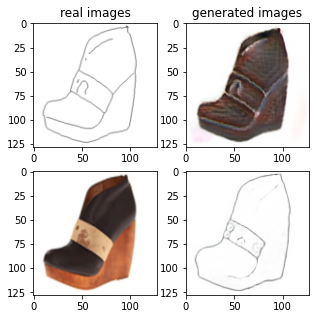

Train Epoch: 2 47% 	Total Loss: 1.236700 	Loss_G_AB: 0.271541	Loss_G_BA: 1.015559	Loss_cycle: 0.306274	Loss_D_A: 0.004412	Loss_D_B: 0.282464
1 73009 T:  1.8878567218780518
Train Epoch: 2 47% 	Total Loss: 1.196084 	Loss_G_AB: 0.286223	Loss_G_BA: 0.986812	Loss_cycle: 0.310923	Loss_D_A: 0.006128	Loss_D_B: 0.242516
1 73019 T:  1.177973747253418
Train Epoch: 2 47% 	Total Loss: 1.289003 	Loss_G_AB: 0.323513	Loss_G_BA: 0.974328	Loss_cycle: 0.380300	Loss_D_A: 0.013246	Loss_D_B: 0.246536
1 73029 T:  1.1857764720916748
Train Epoch: 2 47% 	Total Loss: 1.313446 	Loss_G_AB: 0.302303	Loss_G_BA: 1.007832	Loss_cycle: 0.424403	Loss_D_A: 0.002921	Loss_D_B: 0.231054
1 73039 T:  1.1827073097229004
Train Epoch: 2 47% 	Total Loss: 1.277491 	Loss_G_AB: 0.333207	Loss_G_BA: 0.965897	Loss_cycle: 0.390247	Loss_D_A: 0.014283	Loss_D_B: 0.223410
1 73049 T:  1.1848671436309814
Train Epoch: 2 47% 	Total Loss: 1.253613 	Loss_G_AB: 0.275157	Loss_G_BA: 0.999164	Loss_cycle: 0.333433	Loss_D_A: 0.008420	Loss_D_B: 0.274599


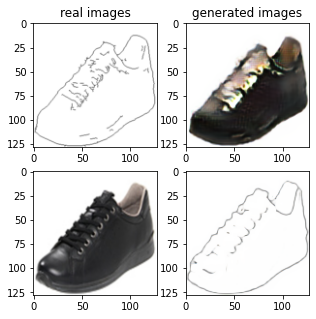

Train Epoch: 2 49% 	Total Loss: 1.187863 	Loss_G_AB: 0.257073	Loss_G_BA: 0.979595	Loss_cycle: 0.290051	Loss_D_A: 0.013062	Loss_D_B: 0.266416
1 74009 T:  1.9609131813049316
Train Epoch: 2 49% 	Total Loss: 1.349016 	Loss_G_AB: 0.342836	Loss_G_BA: 1.004049	Loss_cycle: 0.419201	Loss_D_A: 0.005810	Loss_D_B: 0.250563
1 74019 T:  1.18385648727417
Train Epoch: 2 49% 	Total Loss: 1.342780 	Loss_G_AB: 0.265201	Loss_G_BA: 1.011276	Loss_cycle: 0.390339	Loss_D_A: 0.003300	Loss_D_B: 0.310902
1 74029 T:  1.1791977882385254
Train Epoch: 2 49% 	Total Loss: 1.274121 	Loss_G_AB: 0.354821	Loss_G_BA: 0.992133	Loss_cycle: 0.385661	Loss_D_A: 0.002216	Loss_D_B: 0.212767
1 74039 T:  1.2130787372589111
Train Epoch: 2 49% 	Total Loss: 1.269903 	Loss_G_AB: 0.312811	Loss_G_BA: 0.997381	Loss_cycle: 0.391742	Loss_D_A: 0.001954	Loss_D_B: 0.221111
1 74049 T:  1.2111475467681885
Train Epoch: 2 49% 	Total Loss: 1.284088 	Loss_G_AB: 0.313287	Loss_G_BA: 0.976293	Loss_cycle: 0.371745	Loss_D_A: 0.003392	Loss_D_B: 0.264161
1

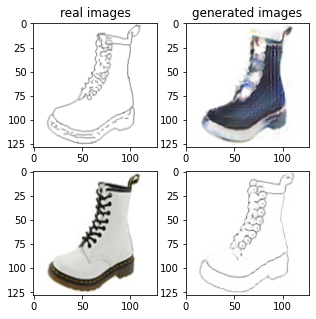

Train Epoch: 2 51% 	Total Loss: 1.205262 	Loss_G_AB: 0.281501	Loss_G_BA: 0.999709	Loss_cycle: 0.314259	Loss_D_A: 0.009611	Loss_D_B: 0.240787
1 75009 T:  1.9388437271118164
Train Epoch: 2 51% 	Total Loss: 1.243852 	Loss_G_AB: 0.302026	Loss_G_BA: 0.986160	Loss_cycle: 0.348882	Loss_D_A: 0.005958	Loss_D_B: 0.244919
1 75019 T:  1.1767277717590332
Train Epoch: 2 51% 	Total Loss: 1.254939 	Loss_G_AB: 0.312931	Loss_G_BA: 1.002729	Loss_cycle: 0.364884	Loss_D_A: 0.002585	Loss_D_B: 0.229640
1 75029 T:  1.1798133850097656
Train Epoch: 2 51% 	Total Loss: 1.291512 	Loss_G_AB: 0.270572	Loss_G_BA: 0.994501	Loss_cycle: 0.379095	Loss_D_A: 0.001525	Loss_D_B: 0.278355
1 75039 T:  1.1841988563537598
Train Epoch: 2 51% 	Total Loss: 1.351523 	Loss_G_AB: 0.328954	Loss_G_BA: 0.979571	Loss_cycle: 0.371606	Loss_D_A: 0.094797	Loss_D_B: 0.230857
1 75049 T:  1.182196855545044
Train Epoch: 2 51% 	Total Loss: 1.240001 	Loss_G_AB: 0.281070	Loss_G_BA: 0.980439	Loss_cycle: 0.337512	Loss_D_A: 0.005801	Loss_D_B: 0.265933


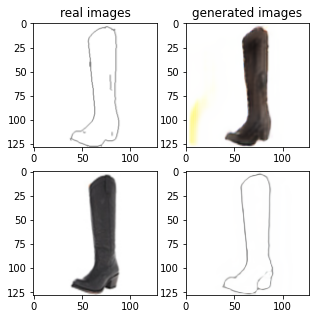

Train Epoch: 2 53% 	Total Loss: 1.168045 	Loss_G_AB: 0.299148	Loss_G_BA: 0.993517	Loss_cycle: 0.265916	Loss_D_A: 0.023746	Loss_D_B: 0.232051
1 76009 T:  1.9152283668518066
Train Epoch: 2 53% 	Total Loss: 1.275561 	Loss_G_AB: 0.250031	Loss_G_BA: 0.995585	Loss_cycle: 0.370066	Loss_D_A: 0.004219	Loss_D_B: 0.278467
1 76019 T:  1.1875202655792236
Train Epoch: 2 53% 	Total Loss: 1.283017 	Loss_G_AB: 0.321870	Loss_G_BA: 0.990122	Loss_cycle: 0.396700	Loss_D_A: 0.002649	Loss_D_B: 0.227673
1 76029 T:  1.1780321598052979
Train Epoch: 2 53% 	Total Loss: 1.336827 	Loss_G_AB: 0.321139	Loss_G_BA: 1.034906	Loss_cycle: 0.422683	Loss_D_A: 0.002666	Loss_D_B: 0.233455
1 76039 T:  1.1798522472381592
Train Epoch: 2 53% 	Total Loss: 1.290786 	Loss_G_AB: 0.379100	Loss_G_BA: 0.990958	Loss_cycle: 0.359478	Loss_D_A: 0.003012	Loss_D_B: 0.243267
1 76049 T:  1.182075023651123
Train Epoch: 2 53% 	Total Loss: 1.249595 	Loss_G_AB: 0.307799	Loss_G_BA: 1.002337	Loss_cycle: 0.370760	Loss_D_A: 0.002981	Loss_D_B: 0.220786


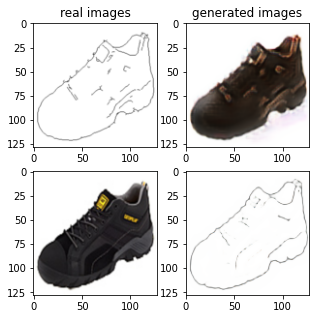

Train Epoch: 2 55% 	Total Loss: 1.369953 	Loss_G_AB: 0.331894	Loss_G_BA: 0.977410	Loss_cycle: 0.403466	Loss_D_A: 0.015723	Loss_D_B: 0.296112
1 77009 T:  2.017745018005371
Train Epoch: 2 55% 	Total Loss: 1.256880 	Loss_G_AB: 0.282914	Loss_G_BA: 0.960165	Loss_cycle: 0.369811	Loss_D_A: 0.019016	Loss_D_B: 0.246513
1 77019 T:  1.1766173839569092
Train Epoch: 2 55% 	Total Loss: 1.214949 	Loss_G_AB: 0.339605	Loss_G_BA: 0.991713	Loss_cycle: 0.316923	Loss_D_A: 0.009168	Loss_D_B: 0.223199
1 77029 T:  1.1758301258087158
Train Epoch: 2 55% 	Total Loss: 1.167230 	Loss_G_AB: 0.290692	Loss_G_BA: 0.989298	Loss_cycle: 0.285293	Loss_D_A: 0.002844	Loss_D_B: 0.239099
1 77039 T:  1.18436861038208
Train Epoch: 2 55% 	Total Loss: 1.206363 	Loss_G_AB: 0.277234	Loss_G_BA: 0.993214	Loss_cycle: 0.308083	Loss_D_A: 0.002043	Loss_D_B: 0.261013
1 77049 T:  1.1760478019714355
Train Epoch: 2 55% 	Total Loss: 1.211919 	Loss_G_AB: 0.280642	Loss_G_BA: 1.001228	Loss_cycle: 0.307876	Loss_D_A: 0.002808	Loss_D_B: 0.260299
1 

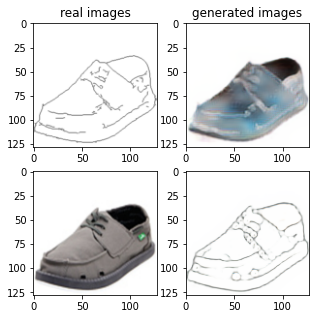

Train Epoch: 2 57% 	Total Loss: 1.312487 	Loss_G_AB: 0.321737	Loss_G_BA: 0.982572	Loss_cycle: 0.424834	Loss_D_A: 0.002268	Loss_D_B: 0.233230
1 78009 T:  1.939054250717163
Train Epoch: 2 57% 	Total Loss: 1.205339 	Loss_G_AB: 0.277186	Loss_G_BA: 0.998453	Loss_cycle: 0.290285	Loss_D_A: 0.001793	Loss_D_B: 0.275442
1 78019 T:  1.1778786182403564
Train Epoch: 2 57% 	Total Loss: 1.312486 	Loss_G_AB: 0.345011	Loss_G_BA: 0.992689	Loss_cycle: 0.397033	Loss_D_A: 0.001381	Loss_D_B: 0.245221
1 78029 T:  1.1772239208221436
Train Epoch: 2 57% 	Total Loss: 1.278390 	Loss_G_AB: 0.308551	Loss_G_BA: 1.017398	Loss_cycle: 0.377845	Loss_D_A: 0.001601	Loss_D_B: 0.235970
1 78039 T:  1.1870462894439697
Train Epoch: 2 57% 	Total Loss: 1.195548 	Loss_G_AB: 0.253194	Loss_G_BA: 0.996609	Loss_cycle: 0.274011	Loss_D_A: 0.001615	Loss_D_B: 0.295020
1 78049 T:  1.1766972541809082
Train Epoch: 2 57% 	Total Loss: 1.305857 	Loss_G_AB: 0.252788	Loss_G_BA: 0.986689	Loss_cycle: 0.413925	Loss_D_A: 0.001471	Loss_D_B: 0.270723


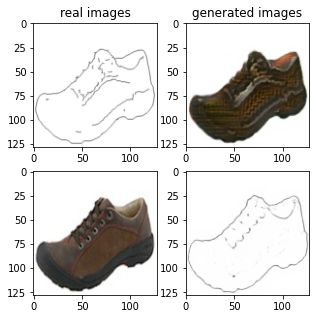

Train Epoch: 2 59% 	Total Loss: 1.358697 	Loss_G_AB: 0.365433	Loss_G_BA: 0.985271	Loss_cycle: 0.451309	Loss_D_A: 0.002461	Loss_D_B: 0.229574
1 79009 T:  1.9679324626922607
Train Epoch: 2 59% 	Total Loss: 1.191964 	Loss_G_AB: 0.391020	Loss_G_BA: 1.002214	Loss_cycle: 0.318360	Loss_D_A: 0.002207	Loss_D_B: 0.174779
1 79019 T:  1.1765282154083252
Train Epoch: 2 59% 	Total Loss: 1.363272 	Loss_G_AB: 0.278518	Loss_G_BA: 0.998844	Loss_cycle: 0.421838	Loss_D_A: 0.004600	Loss_D_B: 0.298153
1 79029 T:  1.1870100498199463
Train Epoch: 2 59% 	Total Loss: 1.175167 	Loss_G_AB: 0.292159	Loss_G_BA: 1.004176	Loss_cycle: 0.276576	Loss_D_A: 0.004616	Loss_D_B: 0.245807
1 79039 T:  1.177659034729004
Train Epoch: 2 59% 	Total Loss: 1.166724 	Loss_G_AB: 0.284303	Loss_G_BA: 1.015844	Loss_cycle: 0.256276	Loss_D_A: 0.003385	Loss_D_B: 0.256988
1 79049 T:  1.1764986515045166
Train Epoch: 2 59% 	Total Loss: 1.201608 	Loss_G_AB: 0.290854	Loss_G_BA: 0.991456	Loss_cycle: 0.305005	Loss_D_A: 0.004007	Loss_D_B: 0.251442


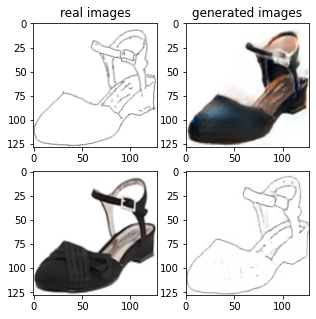

Train Epoch: 2 61% 	Total Loss: 1.231245 	Loss_G_AB: 0.293064	Loss_G_BA: 1.008128	Loss_cycle: 0.320067	Loss_D_A: 0.001708	Loss_D_B: 0.258875
1 80009 T:  1.9327986240386963
Train Epoch: 2 61% 	Total Loss: 1.211587 	Loss_G_AB: 0.297857	Loss_G_BA: 0.989099	Loss_cycle: 0.330949	Loss_D_A: 0.005156	Loss_D_B: 0.232004
1 80019 T:  1.1775782108306885
Train Epoch: 2 61% 	Total Loss: 1.198871 	Loss_G_AB: 0.276031	Loss_G_BA: 1.008420	Loss_cycle: 0.304755	Loss_D_A: 0.004146	Loss_D_B: 0.247745
1 80029 T:  1.1835472583770752
Train Epoch: 2 61% 	Total Loss: 1.346616 	Loss_G_AB: 0.318487	Loss_G_BA: 1.007019	Loss_cycle: 0.438656	Loss_D_A: 0.003927	Loss_D_B: 0.241280
1 80039 T:  1.1806535720825195
Train Epoch: 2 61% 	Total Loss: 1.214034 	Loss_G_AB: 0.276420	Loss_G_BA: 0.998134	Loss_cycle: 0.300313	Loss_D_A: 0.005593	Loss_D_B: 0.270851
1 80049 T:  1.1877615451812744
Train Epoch: 2 61% 	Total Loss: 1.174644 	Loss_G_AB: 0.333854	Loss_G_BA: 0.999616	Loss_cycle: 0.265555	Loss_D_A: 0.001360	Loss_D_B: 0.240993

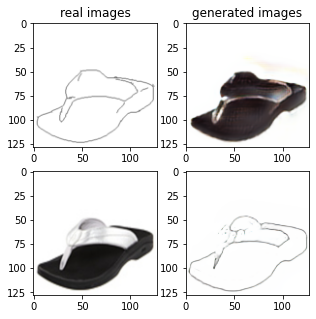

Train Epoch: 2 63% 	Total Loss: 1.305797 	Loss_G_AB: 0.327845	Loss_G_BA: 1.004881	Loss_cycle: 0.398499	Loss_D_A: 0.003743	Loss_D_B: 0.237192
1 81009 T:  1.9205656051635742
Train Epoch: 2 63% 	Total Loss: 1.300321 	Loss_G_AB: 0.319262	Loss_G_BA: 0.984342	Loss_cycle: 0.400373	Loss_D_A: 0.001946	Loss_D_B: 0.246200
1 81019 T:  1.17942476272583
Train Epoch: 2 63% 	Total Loss: 1.249889 	Loss_G_AB: 0.317123	Loss_G_BA: 0.999259	Loss_cycle: 0.340098	Loss_D_A: 0.003343	Loss_D_B: 0.248257
1 81029 T:  1.1773602962493896
Train Epoch: 2 63% 	Total Loss: 1.277052 	Loss_G_AB: 0.299571	Loss_G_BA: 0.979428	Loss_cycle: 0.384457	Loss_D_A: 0.006908	Loss_D_B: 0.246187
1 81039 T:  1.180251121520996
Train Epoch: 2 63% 	Total Loss: 1.230105 	Loss_G_AB: 0.332244	Loss_G_BA: 0.932290	Loss_cycle: 0.319322	Loss_D_A: 0.029817	Loss_D_B: 0.248698
1 81049 T:  1.1851387023925781
Train Epoch: 2 63% 	Total Loss: 1.282055 	Loss_G_AB: 0.339259	Loss_G_BA: 0.958406	Loss_cycle: 0.412330	Loss_D_A: 0.009854	Loss_D_B: 0.211037
1 

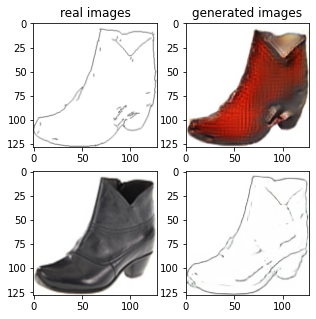

Train Epoch: 2 65% 	Total Loss: 1.222628 	Loss_G_AB: 0.341795	Loss_G_BA: 1.013589	Loss_cycle: 0.306975	Loss_D_A: 0.005231	Loss_D_B: 0.232731
1 82009 T:  1.910019874572754
Train Epoch: 2 65% 	Total Loss: 1.258540 	Loss_G_AB: 0.294173	Loss_G_BA: 0.994160	Loss_cycle: 0.344839	Loss_D_A: 0.002780	Loss_D_B: 0.266754
1 82019 T:  1.178490161895752
Train Epoch: 2 65% 	Total Loss: 1.370954 	Loss_G_AB: 0.263098	Loss_G_BA: 1.017291	Loss_cycle: 0.452874	Loss_D_A: 0.002301	Loss_D_B: 0.275584
1 82029 T:  1.1802644729614258
Train Epoch: 2 65% 	Total Loss: 1.185995 	Loss_G_AB: 0.283568	Loss_G_BA: 0.971969	Loss_cycle: 0.311495	Loss_D_A: 0.006277	Loss_D_B: 0.240454
1 82039 T:  1.181166172027588
Train Epoch: 2 65% 	Total Loss: 1.291566 	Loss_G_AB: 0.289845	Loss_G_BA: 1.000484	Loss_cycle: 0.394324	Loss_D_A: 0.004739	Loss_D_B: 0.247338
1 82049 T:  1.1796188354492188
Train Epoch: 2 65% 	Total Loss: 1.302396 	Loss_G_AB: 0.330739	Loss_G_BA: 0.994156	Loss_cycle: 0.409994	Loss_D_A: 0.003463	Loss_D_B: 0.226492
1 

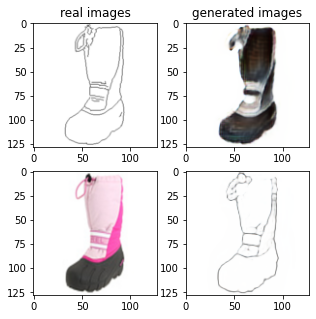

Train Epoch: 2 67% 	Total Loss: 1.249250 	Loss_G_AB: 0.306393	Loss_G_BA: 0.994850	Loss_cycle: 0.344458	Loss_D_A: 0.004848	Loss_D_B: 0.249323
1 83009 T:  2.0048375129699707
Train Epoch: 2 67% 	Total Loss: 1.279960 	Loss_G_AB: 0.296940	Loss_G_BA: 0.903821	Loss_cycle: 0.326337	Loss_D_A: 0.112611	Loss_D_B: 0.240631
1 83019 T:  1.1813855171203613
Train Epoch: 2 67% 	Total Loss: 1.303830 	Loss_G_AB: 0.301943	Loss_G_BA: 0.939996	Loss_cycle: 0.430753	Loss_D_A: 0.036854	Loss_D_B: 0.215253
1 83029 T:  1.1825108528137207
Train Epoch: 2 67% 	Total Loss: 1.252946 	Loss_G_AB: 0.310927	Loss_G_BA: 0.967648	Loss_cycle: 0.326307	Loss_D_A: 0.016256	Loss_D_B: 0.271095
1 83039 T:  1.1796481609344482
Train Epoch: 2 67% 	Total Loss: 1.237452 	Loss_G_AB: 0.339483	Loss_G_BA: 1.017300	Loss_cycle: 0.330194	Loss_D_A: 0.002998	Loss_D_B: 0.225869
1 83049 T:  1.1936180591583252
Train Epoch: 2 67% 	Total Loss: 1.227078 	Loss_G_AB: 0.295421	Loss_G_BA: 0.996293	Loss_cycle: 0.349110	Loss_D_A: 0.002264	Loss_D_B: 0.229847

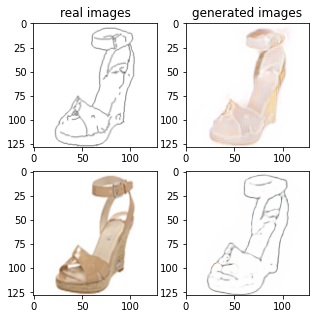

Train Epoch: 2 69% 	Total Loss: 1.146667 	Loss_G_AB: 0.301904	Loss_G_BA: 0.824698	Loss_cycle: 0.257297	Loss_D_A: 0.088973	Loss_D_B: 0.237096
1 84009 T:  1.9380066394805908
Train Epoch: 2 69% 	Total Loss: 1.356346 	Loss_G_AB: 0.362445	Loss_G_BA: 0.896296	Loss_cycle: 0.420363	Loss_D_A: 0.097872	Loss_D_B: 0.208741
1 84019 T:  1.1811866760253906
Train Epoch: 2 69% 	Total Loss: 1.217784 	Loss_G_AB: 0.339038	Loss_G_BA: 0.638548	Loss_cycle: 0.340836	Loss_D_A: 0.152073	Loss_D_B: 0.236082
1 84029 T:  1.1793632507324219
Train Epoch: 2 69% 	Total Loss: 1.200601 	Loss_G_AB: 0.271042	Loss_G_BA: 0.621431	Loss_cycle: 0.377653	Loss_D_A: 0.126009	Loss_D_B: 0.250703
1 84039 T:  1.1840054988861084
Train Epoch: 2 69% 	Total Loss: 1.277663 	Loss_G_AB: 0.344348	Loss_G_BA: 0.610866	Loss_cycle: 0.404604	Loss_D_A: 0.191063	Loss_D_B: 0.204389
1 84049 T:  1.1812031269073486
Train Epoch: 2 69% 	Total Loss: 1.356201 	Loss_G_AB: 0.343530	Loss_G_BA: 1.015259	Loss_cycle: 0.413966	Loss_D_A: 0.015777	Loss_D_B: 0.247064

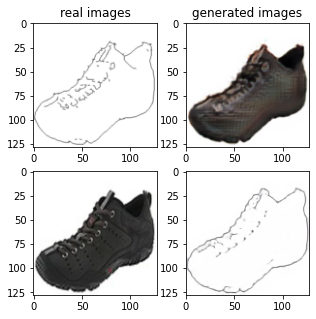

Train Epoch: 2 71% 	Total Loss: 1.218311 	Loss_G_AB: 0.269403	Loss_G_BA: 1.007094	Loss_cycle: 0.333875	Loss_D_A: 0.001783	Loss_D_B: 0.244404
1 85009 T:  1.9225788116455078
Train Epoch: 2 71% 	Total Loss: 1.170313 	Loss_G_AB: 0.305245	Loss_G_BA: 0.993166	Loss_cycle: 0.278707	Loss_D_A: 0.002160	Loss_D_B: 0.240241
1 85019 T:  1.1832435131072998
Train Epoch: 2 71% 	Total Loss: 1.253207 	Loss_G_AB: 0.311018	Loss_G_BA: 0.998188	Loss_cycle: 0.349068	Loss_D_A: 0.001448	Loss_D_B: 0.248088
1 85029 T:  1.1781022548675537
Train Epoch: 2 71% 	Total Loss: 1.229327 	Loss_G_AB: 0.291157	Loss_G_BA: 1.015933	Loss_cycle: 0.335718	Loss_D_A: 0.003349	Loss_D_B: 0.236715
1 85039 T:  1.187614917755127
Train Epoch: 2 71% 	Total Loss: 1.178218 	Loss_G_AB: 0.277222	Loss_G_BA: 0.963217	Loss_cycle: 0.298173	Loss_D_A: 0.002215	Loss_D_B: 0.257609
1 85049 T:  1.1795198917388916
Train Epoch: 2 71% 	Total Loss: 1.214664 	Loss_G_AB: 0.344951	Loss_G_BA: 1.020214	Loss_cycle: 0.312470	Loss_D_A: 0.001972	Loss_D_B: 0.217640


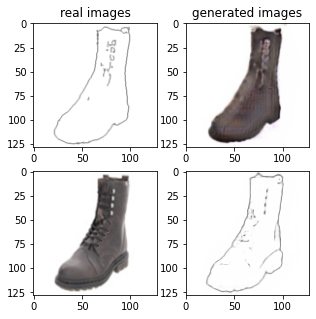

Train Epoch: 2 73% 	Total Loss: 1.276509 	Loss_G_AB: 0.254823	Loss_G_BA: 1.004330	Loss_cycle: 0.371668	Loss_D_A: 0.001335	Loss_D_B: 0.273930
1 86009 T:  1.9009249210357666
Train Epoch: 2 73% 	Total Loss: 1.192382 	Loss_G_AB: 0.322800	Loss_G_BA: 0.995095	Loss_cycle: 0.309525	Loss_D_A: 0.001209	Loss_D_B: 0.222701
1 86019 T:  1.176703929901123
Train Epoch: 2 73% 	Total Loss: 1.190538 	Loss_G_AB: 0.319960	Loss_G_BA: 1.001722	Loss_cycle: 0.325314	Loss_D_A: 0.001306	Loss_D_B: 0.203076
1 86029 T:  1.1835384368896484
Train Epoch: 2 73% 	Total Loss: 1.260884 	Loss_G_AB: 0.326274	Loss_G_BA: 1.005550	Loss_cycle: 0.371466	Loss_D_A: 0.001287	Loss_D_B: 0.222219
1 86039 T:  1.1851942539215088
Train Epoch: 2 73% 	Total Loss: 1.228167 	Loss_G_AB: 0.307172	Loss_G_BA: 0.984792	Loss_cycle: 0.331337	Loss_D_A: 0.001844	Loss_D_B: 0.249004
1 86049 T:  1.1836936473846436
Train Epoch: 2 73% 	Total Loss: 1.265723 	Loss_G_AB: 0.364835	Loss_G_BA: 1.006053	Loss_cycle: 0.318602	Loss_D_A: 0.002670	Loss_D_B: 0.259007


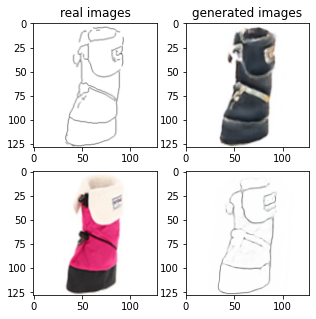

Train Epoch: 2 75% 	Total Loss: 1.266793 	Loss_G_AB: 0.313114	Loss_G_BA: 0.986065	Loss_cycle: 0.381562	Loss_D_A: 0.001898	Loss_D_B: 0.233744
1 87009 T:  1.9297573566436768
Train Epoch: 2 75% 	Total Loss: 1.177097 	Loss_G_AB: 0.291123	Loss_G_BA: 1.017116	Loss_cycle: 0.291438	Loss_D_A: 0.001887	Loss_D_B: 0.229654
1 87019 T:  1.1811881065368652
Train Epoch: 2 75% 	Total Loss: 1.204304 	Loss_G_AB: 0.341609	Loss_G_BA: 1.001916	Loss_cycle: 0.331079	Loss_D_A: 0.000912	Loss_D_B: 0.200550
1 87029 T:  1.1850967407226562
Train Epoch: 2 75% 	Total Loss: 1.236319 	Loss_G_AB: 0.289715	Loss_G_BA: 0.999063	Loss_cycle: 0.326702	Loss_D_A: 0.001454	Loss_D_B: 0.263775
1 87039 T:  1.1905014514923096
Train Epoch: 2 75% 	Total Loss: 1.215893 	Loss_G_AB: 0.320843	Loss_G_BA: 0.999518	Loss_cycle: 0.352897	Loss_D_A: 0.001736	Loss_D_B: 0.201080
1 87049 T:  1.1862833499908447
Train Epoch: 2 75% 	Total Loss: 1.247228 	Loss_G_AB: 0.293773	Loss_G_BA: 0.961782	Loss_cycle: 0.304960	Loss_D_A: 0.020675	Loss_D_B: 0.293815

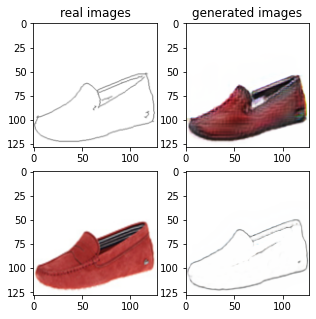

Train Epoch: 2 77% 	Total Loss: 1.212290 	Loss_G_AB: 0.328022	Loss_G_BA: 0.999124	Loss_cycle: 0.321515	Loss_D_A: 0.003020	Loss_D_B: 0.224182
1 88009 T:  1.8999054431915283
Train Epoch: 2 77% 	Total Loss: 1.237789 	Loss_G_AB: 0.331539	Loss_G_BA: 1.011276	Loss_cycle: 0.335018	Loss_D_A: 0.003642	Loss_D_B: 0.227721
1 88019 T:  1.1787538528442383
Train Epoch: 2 77% 	Total Loss: 1.197004 	Loss_G_AB: 0.295657	Loss_G_BA: 1.004146	Loss_cycle: 0.310953	Loss_D_A: 0.001685	Loss_D_B: 0.234464
1 88029 T:  1.1857366561889648
Train Epoch: 2 77% 	Total Loss: 1.279894 	Loss_G_AB: 0.376122	Loss_G_BA: 0.995668	Loss_cycle: 0.365750	Loss_D_A: 0.001337	Loss_D_B: 0.226912
1 88039 T:  1.1754400730133057
Train Epoch: 2 77% 	Total Loss: 1.258184 	Loss_G_AB: 0.354990	Loss_G_BA: 0.997118	Loss_cycle: 0.329521	Loss_D_A: 0.001313	Loss_D_B: 0.251296
1 88049 T:  1.1803443431854248
Train Epoch: 2 77% 	Total Loss: 1.253511 	Loss_G_AB: 0.372982	Loss_G_BA: 0.993744	Loss_cycle: 0.348030	Loss_D_A: 0.001368	Loss_D_B: 0.220750

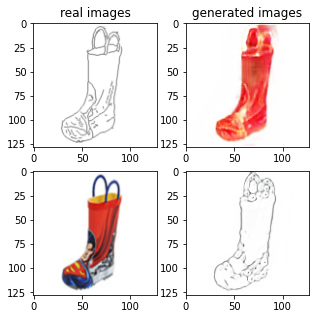

Train Epoch: 2 79% 	Total Loss: 1.285281 	Loss_G_AB: 0.409267	Loss_G_BA: 0.921757	Loss_cycle: 0.374095	Loss_D_A: 0.051665	Loss_D_B: 0.194009
1 89009 T:  1.9943675994873047
Train Epoch: 2 79% 	Total Loss: 1.307361 	Loss_G_AB: 0.349660	Loss_G_BA: 0.829365	Loss_cycle: 0.365430	Loss_D_A: 0.119623	Loss_D_B: 0.232796
1 89019 T:  1.178788661956787
Train Epoch: 2 79% 	Total Loss: 1.340396 	Loss_G_AB: 0.312369	Loss_G_BA: 1.019516	Loss_cycle: 0.366393	Loss_D_A: 0.038716	Loss_D_B: 0.269345
1 89029 T:  1.1857044696807861
Train Epoch: 2 79% 	Total Loss: 1.280375 	Loss_G_AB: 0.336421	Loss_G_BA: 0.942264	Loss_cycle: 0.364954	Loss_D_A: 0.037890	Loss_D_B: 0.238189
1 89039 T:  1.1787519454956055
Train Epoch: 2 79% 	Total Loss: 1.184034 	Loss_G_AB: 0.271587	Loss_G_BA: 0.751845	Loss_cycle: 0.316358	Loss_D_A: 0.115352	Loss_D_B: 0.240607
1 89049 T:  1.1767840385437012
Train Epoch: 2 79% 	Total Loss: 1.243941 	Loss_G_AB: 0.285322	Loss_G_BA: 1.005568	Loss_cycle: 0.323795	Loss_D_A: 0.023731	Loss_D_B: 0.250970


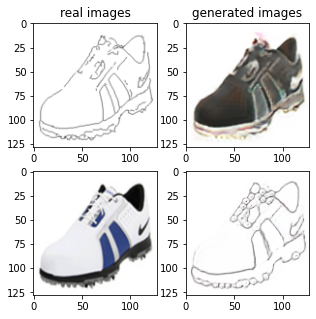

Train Epoch: 2 81% 	Total Loss: 1.276114 	Loss_G_AB: 0.294811	Loss_G_BA: 0.998535	Loss_cycle: 0.345070	Loss_D_A: 0.001858	Loss_D_B: 0.282514
1 90009 T:  1.895310640335083
Train Epoch: 2 81% 	Total Loss: 1.260054 	Loss_G_AB: 0.349724	Loss_G_BA: 0.999485	Loss_cycle: 0.303337	Loss_D_A: 0.006066	Loss_D_B: 0.276047
1 90019 T:  1.1859519481658936
Train Epoch: 2 81% 	Total Loss: 1.249640 	Loss_G_AB: 0.333877	Loss_G_BA: 1.000556	Loss_cycle: 0.347666	Loss_D_A: 0.002875	Loss_D_B: 0.231883
1 90029 T:  1.1767559051513672
Train Epoch: 2 81% 	Total Loss: 1.248987 	Loss_G_AB: 0.292374	Loss_G_BA: 1.019322	Loss_cycle: 0.320455	Loss_D_A: 0.002894	Loss_D_B: 0.269791
1 90039 T:  1.1854748725891113
Train Epoch: 2 81% 	Total Loss: 1.222339 	Loss_G_AB: 0.344123	Loss_G_BA: 0.981815	Loss_cycle: 0.326013	Loss_D_A: 0.006578	Loss_D_B: 0.226779
1 90049 T:  1.1766531467437744
Train Epoch: 2 81% 	Total Loss: 1.306337 	Loss_G_AB: 0.377634	Loss_G_BA: 0.986864	Loss_cycle: 0.431109	Loss_D_A: 0.002265	Loss_D_B: 0.190714


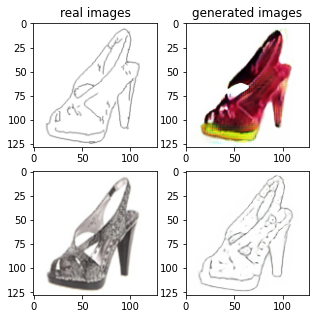

Train Epoch: 2 83% 	Total Loss: 1.207584 	Loss_G_AB: 0.282421	Loss_G_BA: 1.013067	Loss_cycle: 0.308909	Loss_D_A: 0.001393	Loss_D_B: 0.249538
1 91009 T:  1.9308056831359863
Train Epoch: 2 83% 	Total Loss: 1.282743 	Loss_G_AB: 0.366430	Loss_G_BA: 0.989584	Loss_cycle: 0.362324	Loss_D_A: 0.001737	Loss_D_B: 0.240675
1 91019 T:  1.175696611404419
Train Epoch: 2 83% 	Total Loss: 1.196815 	Loss_G_AB: 0.385339	Loss_G_BA: 0.995584	Loss_cycle: 0.313029	Loss_D_A: 0.001421	Loss_D_B: 0.191904
1 91029 T:  1.1785204410552979
Train Epoch: 2 83% 	Total Loss: 1.165974 	Loss_G_AB: 0.344823	Loss_G_BA: 0.894499	Loss_cycle: 0.308405	Loss_D_A: 0.034605	Loss_D_B: 0.203303
1 91039 T:  1.1871836185455322
Train Epoch: 2 83% 	Total Loss: 1.456443 	Loss_G_AB: 0.274625	Loss_G_BA: 0.823676	Loss_cycle: 0.417645	Loss_D_A: 0.169610	Loss_D_B: 0.320037
1 91049 T:  1.1793420314788818
Train Epoch: 2 83% 	Total Loss: 1.325952 	Loss_G_AB: 0.300753	Loss_G_BA: 1.044225	Loss_cycle: 0.382674	Loss_D_A: 0.013467	Loss_D_B: 0.257322


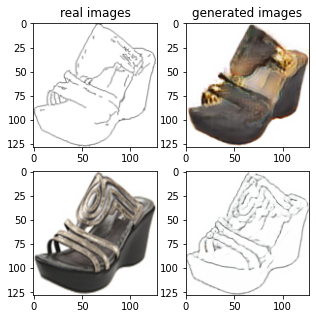

Train Epoch: 2 85% 	Total Loss: 1.225470 	Loss_G_AB: 0.311540	Loss_G_BA: 0.996054	Loss_cycle: 0.352410	Loss_D_A: 0.000923	Loss_D_B: 0.218340
1 92009 T:  1.9189841747283936
Train Epoch: 2 85% 	Total Loss: 1.171639 	Loss_G_AB: 0.280638	Loss_G_BA: 0.999319	Loss_cycle: 0.292654	Loss_D_A: 0.001085	Loss_D_B: 0.237921
1 92019 T:  1.1802170276641846
Train Epoch: 2 85% 	Total Loss: 1.296679 	Loss_G_AB: 0.288099	Loss_G_BA: 1.001492	Loss_cycle: 0.391942	Loss_D_A: 0.001242	Loss_D_B: 0.258700
1 92029 T:  1.1920428276062012
Train Epoch: 2 85% 	Total Loss: 1.272964 	Loss_G_AB: 0.349737	Loss_G_BA: 0.994584	Loss_cycle: 0.326359	Loss_D_A: 0.001344	Loss_D_B: 0.273100
1 92039 T:  1.1721649169921875
Train Epoch: 2 85% 	Total Loss: 1.276291 	Loss_G_AB: 0.324757	Loss_G_BA: 0.997373	Loss_cycle: 0.369816	Loss_D_A: 0.001053	Loss_D_B: 0.244356
1 92049 T:  1.1785888671875
Train Epoch: 2 85% 	Total Loss: 1.232641 	Loss_G_AB: 0.298663	Loss_G_BA: 1.015041	Loss_cycle: 0.329841	Loss_D_A: 0.001461	Loss_D_B: 0.244487
1 

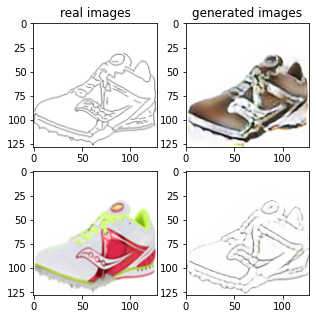

Train Epoch: 2 87% 	Total Loss: 1.187314 	Loss_G_AB: 0.317679	Loss_G_BA: 0.999457	Loss_cycle: 0.310322	Loss_D_A: 0.004836	Loss_D_B: 0.213588
1 93009 T:  1.896561861038208
Train Epoch: 2 87% 	Total Loss: 1.197615 	Loss_G_AB: 0.287706	Loss_G_BA: 1.010047	Loss_cycle: 0.311591	Loss_D_A: 0.004047	Loss_D_B: 0.233101
1 93019 T:  1.1767330169677734
Train Epoch: 2 87% 	Total Loss: 1.193447 	Loss_G_AB: 0.323925	Loss_G_BA: 0.995327	Loss_cycle: 0.297415	Loss_D_A: 0.001920	Loss_D_B: 0.234485
1 93029 T:  1.187476396560669
Train Epoch: 2 87% 	Total Loss: 1.192298 	Loss_G_AB: 0.320484	Loss_G_BA: 0.982378	Loss_cycle: 0.314743	Loss_D_A: 0.003257	Loss_D_B: 0.222867
1 93039 T:  1.1763834953308105
Train Epoch: 2 87% 	Total Loss: 1.218638 	Loss_G_AB: 0.272712	Loss_G_BA: 1.017534	Loss_cycle: 0.299576	Loss_D_A: 0.006151	Loss_D_B: 0.267788
1 93049 T:  1.176990032196045
Train Epoch: 2 87% 	Total Loss: 1.302283 	Loss_G_AB: 0.460498	Loss_G_BA: 1.002478	Loss_cycle: 0.372272	Loss_D_A: 0.001696	Loss_D_B: 0.196827
1 

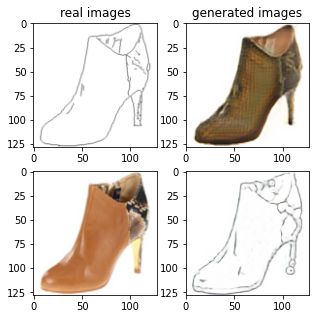

Train Epoch: 2 89% 	Total Loss: 1.286316 	Loss_G_AB: 0.283984	Loss_G_BA: 0.993838	Loss_cycle: 0.386559	Loss_D_A: 0.001789	Loss_D_B: 0.259057
1 94009 T:  2.017460584640503
Train Epoch: 2 89% 	Total Loss: 1.263826 	Loss_G_AB: 0.312515	Loss_G_BA: 0.998540	Loss_cycle: 0.379039	Loss_D_A: 0.001040	Loss_D_B: 0.228219
1 94019 T:  1.174565076828003
Train Epoch: 2 89% 	Total Loss: 1.312702 	Loss_G_AB: 0.349445	Loss_G_BA: 0.995224	Loss_cycle: 0.412641	Loss_D_A: 0.004915	Loss_D_B: 0.222812
1 94029 T:  1.2018508911132812
Train Epoch: 2 89% 	Total Loss: 1.239035 	Loss_G_AB: 0.292794	Loss_G_BA: 0.978273	Loss_cycle: 0.333210	Loss_D_A: 0.001773	Loss_D_B: 0.268519
1 94039 T:  1.1761019229888916
Train Epoch: 2 89% 	Total Loss: 1.264352 	Loss_G_AB: 0.284592	Loss_G_BA: 1.010880	Loss_cycle: 0.366533	Loss_D_A: 0.002331	Loss_D_B: 0.247752
1 94049 T:  1.179232120513916
Train Epoch: 2 89% 	Total Loss: 1.208439 	Loss_G_AB: 0.294450	Loss_G_BA: 1.011231	Loss_cycle: 0.322170	Loss_D_A: 0.001723	Loss_D_B: 0.231706
1 

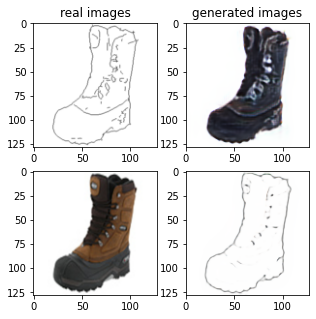

Train Epoch: 2 91% 	Total Loss: 1.245143 	Loss_G_AB: 0.327787	Loss_G_BA: 0.945947	Loss_cycle: 0.375786	Loss_D_A: 0.027463	Loss_D_B: 0.205026
1 95009 T:  1.9089691638946533
Train Epoch: 2 91% 	Total Loss: 1.309387 	Loss_G_AB: 0.405205	Loss_G_BA: 1.032582	Loss_cycle: 0.359496	Loss_D_A: 0.063248	Loss_D_B: 0.167749
1 95019 T:  1.1784510612487793
Train Epoch: 2 91% 	Total Loss: 1.260535 	Loss_G_AB: 0.355031	Loss_G_BA: 0.903069	Loss_cycle: 0.330946	Loss_D_A: 0.063869	Loss_D_B: 0.236669
1 95029 T:  1.17104172706604
Train Epoch: 2 91% 	Total Loss: 1.507869 	Loss_G_AB: 0.283577	Loss_G_BA: 0.939520	Loss_cycle: 0.405944	Loss_D_A: 0.203311	Loss_D_B: 0.287065
1 95039 T:  1.1841773986816406
Train Epoch: 2 91% 	Total Loss: 1.403813 	Loss_G_AB: 0.320613	Loss_G_BA: 0.919278	Loss_cycle: 0.462732	Loss_D_A: 0.052568	Loss_D_B: 0.268568
1 95049 T:  1.1775543689727783
Train Epoch: 2 91% 	Total Loss: 1.215843 	Loss_G_AB: 0.300008	Loss_G_BA: 0.989268	Loss_cycle: 0.296348	Loss_D_A: 0.016753	Loss_D_B: 0.258105
1

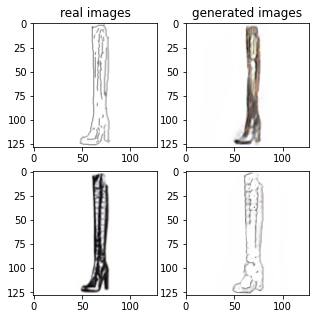

Train Epoch: 2 93% 	Total Loss: 1.228750 	Loss_G_AB: 0.334433	Loss_G_BA: 0.999253	Loss_cycle: 0.335489	Loss_D_A: 0.003470	Loss_D_B: 0.222948
1 96009 T:  1.8932194709777832
Train Epoch: 2 93% 	Total Loss: 1.219266 	Loss_G_AB: 0.328678	Loss_G_BA: 1.020864	Loss_cycle: 0.314173	Loss_D_A: 0.006461	Loss_D_B: 0.223861
1 96019 T:  1.17146635055542
Train Epoch: 2 93% 	Total Loss: 1.257728 	Loss_G_AB: 0.315273	Loss_G_BA: 0.997462	Loss_cycle: 0.333828	Loss_D_A: 0.019915	Loss_D_B: 0.247617
1 96029 T:  1.1845855712890625
Train Epoch: 2 93% 	Total Loss: 1.378500 	Loss_G_AB: 0.296321	Loss_G_BA: 1.017244	Loss_cycle: 0.486486	Loss_D_A: 0.002371	Loss_D_B: 0.232861
1 96039 T:  1.1805157661437988
Train Epoch: 2 93% 	Total Loss: 1.249316 	Loss_G_AB: 0.297063	Loss_G_BA: 0.963457	Loss_cycle: 0.374008	Loss_D_A: 0.005694	Loss_D_B: 0.239354
1 96049 T:  1.183182954788208
Train Epoch: 2 93% 	Total Loss: 1.338060 	Loss_G_AB: 0.318585	Loss_G_BA: 1.003956	Loss_cycle: 0.430500	Loss_D_A: 0.002429	Loss_D_B: 0.243861
1 

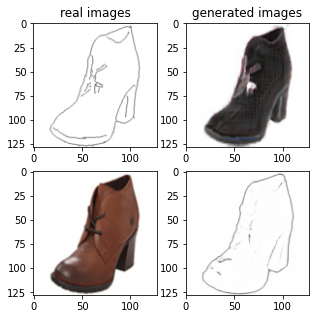

Train Epoch: 2 95% 	Total Loss: 1.222579 	Loss_G_AB: 0.334936	Loss_G_BA: 0.994685	Loss_cycle: 0.331649	Loss_D_A: 0.002350	Loss_D_B: 0.223769
1 97009 T:  1.8832662105560303
Train Epoch: 2 95% 	Total Loss: 1.236818 	Loss_G_AB: 0.317103	Loss_G_BA: 1.011466	Loss_cycle: 0.343122	Loss_D_A: 0.001422	Loss_D_B: 0.227989
1 97019 T:  1.1765005588531494
Train Epoch: 2 95% 	Total Loss: 1.202890 	Loss_G_AB: 0.339057	Loss_G_BA: 0.989857	Loss_cycle: 0.321789	Loss_D_A: 0.002030	Loss_D_B: 0.214614
1 97029 T:  1.1750068664550781
Train Epoch: 2 95% 	Total Loss: 1.159518 	Loss_G_AB: 0.271413	Loss_G_BA: 1.005952	Loss_cycle: 0.279357	Loss_D_A: 0.002002	Loss_D_B: 0.239477
1 97039 T:  1.1853206157684326
Train Epoch: 2 95% 	Total Loss: 1.169654 	Loss_G_AB: 0.276806	Loss_G_BA: 0.991151	Loss_cycle: 0.285004	Loss_D_A: 0.001099	Loss_D_B: 0.249573
1 97049 T:  1.1891210079193115
Train Epoch: 2 95% 	Total Loss: 1.315711 	Loss_G_AB: 0.355425	Loss_G_BA: 1.003605	Loss_cycle: 0.407818	Loss_D_A: 0.001932	Loss_D_B: 0.226446

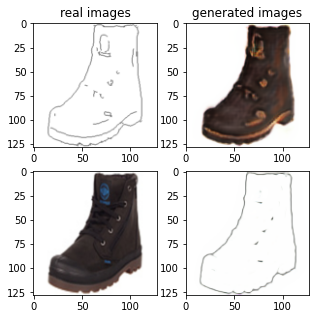

Train Epoch: 2 97% 	Total Loss: 1.273834 	Loss_G_AB: 0.327114	Loss_G_BA: 0.958139	Loss_cycle: 0.371586	Loss_D_A: 0.026982	Loss_D_B: 0.232639
1 98009 T:  1.9021382331848145
Train Epoch: 2 97% 	Total Loss: 1.213221 	Loss_G_AB: 0.284760	Loss_G_BA: 0.804808	Loss_cycle: 0.335389	Loss_D_A: 0.097012	Loss_D_B: 0.236036
1 98019 T:  1.17783522605896
Train Epoch: 2 97% 	Total Loss: 1.271281 	Loss_G_AB: 0.304496	Loss_G_BA: 1.003489	Loss_cycle: 0.337620	Loss_D_A: 0.028254	Loss_D_B: 0.251414
1 98029 T:  1.1823768615722656
Train Epoch: 2 97% 	Total Loss: 1.231845 	Loss_G_AB: 0.334274	Loss_G_BA: 0.915058	Loss_cycle: 0.365918	Loss_D_A: 0.022263	Loss_D_B: 0.218997
1 98039 T:  1.174027442932129
Train Epoch: 2 97% 	Total Loss: 1.280602 	Loss_G_AB: 0.304760	Loss_G_BA: 0.842299	Loss_cycle: 0.338854	Loss_D_A: 0.107315	Loss_D_B: 0.260903
1 98049 T:  1.180389165878296
Train Epoch: 2 97% 	Total Loss: 1.247251 	Loss_G_AB: 0.303402	Loss_G_BA: 1.030597	Loss_cycle: 0.328490	Loss_D_A: 0.023405	Loss_D_B: 0.228357
1 9

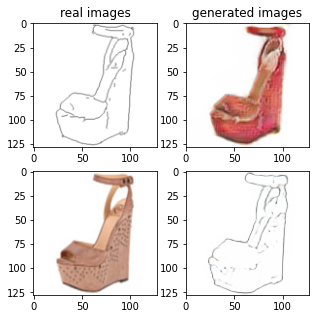

Train Epoch: 2 99% 	Total Loss: 1.170915 	Loss_G_AB: 0.379362	Loss_G_BA: 0.671057	Loss_cycle: 0.346129	Loss_D_A: 0.127565	Loss_D_B: 0.172011
1 99009 T:  1.9204216003417969
Train Epoch: 2 99% 	Total Loss: 1.381017 	Loss_G_AB: 0.400878	Loss_G_BA: 0.771231	Loss_cycle: 0.420254	Loss_D_A: 0.131527	Loss_D_B: 0.243181
1 99019 T:  1.174943208694458
Train Epoch: 2 99% 	Total Loss: 1.291720 	Loss_G_AB: 0.300768	Loss_G_BA: 0.935611	Loss_cycle: 0.405829	Loss_D_A: 0.021421	Loss_D_B: 0.246280
1 99029 T:  1.178337574005127
Train Epoch: 2 99% 	Total Loss: 1.201778 	Loss_G_AB: 0.301245	Loss_G_BA: 0.957028	Loss_cycle: 0.334085	Loss_D_A: 0.013544	Loss_D_B: 0.225012
1 99039 T:  1.228074312210083
Train Epoch: 2 99% 	Total Loss: 1.304754 	Loss_G_AB: 0.299414	Loss_G_BA: 1.045759	Loss_cycle: 0.365664	Loss_D_A: 0.013300	Loss_D_B: 0.253204
1 99049 T:  1.178215503692627
Train Epoch: 2 99% 	Total Loss: 1.290841 	Loss_G_AB: 0.356728	Loss_G_BA: 0.995134	Loss_cycle: 0.390383	Loss_D_A: 0.002023	Loss_D_B: 0.222503
1 9

In [ ]:
import warnings
warnings.filterwarnings("ignore")
from torch.autograd import Variable
from torch.utils import data
from torch.utils.data import DataLoader, TensorDataset
from torch import nn, optim
from datasets import *
from models import *
import argparse, os
import itertools
import torch
import time
import pdb
import matplotlib.pyplot as plt


# Training Configurations
# (You may put your needed configuration here. Please feel free to add more or use argparse. )
train_img_dir = './edges2shoes/train/'
img_shape = (3, 128, 128)
n_residual_blocks = 6
num_epochs = 2
batch_size = 1
lr_rate = 0.0002      # Adam optimizer learning rate
betas = (0.5, 0.999)  # Adam optimizer beta 1, beta 2
lambda_cyc = 10.0 	  # cycle loss weight
latent_dim = 8        # latent dimension for the encoded images from domain B
report_feq = 10        # Visualize image every 'report_feq' iters
visual_feq = 1000
save_feq = 1000    # Save models every 'save_feq' iters

# Random seeds (optional)
torch.manual_seed(1); np.random.seed(1)

# set device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Normalize image tensor
def norm(image):
    return (image/255.0-0.5)*2.0

# Denormalize image tensor
def denorm(tensor):
    return ((tensor+1.0)/2.0)*255.0

train_dataset = Edge2Shoe(train_img_dir)
train_loader = data.DataLoader(train_dataset, batch_size=batch_size)
print('the length of training data:', len(train_dataset))
# Losses
criterion_GAN = torch.nn.MSELoss()
criterion_cycle = torch.nn.L1Loss()

cuda = torch.cuda.is_available()

input_shape = img_shape

# Initialize generator and discriminator
G_AB = GeneratorResNet(input_shape, n_residual_blocks)
G_BA = GeneratorResNet(input_shape, n_residual_blocks)
D_A = Discriminator(input_shape)
D_B = Discriminator(input_shape)


if cuda:
    G_AB = G_AB.to(device)
    G_BA = G_BA.to(device)
    D_A = D_A.to(device)
    D_B = D_B.to(device)
    criterion_GAN.to(device)
    criterion_cycle.to(device)

# Initialize weights
G_AB.apply(weights_init_normal)
G_BA.apply(weights_init_normal)
D_A.apply(weights_init_normal)
D_B.apply(weights_init_normal)



# Define optimizer
optimizer_G = torch.optim.Adam(itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=lr_rate, betas=betas)
optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=lr_rate, betas=betas)
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=lr_rate, betas=betas)

# For adversarial loss
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor

# loss recorder
running_loss_D_A = 0
running_loss_D_B = 0
running_loss_GAN_AB = 0
running_loss_GAN_BA = 0
running_loss_cycle = 0
running_total_loss = 0

loss_D_A_    = []
loss_D_B_    = []
loss_GAN_AB_ = []
loss_GAN_BA_ = []
loss_cycle_  = []
total_loss_  = []
# Training
flag = 0
total_steps = len(train_loader)*num_epochs; step = 0
for e in range(num_epochs):
    start = time.time()
    for idx, data in enumerate(train_loader):
        ########## Process Inputs ##########
        edge_tensor, rgb_tensor = data
        edge_tensor, rgb_tensor = norm(edge_tensor).to(device), norm(rgb_tensor).to(device)
        real_A = edge_tensor; real_B = rgb_tensor;

        # Adversarial ground truths
        valid = Variable(Tensor(np.ones((real_A.size(0), *D_A.output_shape))), requires_grad=False)
        fake = Variable(Tensor(np.zeros((real_A.size(0), *D_A.output_shape))), requires_grad=False)

        # ------------------
        #  Train Generators
        # ------------------
        G_AB.train(); G_BA.train()
        optimizer_G.zero_grad()

        # Generator loss
        loss_GAN_AB, fake_B = loss_generator(G_AB, real_A, D_B, valid, criterion_GAN)
        loss_GAN_BA, fake_A = loss_generator(G_BA, real_B, D_A, valid, criterion_GAN)
        loss_GAN = (loss_GAN_AB + loss_GAN_BA) / 2

        # Cycle loss
        loss_cycle_A = loss_cycle_consis(G_BA, fake_B, real_A, criterion_cycle)
        loss_cycle_B = loss_cycle_consis(G_AB, fake_A, real_B, criterion_cycle)
        loss_cycle = (loss_cycle_A + loss_cycle_B) / 2

        # Total loss
        loss_G = loss_GAN + lambda_cyc * loss_cycle

        loss_G.backward()
        optimizer_G.step()


        # -----------------------
        #  Train Discriminator A
        # -----------------------

        optimizer_D_A.zero_grad()

        # function to compute loss_D_A
        loss_D_A = loss_discriminator(fake_A, D_A, real_A, valid, fake, criterion_GAN)
        loss_D_A = loss_D_A / 2
        # update the D_A network
        loss_D_A.backward()
        optimizer_D_A.step()


        # -----------------------
        #  Train Discriminator B
        # -----------------------
        optimizer_D_B.zero_grad()

        # function to compute loss_D_A
        loss_D_B = loss_discriminator(fake_B, D_B, real_B, valid, fake, criterion_GAN)
        loss_D_B = loss_D_B / 2
        # update the D_B network
        loss_D_B.backward()
        optimizer_D_B.step()


        



        running_total_loss += (loss_GAN + lambda_cyc * loss_cycle + loss_D_A + loss_D_B).item()

        running_loss_GAN_AB += loss_GAN_AB.item()
        running_loss_GAN_BA += loss_GAN_BA.item()
        running_loss_D_A += loss_D_A.item()
        running_loss_D_B += loss_D_B.item()
        running_loss_cycle += lambda_cyc * loss_cycle.item()
        ########## Visualization ##########
        if step % report_feq == report_feq-1:
            print('Train Epoch: {} {:.0f}% \tTotal Loss: {:.6f} \tLoss_G_AB: {:.6f}\tLoss_G_BA: {:.6f}\tLoss_cycle: {:.6f}\tLoss_D_A: {:.6f}\tLoss_D_B: {:.6f}'.format
                    (e+1, 100. * idx / len(train_loader), running_total_loss / report_feq, 
                    running_loss_GAN_AB/report_feq, running_loss_GAN_BA/report_feq, 
                    running_loss_cycle/report_feq, running_loss_D_A/report_feq, 
                    running_loss_D_B/report_feq))
            loss_D_A_.append(running_loss_D_A)
            loss_D_B_.append(running_loss_D_B)
            loss_GAN_AB_.append(running_loss_GAN_AB)
            loss_GAN_BA_.append(running_loss_GAN_BA)
            loss_cycle_.append(running_loss_cycle)
            
            running_loss_D_A = 0
            running_loss_D_B = 0
            running_loss_GAN_AB = 0
            running_loss_GAN_BA = 0
            running_loss_cycle = 0
            running_total_loss = 0
            end = time.time()
            print(e, step, 'T: ', end-start)
            start = end
        ########## Visualize Generated images ##########
        if step % visual_feq == 0:
            print(step)
            vis_fake_A = denorm(fake_A[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_fake_B = denorm(fake_B[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_real_B = denorm(real_B[0].detach()).cpu().data.numpy().astype(np.uint8)
            vis_real_A = denorm(real_A[0].detach()).cpu().data.numpy().astype(np.uint8)
            fig, axs = plt.subplots(2,2, figsize = (5,5))	
            
            axs[0,0].imshow(vis_real_A.transpose(1,2,0))
            axs[0,0].set_title('real images')
            axs[0,1].imshow(vis_fake_B.transpose(1,2,0))
            axs[0,1].set_title('generated images')
            axs[1,0].imshow(vis_real_B.transpose(1,2,0))
            axs[1,1].imshow(vis_fake_A.transpose(1,2,0))
            plt.show()
        ########## Save Generators ##########
        if step % save_feq == save_feq-1:
            # if not os.path.exists('models'): os.mkdir('models')
            # torch.save(G_AB, '/content/drive/MyDrive/CIS680_2019/GAN/G_AB.pt')
            # torch.save(G_BA, '/content/drive/MyDrive/CIS680_2019/GAN/G_BA.pt')
            # # feel free to save checkpoint if you need retrain the model...

            checkpoint = {"loss_D_A" : loss_D_A_,
                          "loss_D_B" : loss_D_B_,
                          "loss_GAN_AB" : loss_GAN_AB_,
                          "loss_GAN_BA":loss_GAN_BA_,
                          "loss_cycle":loss_cycle_,
                          # "total_loss":total_loss,
                          "G_AB" : G_AB.state_dict(),
                          "G_BA" : G_BA.state_dict(),
                          "D_A"  : D_A.state_dict(),
                          "D_B"  : D_B.state_dict()}
            torch.save(checkpoint, '/content/drive/MyDrive/Cycle GAN losses/' + str(flag)) 
            flag+=1
        step+=1       
    # if (e%1==0):
    #     checkpoint = {"loss_D_A" : loss_D_A,
    #                   "loss_D_B" : loss_D_B,
    #                   "loss_GAN_AB" : loss_GAN_AB,
    #                   "loss_GAN_BA":loss_GAN_BA,
    #                   "loss_cycle":loss_cycle,
    #                   "total_loss":total_loss,
    #                   "G_AB" : G_AB.state_dict(),
    #                   "G_BA" : G_BA.state_dict()}
    #     torch.save(checkpoint, '/content/drive/MyDrive/CIS680_2019/GAN/G_AB_' + str(e) + '.pt')

        

# New Section

# CycleGAN testing (TODO)

In [ ]:
from torch.utils.data import DataLoader, TensorDataset
from datasets import *

test_batch_size = 1
test_img_dir = './edges2shoes/val/'
test_dataset = Edge2Shoe(test_img_dir)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
G_AB = torch.load('/content/drive/MyDrive/CIS680_2019/GAN/G_AB.pt')
G_BA = torch.load('/content/drive/MyDrive/CIS680_2019/GAN/G_BA.pt')
if device == "cuda":
    G_AB = G_AB.to(device)
    G_BA = G_BA.to(device)

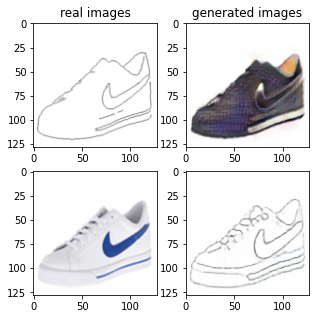

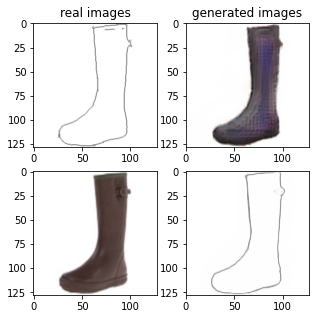

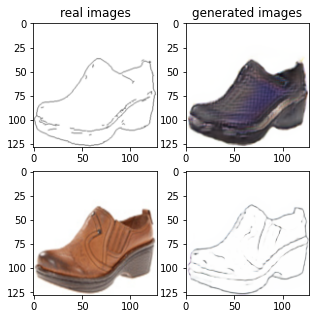

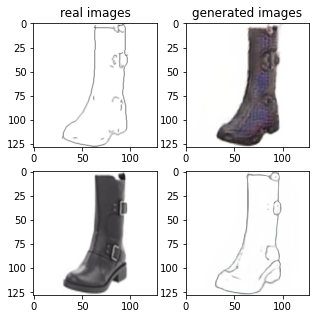

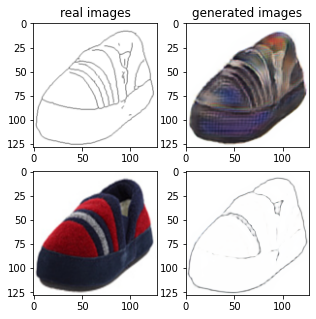

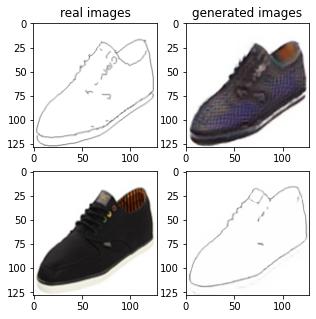

In [ ]:
import matplotlib.pyplot as plt

G_AB.eval()
G_BA.eval()
# Denormalize image tensor
def denorm(tensor):
    return ((tensor+1.0)/2.0)*255.0

# Normalize image tensor
def norm(image):
    return (image/255.0-0.5)*2.0

################################
# Please visualize real_edge, fake_shoe, real_shoe, fake_edge in 2-by-2 grids:
for i,data in enumerate(test_loader):
    edge_tensor, rgb_tensor = data
    edge_tensor, rgb_tensor = norm(edge_tensor).to(device), norm(rgb_tensor).to(device)
    real_A = edge_tensor; real_B = rgb_tensor;

    fake_B = G_AB(real_A)
    fake_A = G_BA(real_B)
    
    vis_fake_A = denorm(fake_A[0].detach()).cpu().data.numpy().astype(np.uint8)
    vis_fake_B = denorm(fake_B[0].detach()).cpu().data.numpy().astype(np.uint8)
    vis_real_B = denorm(real_B[0].detach()).cpu().data.numpy().astype(np.uint8)
    vis_real_A = denorm(real_A[0].detach()).cpu().data.numpy().astype(np.uint8)
    fig, axs = plt.subplots(2,2, figsize = (5,5))	

    axs[0,0].imshow(vis_real_A.transpose(1,2,0))
    axs[0,0].set_title('real images')
    axs[0,1].imshow(vis_fake_B.transpose(1,2,0))
    axs[0,1].set_title('generated images')
    axs[1,0].imshow(vis_real_B.transpose(1,2,0))
    axs[1,1].imshow(vis_fake_A.transpose(1,2,0))
    plt.savefig('/content/drive/MyDrive/CIS680_2019/GAN/CycleGAN_{}.png'.format(i))
    plt.show()
    if i==5:
      break
################################        



# Quantitative Evaluation

## FID Score computation

First, we have to create 6 datasets:
- Domain A real set 1
- Domain A real set 2
- Domain A generate set

- Domain B real set 1
- Domain B real set 2
- Domain B generate set



Create folder to save images and create dataset.

In [ ]:
! mkdir real_A_1 real_A_2 gen_A
! mkdir real_B_1 real_B_2 gen_B

In [ ]:
# First create test data loader
from torch.utils.data import DataLoader, TensorDataset
from torchvision.utils import save_image
test_batch_size = 1
test_img_dir = './edges2shoes/val/'
test_dataset = Edge2Shoe(test_img_dir)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)

# indicate the device we will use
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load learnt Generator G_AB and G_BA
G_AB = torch.load('/content/drive/MyDrive/CIS680_2019/GAN/G_AB.pt').to(device)
G_BA = torch.load('/content/drive/MyDrive/CIS680_2019/GAN/G_BA.pt').to(device)

# the size of dataset, we want to evaluate on
evaluate_num = 100

# make the gen data set and folder
real_A_set_1 = []
real_A_set_2 = []
real_B_set_1 = []
real_B_set_2 = []

gen_set_A = []
gen_set_B = []

for idx, data in enumerate(test_loader, 0):
    real_A, real_B = data
    # plt.imshow(real_A.type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
    # plt.show()
    real_A, real_B = norm(real_A).to(device), norm(real_B).to(device)
    # plt.imshow(denorm(real_A).type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
    # plt.imshow(denorm(real_A).squeeze(0).cpu().permute(1,2,0))
    # plt.show()
    # print(real_A.shape)
    
    if idx < evaluate_num:
        fake_A = G_BA(real_B)
        fake_B = G_AB(real_A)
        real_A_set_1.append(denorm(real_A.detach()))
        real_B_set_1.append(denorm(real_B.detach()))
        gen_set_A.append(denorm(fake_A.detach()))
        gen_set_B.append(denorm(fake_B.detach()))
        
        # plt.imshow(data[0].type(torch.uint8).squeeze(0).permute(1,2,0))
        # plt.imshow(denorm(real_A).squeeze(0).cpu().permute(1,2,0))
        # plt.imshow(denorm(real_A).type(torch.uint8).squeeze(0).cpu().permute(1,2,0))
        # plt.show()
        plt.imsave('./real_A_1/real_A' + str(idx) + '.png', denorm(real_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./real_B_1/real_B' + str(idx) + '.png', denorm(real_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./gen_A/gen_A' + str(idx) + '.png', denorm(fake_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./gen_B/gen_B' + str(idx) + '.png', denorm(fake_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        # save_image(denorm(real_A).type(torch.uint8).squeeze(), './real_A_1/real_A' + str(idx) + '.png', normalize=False)

        # save_image(denorm(real_B).detach().squeeze(), './real_B_1/real_B' + str(idx) + '.png', normalize=False)
        # save_image(denorm(fake_A).detach().squeeze(), './gen_A/gen_A' + str(idx) + '.png', normalize=False)
        # save_image(denorm(fake_B).detach().squeeze(), './gen_B/gen_B' + str(idx) + '.png', normalize=False)
        # del real_A; del real_B; del fake_A; del fake_B

    elif evaluate_num <= idx < 2*evaluate_num:
        real_A_set_2.append(real_A.detach())
        real_B_set_2.append(real_B.detach())
        plt.imsave('./real_A_2/real_A' + str(idx) + '.png', denorm(real_A).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        plt.imsave('./real_B_2/real_B' + str(idx) + '.png', denorm(real_B).type(torch.uint8).cpu().squeeze().permute(1,2,0).numpy())
        # save_image(denorm(real_A).detach().squeeze(), './real_A_2/real_A' + str(idx) + '.png', normalize=False)
        # save_image(denorm(real_B).detach().squeeze(), './real_B_2/real_B' + str(idx) + '.png', normalize=False)
    
    if idx == 2*evaluate_num-1:
        break
# make 6 pytorch dataset
real_A_dataset_1 = TensorDataset(torch.cat(real_A_set_1))
real_A_dataset_2 = TensorDataset(torch.cat(real_A_set_2))
real_B_dataset_1 = TensorDataset(torch.cat(real_B_set_1))
real_B_dataset_2 = TensorDataset(torch.cat(real_B_set_2))
gen_dataset_A = TensorDataset(torch.cat(gen_set_A))
gen_dataset_B = TensorDataset(torch.cat(gen_set_B))



## Compute FID score

In [ ]:
! pip install pytorch-fid

  Created wheel for pytorch-fid: filename=pytorch_fid-0.1.1-cp36-none-any.whl size=10188 sha256=e7d3cffe61365514e9916799a695e1ade12cd0ac5455ee81eaa9b3ab6a39de45
  Stored in directory: /root/.cache/pip/wheels/b8/93/92/a6a8add9047b97dcb2470d2d1642450e6b76b5988e9744e3f0
Successfully built pytorch-fid


In [ ]:
print('computing FID score between real_edge_1 and real_edge_2')
! python -m pytorch_fid '/content/real_A_1' '/content/real_A_2' --gpu 0

print('computing FID score between real_edge_1 and gen_edge')
! python -m pytorch_fid '/content/real_A_1' '/content/gen_A' --gpu 0

print('computing FID score between real_shoe_1 and real_shoe_2')
! python -m pytorch_fid '/content/real_B_1' '/content/real_B_2' --gpu 0

print('computing FID score between real_shoe_1 and gen_shoe')
! python -m pytorch_fid '/content/real_B_1' '/content/gen_B' --gpu 0

computing FID score between real_edge_1 and real_edge_2
Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100% 91.2M/91.2M [00:01<00:00, 84.6MB/s]
100% 2/2 [00:00<00:00,  3.92it/s]
100% 2/2 [00:00<00:00,  4.56it/s]
FID:  50.8930639766067
computing FID score between real_edge_1 and gen_edge
100% 2/2 [00:00<00:00,  4.02it/s]
100% 2/2 [00:00<00:00,  4.35it/s]
FID:  65.08142353119646
computing FID score between real_shoe_1 and real_shoe_2
100% 2/2 [00:00<00:00,  3.79it/s]
100% 2/2 [00:00<00:00,  4.09it/s]
FID:  59.734097904799285
computing FID score between real_shoe_1 and gen_shoe
100% 2/2 [00:00<00:00,  3.63it/s]
100% 2/2 [00:00<00:00,  4.06it/s]
FID:  112.5978823364103


## Compute IS score

In [ ]:
from inception_score import inception_score
import warnings
warnings.filterwarnings("ignore")

print('IS score for real_edge_1 data set:')
print(inception_score(real_A_dataset_1, cuda=True, batch_size=64, resize=True, splits=1))
print('IS score for gen_edge data set:')
print(inception_score(gen_dataset_A, cuda=True, batch_size=64, resize=True, splits=1))


print('IS score for real_shoe_1:')
print(inception_score(real_B_dataset_1, cuda=True, batch_size=64, resize=True, splits=1))
print('IS score for gen_shoe data set:')
print(inception_score(gen_dataset_B, cuda=True, batch_size=64, resize=True, splits=1))

IS score for real_edge_1 data set:


Downloading: "https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-1a9a5a14.pth



1.0035410528491284
IS score for gen_edge data set:
1.003309185150074
IS score for real_shoe_1:
3.6451197843042804
IS score for gen_shoe data set:
2.3728576034732365


In [ ]:
# checkpoint = torch.load('/content/drive/MyDrive/CIS680_2019/GAN/G_AB_1.pt')
# loss_D_A = checkpoint["loss_D_A"] 
# loss_D_B = checkpoint["loss_D_B"]
# loss_GAN_AB = checkpoint["loss_GAN_AB"]
# loss_GAN_BA = checkpoint["loss_GAN_BA"]
# loss_cycle = checkpoint["loss_cycle"]
# total_loss = checkpoint["total_loss"]

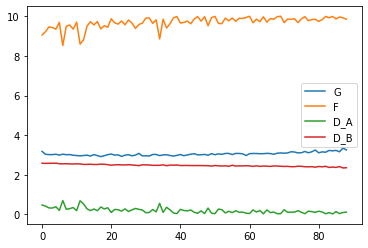

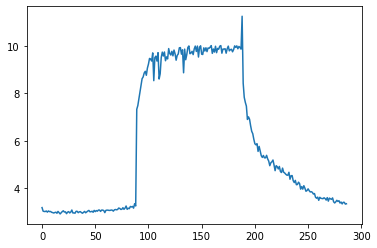

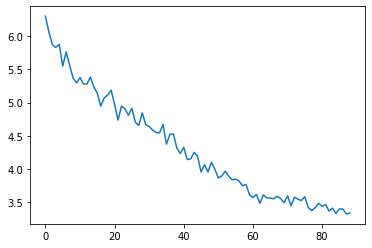

In [ ]:
# loss_D_A_    = []
# loss_D_B_    = []
# loss_GAN_AB_ = []
# loss_GAN_BA_ = []
# loss_cycle_  = []
# total_loss_  = []
import torch
import matplotlib.pyplot as plt

checkpoint   = torch.load('/content/drive/MyDrive/Cycle GAN losses/98')
loss_D_A_     = checkpoint["loss_D_A"] 
loss_D_B_     = checkpoint["loss_D_B"]
loss_GAN_AB_  = checkpoint["loss_GAN_AB"]
loss_GAN_BA_  = checkpoint["loss_GAN_BA"]
loss_cycle_   = checkpoint["loss_cycle"]
# total_loss_ = loss_GAN_AB_ + loss_GAN_BA_ + loss_cycle_


t = 9900
s = 100
loss_D_A_ = [sum(loss_D_A_[i:i+s])/s for i in range(0,t,s)]
loss_D_B_ = [sum(loss_D_B_[i:i+s])/s for i in range(0,t,s)]
loss_GAN_AB_ = [sum(loss_GAN_AB_[i:i+s])/s for i in range(0,t,s)]
loss_GAN_BA_ = [sum(loss_GAN_BA_[i:i+s])/s for i in range(0,t,s)]
loss_cycle_  = [sum(loss_cycle_[i:i+s])/s for i in range(0,t,s)]
# total_loss_  = [sum(total_loss_[i:i+s])/s for i in range(0,t,s)]

plt.figure(0)
plt.plot(loss_GAN_AB_[10:] , label = 'G')
plt.plot(loss_GAN_BA_[10:] , label = 'F')
plt.plot(loss_D_A_[10:] , label = 'D_A')
plt.plot(loss_D_B_[10:] , label = 'D_B')
plt.legend()
plt.savefig("a.png")
plt.show()


total_loss_ = loss_GAN_AB_ + loss_GAN_BA_ + loss_cycle_
plt.figure(1)
plt.plot(total_loss_[10:])

plt.show()

plt.figure(2)
plt.plot(loss_cycle_[10:])
plt.savefig("B.png")
plt.show()

